In [2]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.mosaicplot import mosaic
import plotly.express as px
from scipy.stats import chi2_contingency
import re
pd.set_option('display.max_columns', None)
from dateutil.relativedelta import relativedelta
from sklearn import preprocessing 
from sklearn.preprocessing import OneHotEncoder
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression,LogisticRegressionCV
from sklearn.metrics import accuracy_score, classification_report
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import make_pipeline
from tqdm import tqdm
from sklearn.metrics import roc_curve
from scipy import stats
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc
from statsmodels.stats.outliers_influence import variance_inflation_factor
import featuretools as ft

In [3]:
df = pd.read_csv("logistic_regression.csv")

# Data Anlysis

In [4]:
df.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,dti,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
0,10000.0,36 months,11.44,329.48,B,B4,Marketing,10+ years,RENT,117000.0,Not Verified,Jan-2015,Fully Paid,vacation,Vacation,26.24,Jun-1990,16.0,0.0,36369.0,41.8,25.0,w,INDIVIDUAL,0.0,0.0,"0174 Michelle Gateway\r\nMendozaberg, OK 22690"
1,8000.0,36 months,11.99,265.68,B,B5,Credit analyst,4 years,MORTGAGE,65000.0,Not Verified,Jan-2015,Fully Paid,debt_consolidation,Debt consolidation,22.05,Jul-2004,17.0,0.0,20131.0,53.3,27.0,f,INDIVIDUAL,3.0,0.0,"1076 Carney Fort Apt. 347\r\nLoganmouth, SD 05113"
2,15600.0,36 months,10.49,506.97,B,B3,Statistician,< 1 year,RENT,43057.0,Source Verified,Jan-2015,Fully Paid,credit_card,Credit card refinancing,12.79,Aug-2007,13.0,0.0,11987.0,92.2,26.0,f,INDIVIDUAL,0.0,0.0,"87025 Mark Dale Apt. 269\r\nNew Sabrina, WV 05113"
3,7200.0,36 months,6.49,220.65,A,A2,Client Advocate,6 years,RENT,54000.0,Not Verified,Nov-2014,Fully Paid,credit_card,Credit card refinancing,2.60,Sep-2006,6.0,0.0,5472.0,21.5,13.0,f,INDIVIDUAL,0.0,0.0,"823 Reid Ford\r\nDelacruzside, MA 00813"
4,24375.0,60 months,17.27,609.33,C,C5,Destiny Management Inc.,9 years,MORTGAGE,55000.0,Verified,Apr-2013,Charged Off,credit_card,Credit Card Refinance,33.95,Mar-1999,13.0,0.0,24584.0,69.8,43.0,f,INDIVIDUAL,1.0,0.0,"679 Luna Roads\r\nGreggshire, VA 11650"


In [70]:
df.isna().sum()

loan_amnt                   0
term                        0
int_rate                    0
installment                 0
grade                       0
sub_grade                   0
emp_title               22927
emp_length              18301
home_ownership              0
annual_inc                  0
verification_status         0
issue_d                     0
loan_status                 0
purpose                     0
title                    1756
dti                         0
earliest_cr_line            0
open_acc                    0
pub_rec                     0
revol_bal                   0
revol_util                276
total_acc                   0
initial_list_status         0
application_type            0
mort_acc                37795
pub_rec_bankruptcies      535
address                     0
dtype: int64

In [72]:
df["loan_status"].value_counts(normalize=True)

loan_status
Fully Paid     0.803871
Charged Off    0.196129
Name: proportion, dtype: float64

### comments

Extreme class imabalance 80 % belongs to fully paid class and arond 20 % to charged off class.
Nans found in emp_length,title,revol_util,mort_acc,pub_rec_bankruptcies

## Categoircal column info

In [5]:
def display_categorical_columns_info(df):
    # Identify object type columns
    object_cols = df.select_dtypes(include=['object']).columns
    
    # Iterate over each categorical column
    for col in object_cols:
        unique_values = df[col].unique()
        print(f"Column: {col}")
        print(f"Unique Values ({len(unique_values)}):")
        print(unique_values)
        print("\n") 
        
display_categorical_columns_info(df)

Column: term
Unique Values (2):
[' 36 months' ' 60 months']


Column: grade
Unique Values (7):
['B' 'A' 'C' 'E' 'D' 'F' 'G']


Column: sub_grade
Unique Values (35):
['B4' 'B5' 'B3' 'A2' 'C5' 'C3' 'A1' 'B2' 'C1' 'A5' 'E4' 'A4' 'A3' 'D1'
 'C2' 'B1' 'D3' 'D5' 'D2' 'E1' 'E2' 'E5' 'F4' 'E3' 'D4' 'G1' 'F5' 'G2'
 'C4' 'F1' 'F3' 'G5' 'G4' 'F2' 'G3']


Column: emp_title
Unique Values (173106):
['Marketing' 'Credit analyst ' 'Statistician' ...
 "Michael's Arts & Crafts" 'licensed bankere' 'Gracon Services, Inc']


Column: emp_length
Unique Values (12):
['10+ years' '4 years' '< 1 year' '6 years' '9 years' '2 years' '3 years'
 '8 years' '7 years' '5 years' '1 year' nan]


Column: home_ownership
Unique Values (6):
['RENT' 'MORTGAGE' 'OWN' 'OTHER' 'NONE' 'ANY']


Column: verification_status
Unique Values (3):
['Not Verified' 'Source Verified' 'Verified']


Column: issue_d
Unique Values (115):
['Jan-2015' 'Nov-2014' 'Apr-2013' 'Sep-2015' 'Sep-2012' 'Oct-2014'
 'Apr-2012' 'Jun-2013' 'May-2014' 'Dec-2

### From above it is evident that there are lots of categorical columns and has a good number of categories but categories like other has multiple occurance in same column due to upper and lower case difference. Lets preprocess the data by converting all to lower case and stripping any white spaces

In [4]:
def clean_categorical_columns(df):
    # Identify object type columns
    object_cols = df.select_dtypes(include=['object']).columns
    
    # Iterate over each categorical column
    for col in object_cols:
        # Convert values to lowercase and strip whitespace
        df[col] = df[col].str.lower().str.strip()
    
    return df
df = clean_categorical_columns(df)

# Plotting categorical column vs Target

Processing column: term


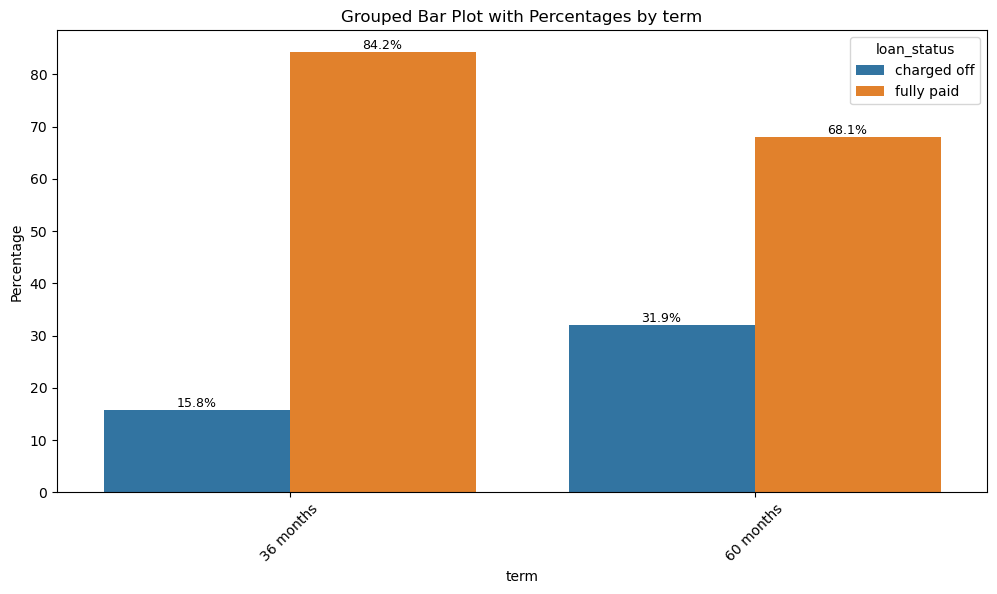

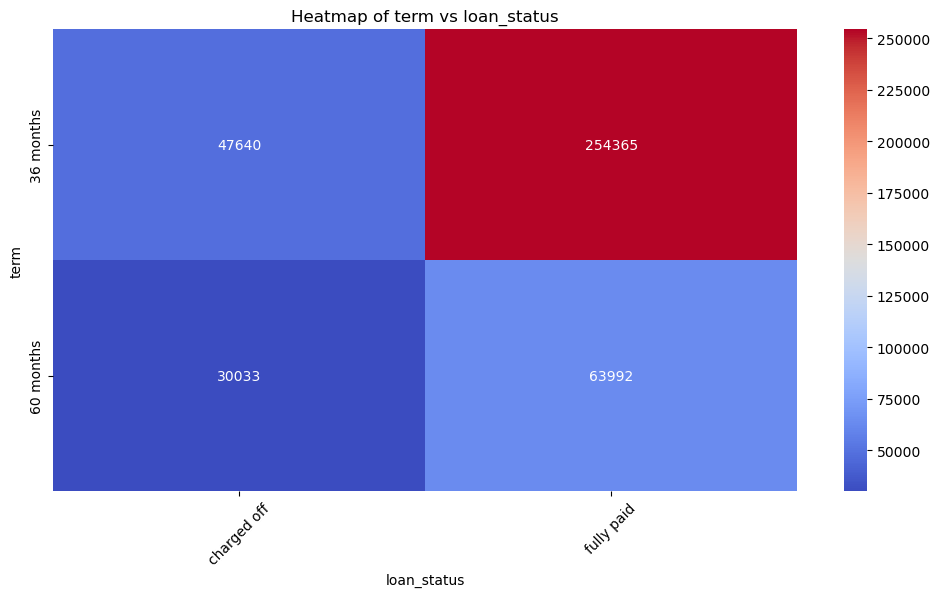

Processing column: grade


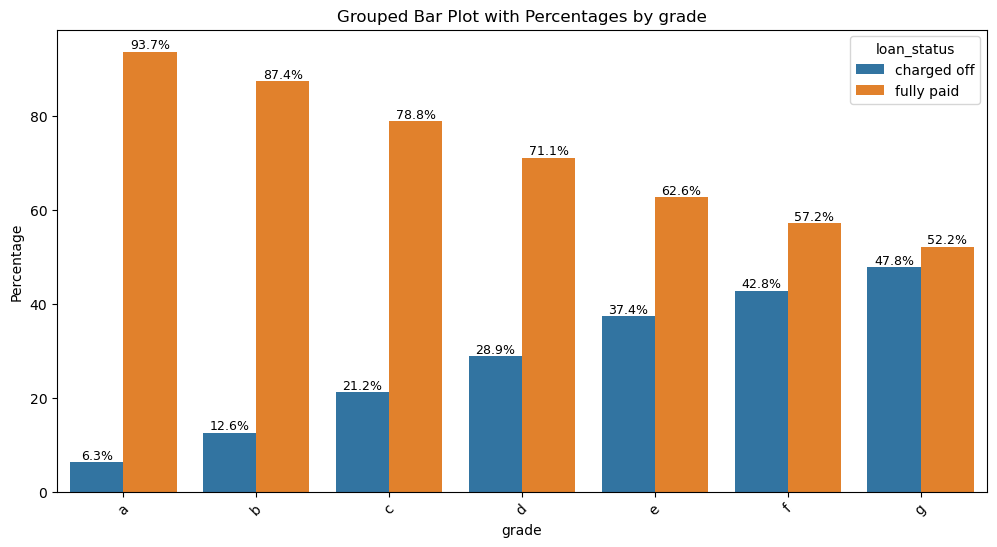

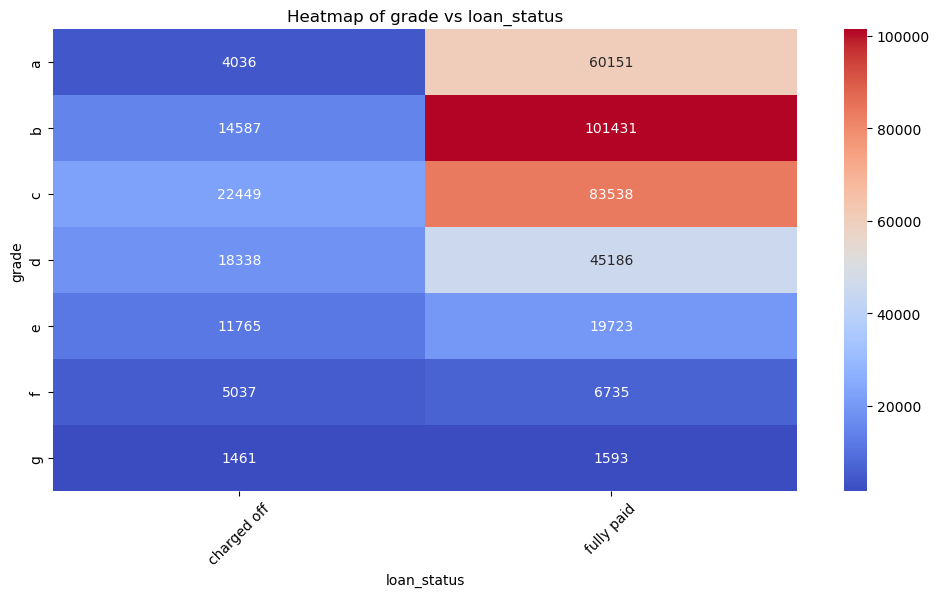

Processing column: sub_grade


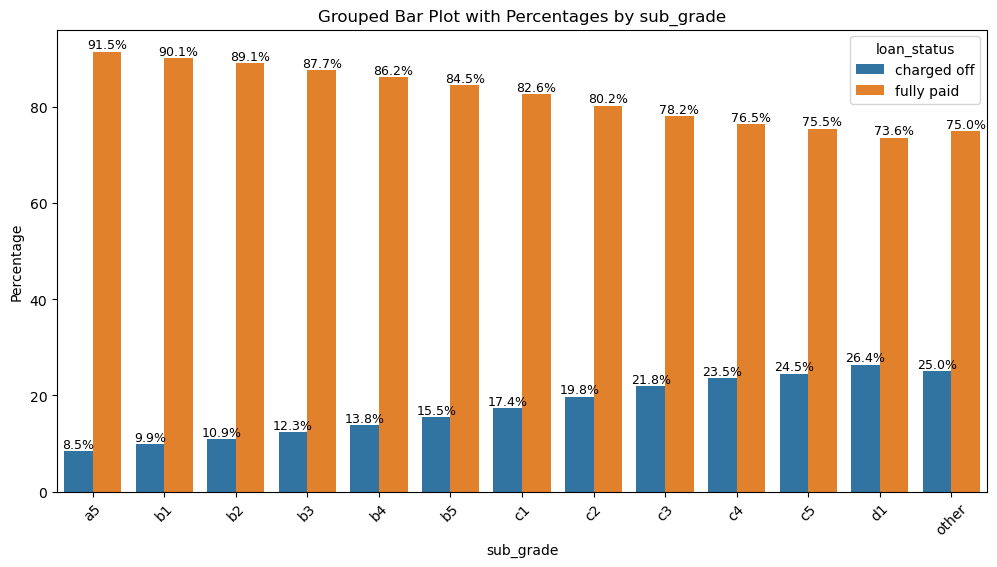

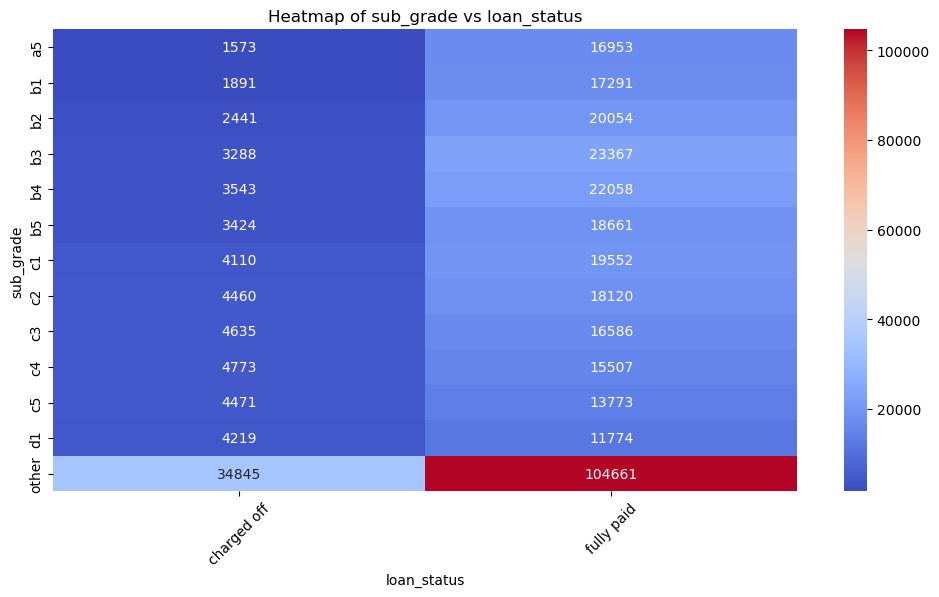

Processing column: emp_title


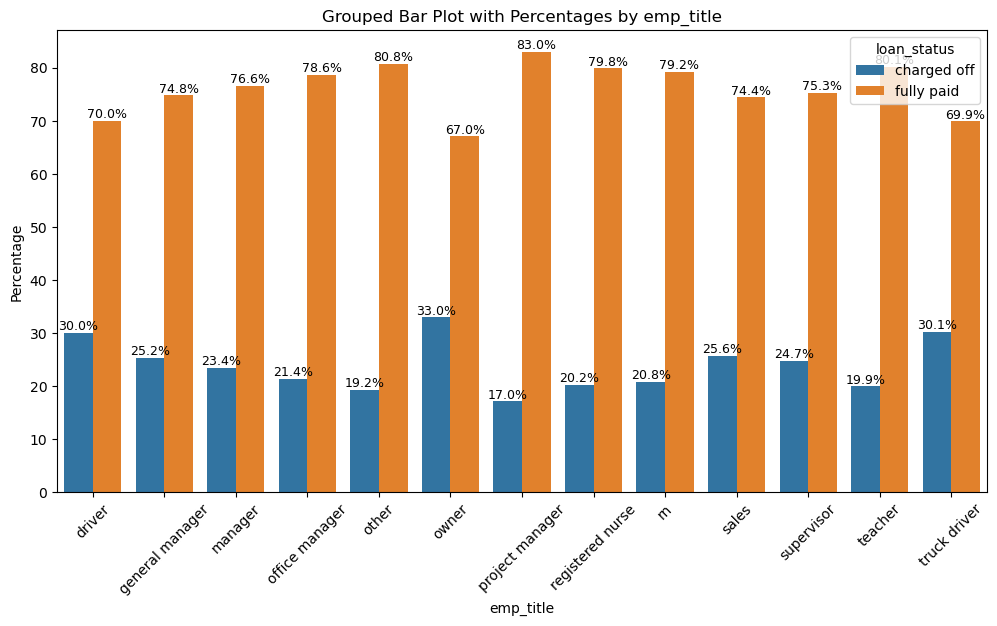

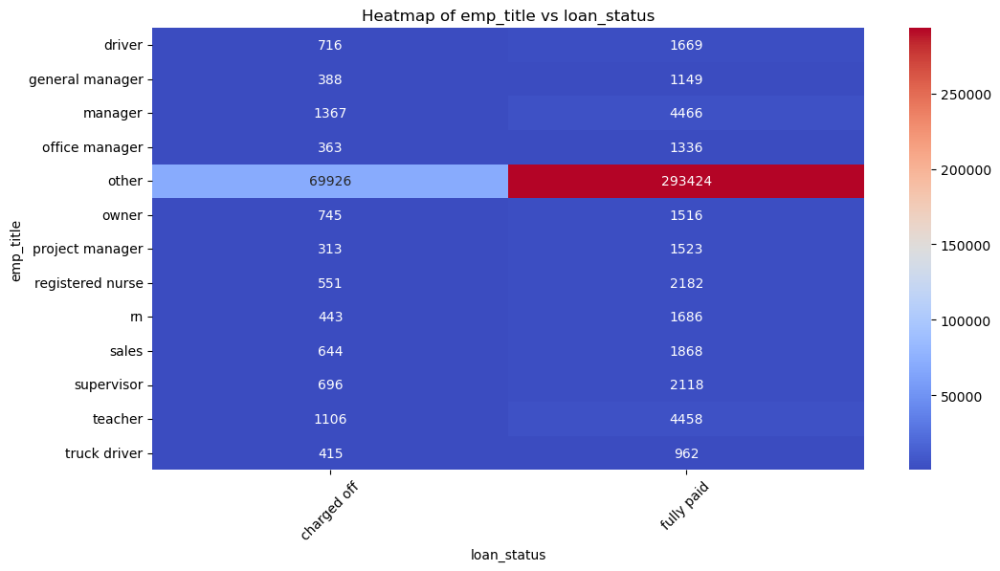

Processing column: emp_length


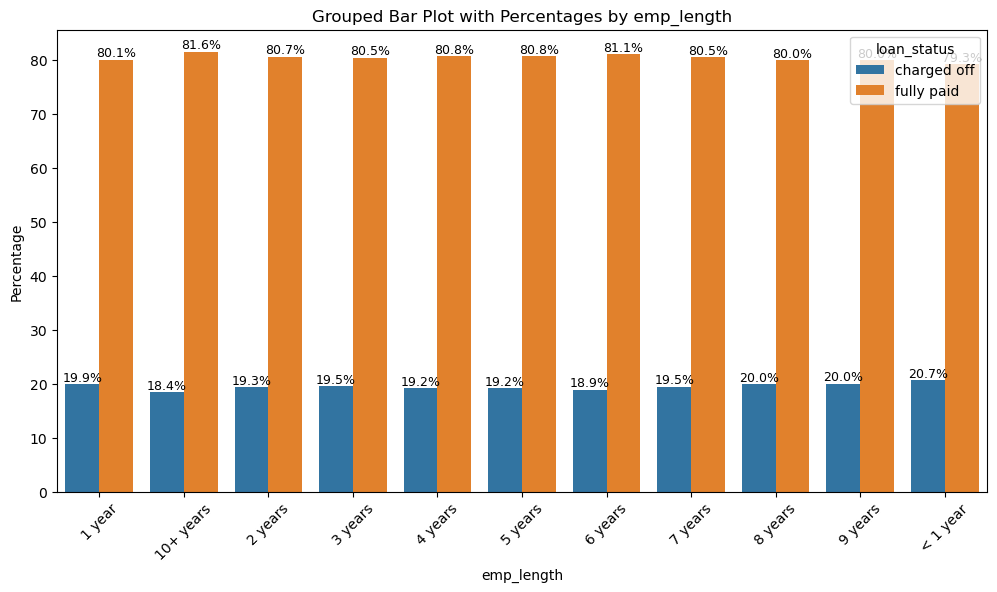

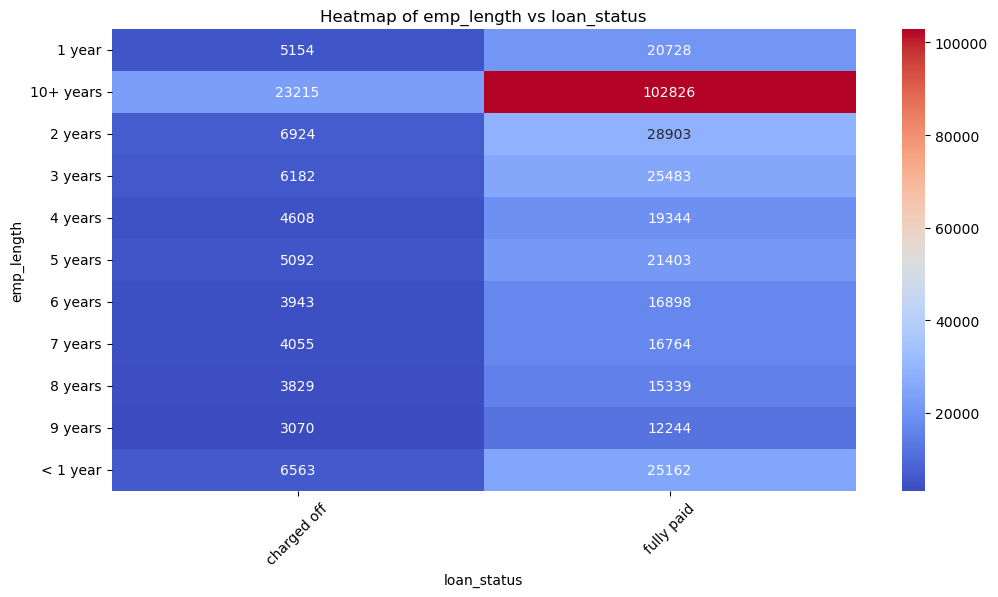

Processing column: home_ownership


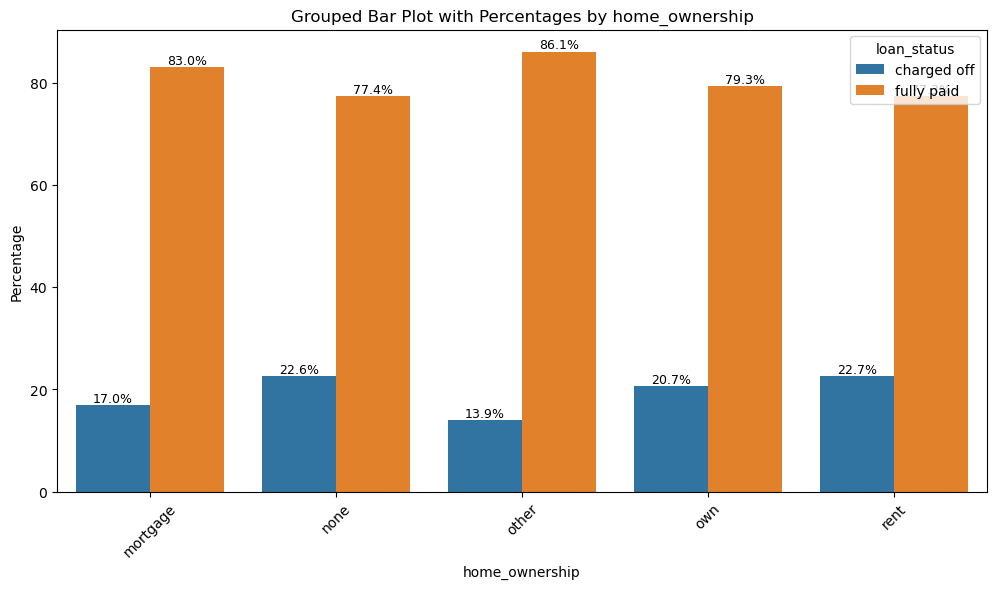

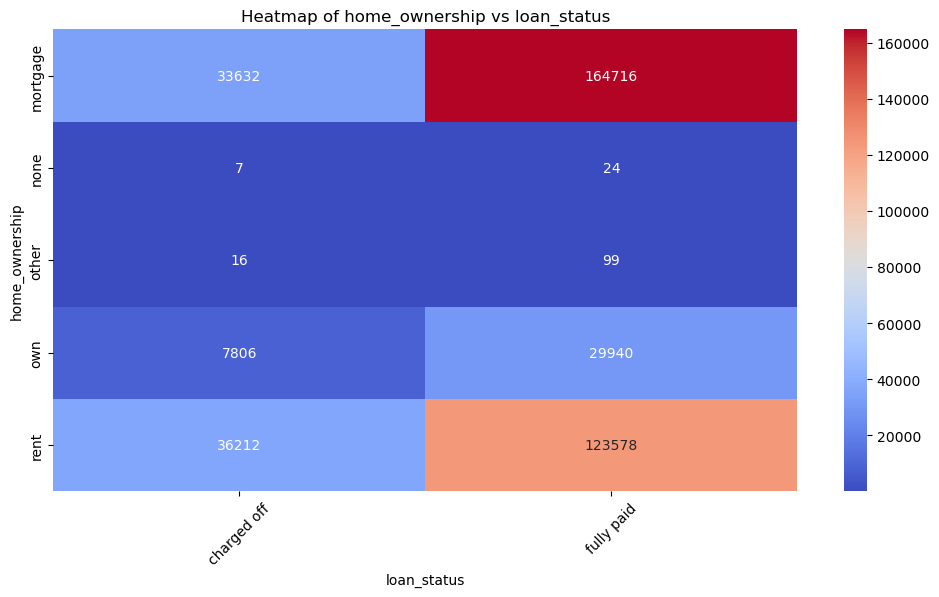

Processing column: verification_status


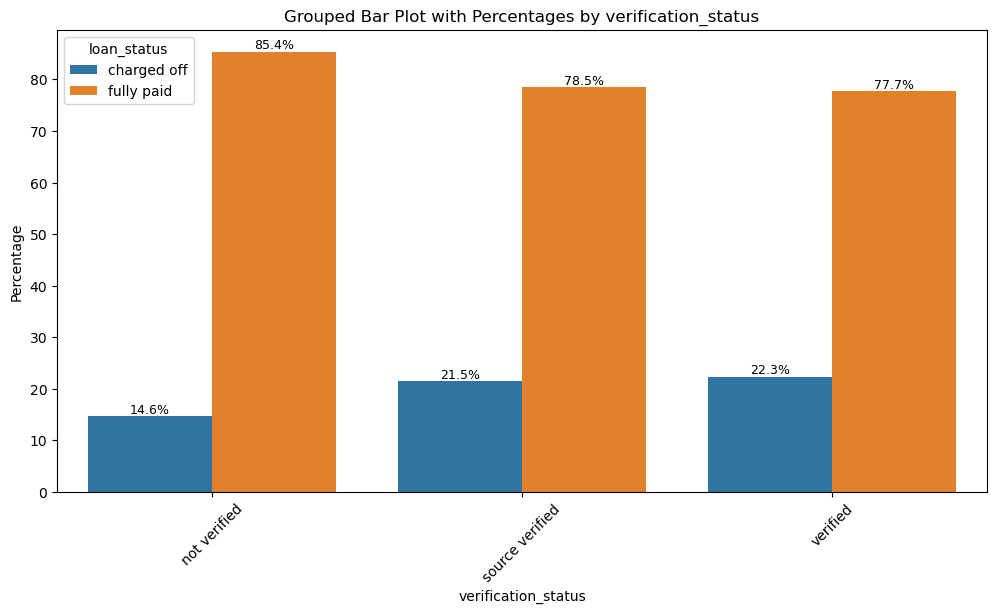

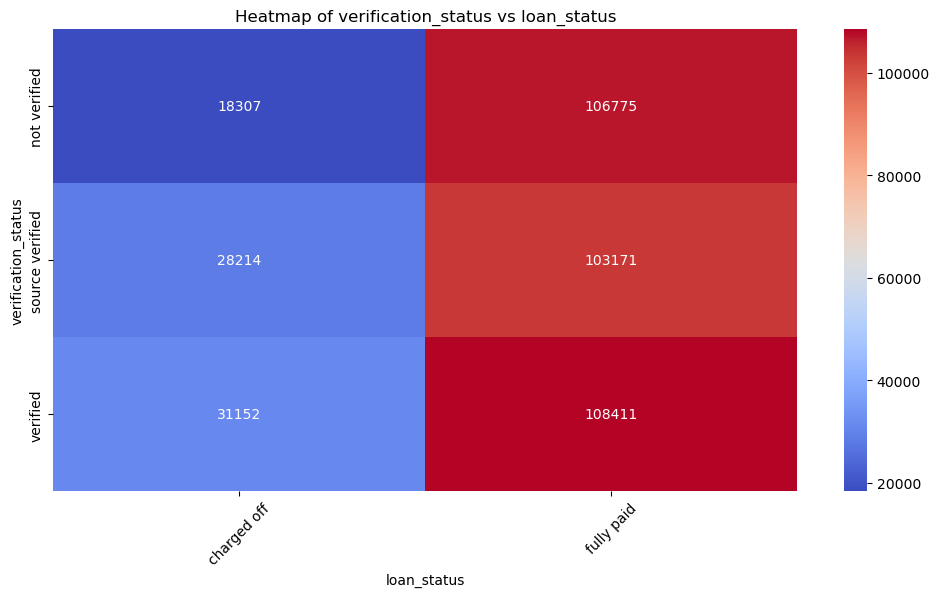

Processing column: issue_d


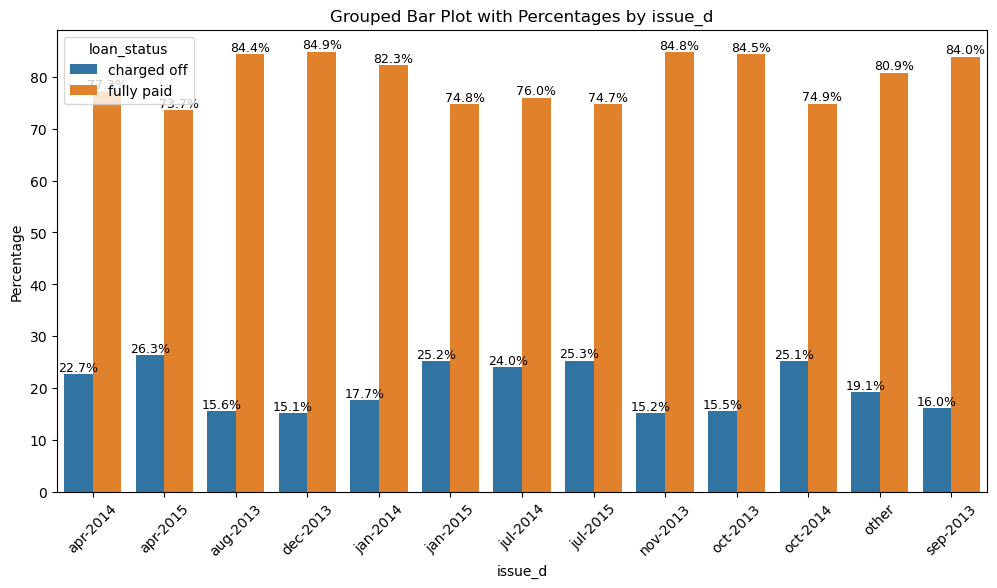

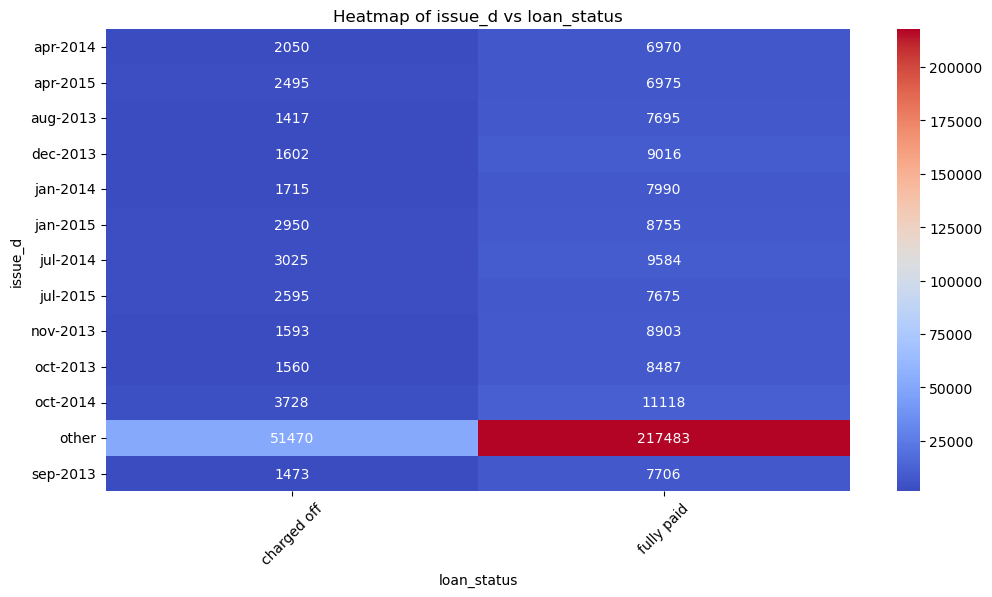

Processing column: purpose


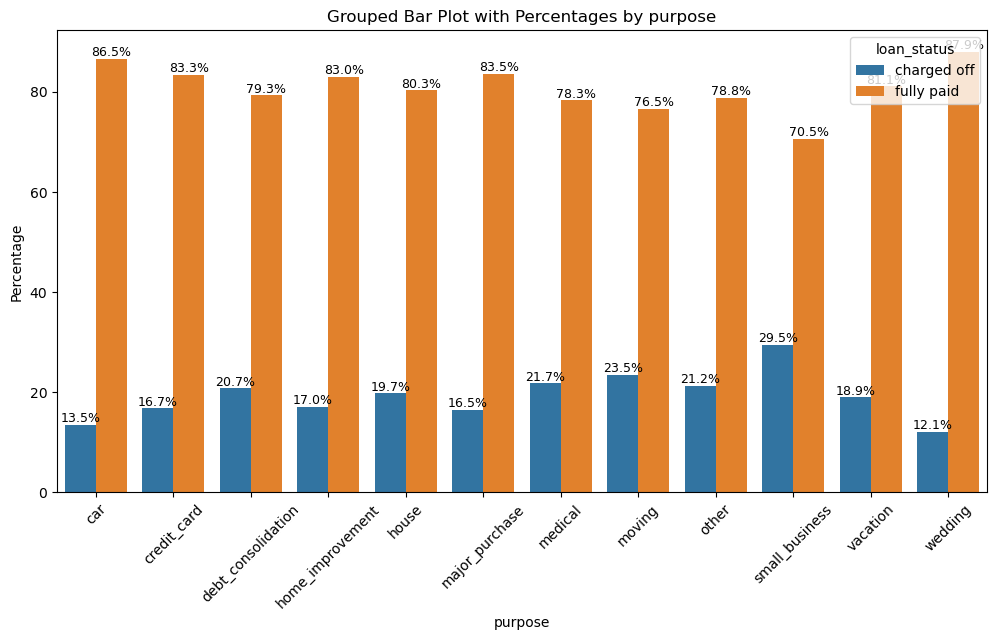

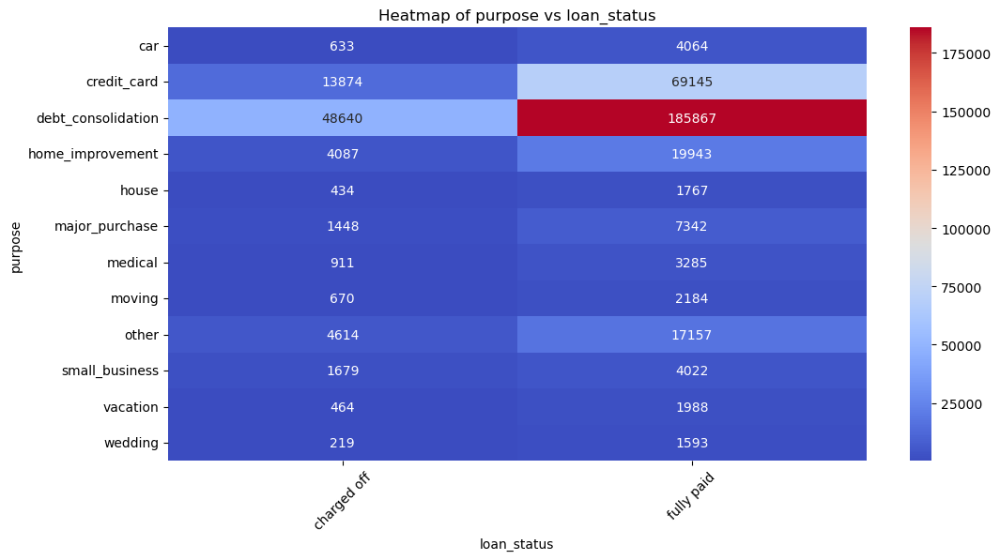

Processing column: title


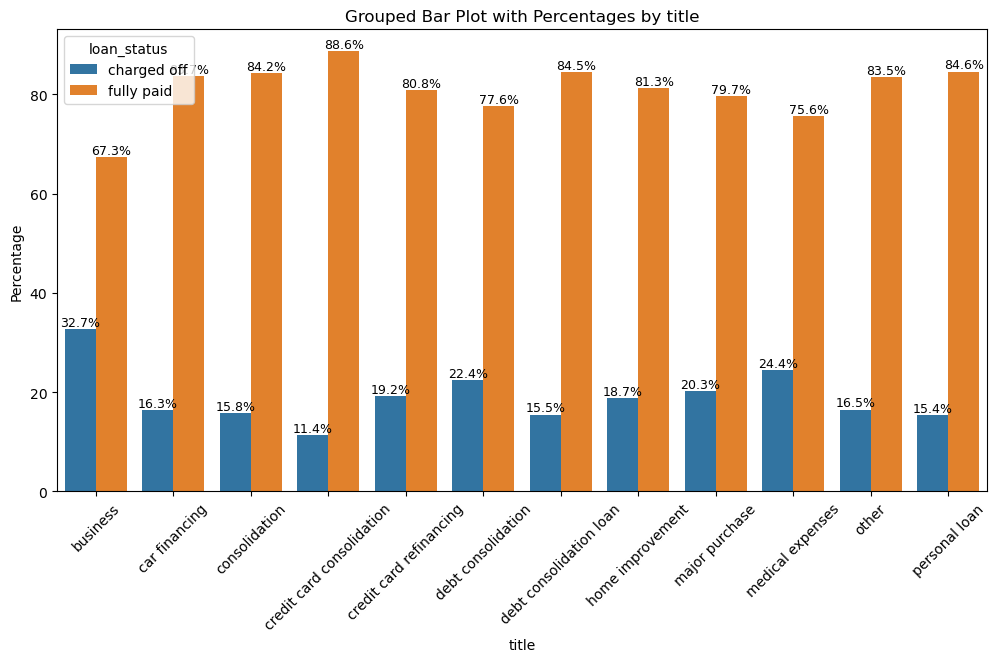

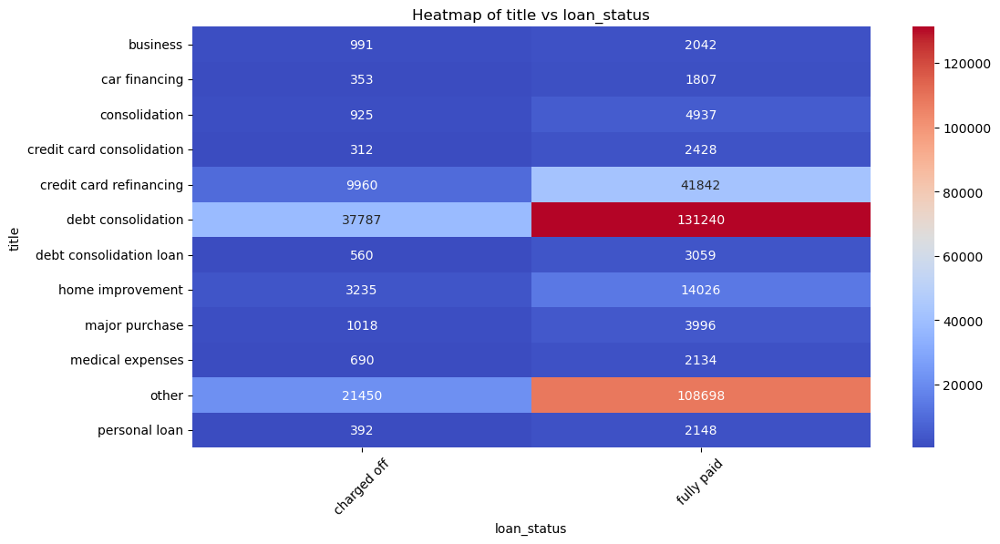

Processing column: earliest_cr_line


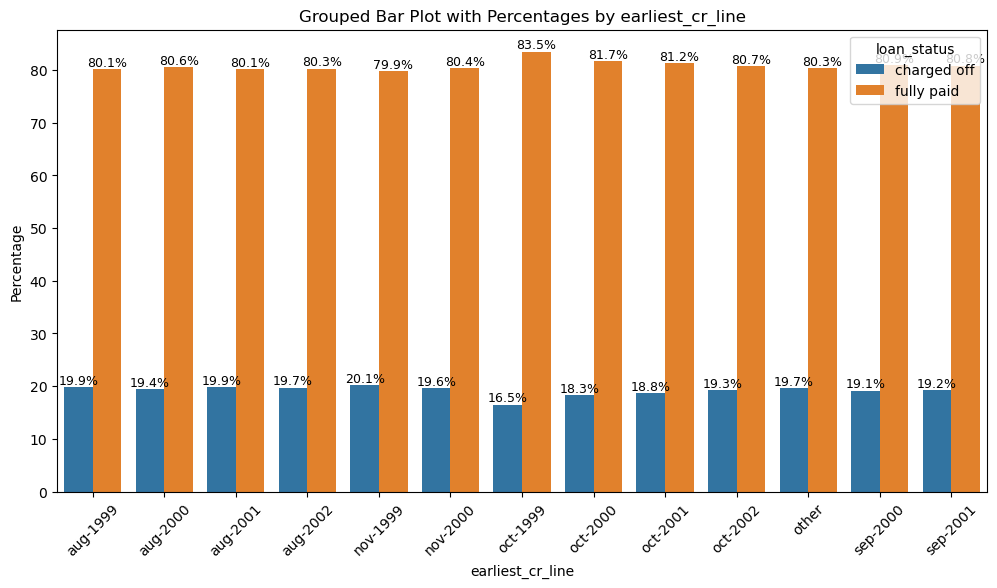

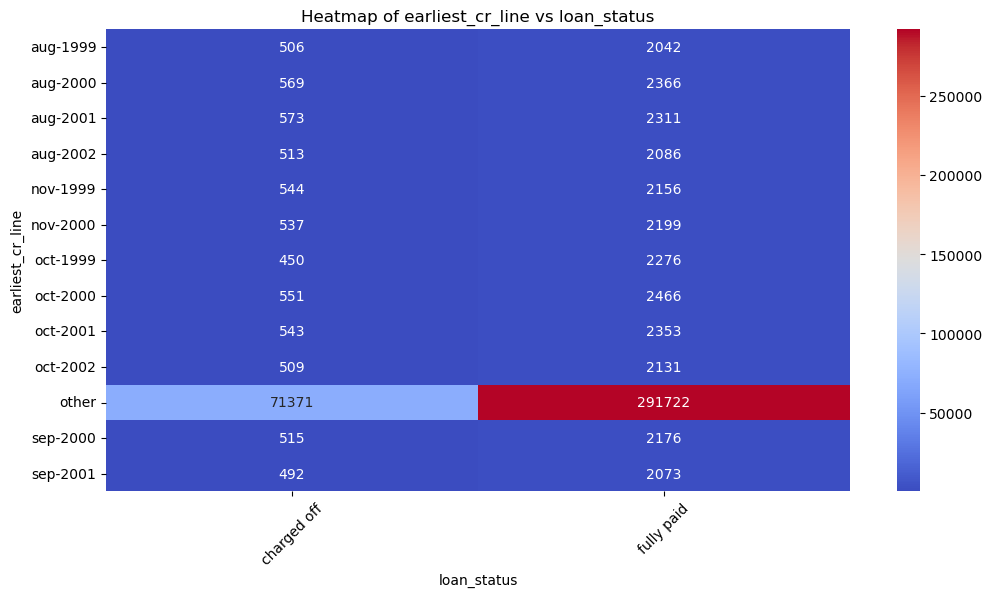

Processing column: initial_list_status


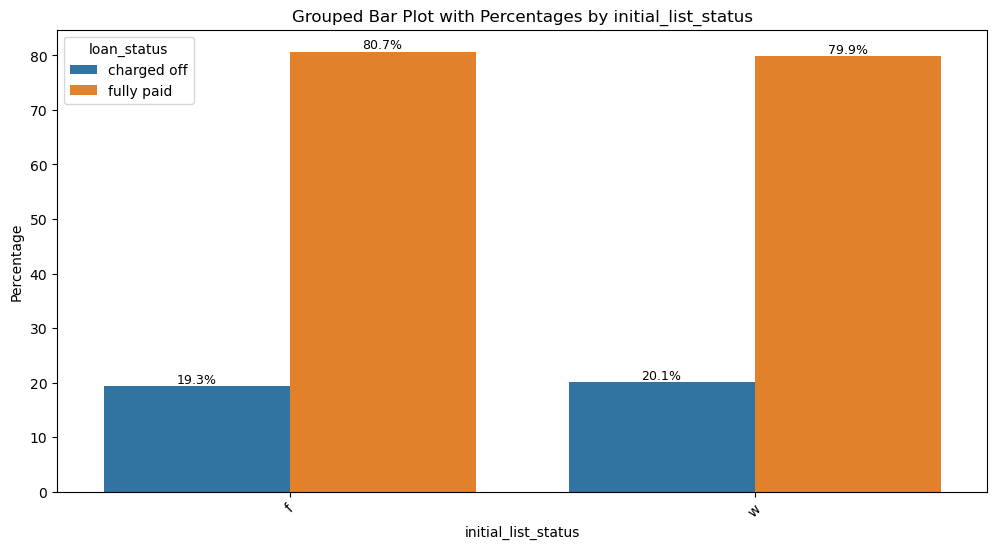

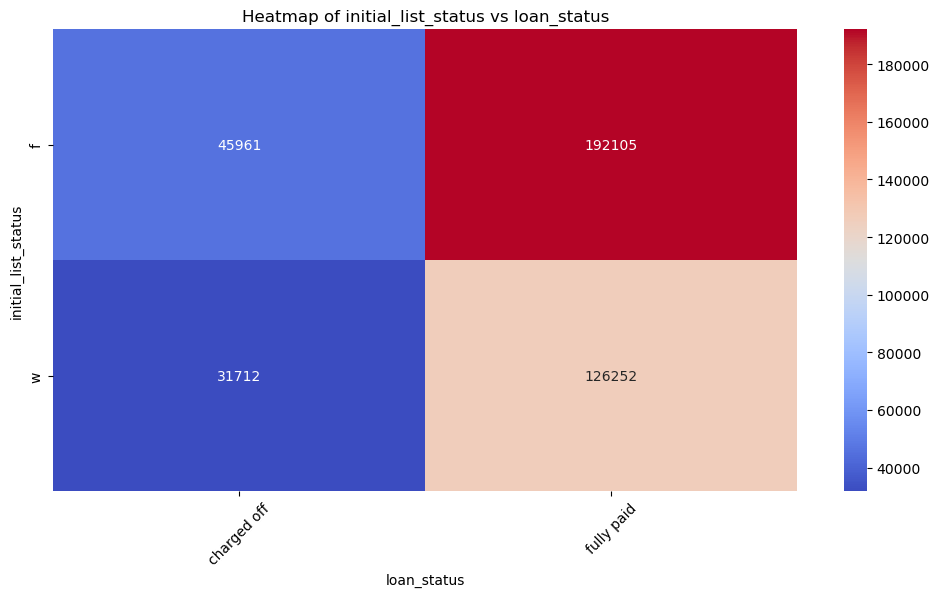

Processing column: application_type


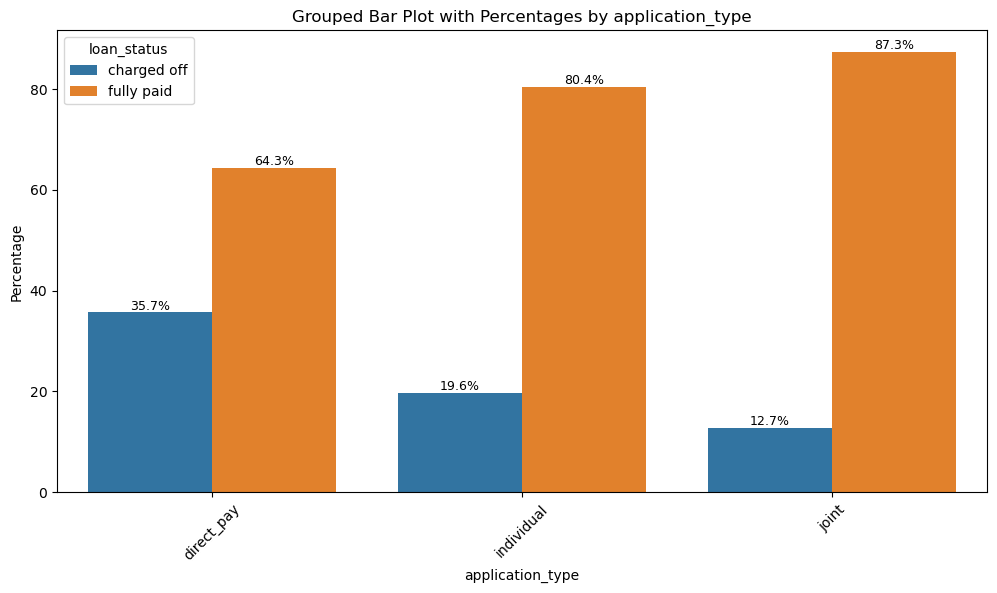

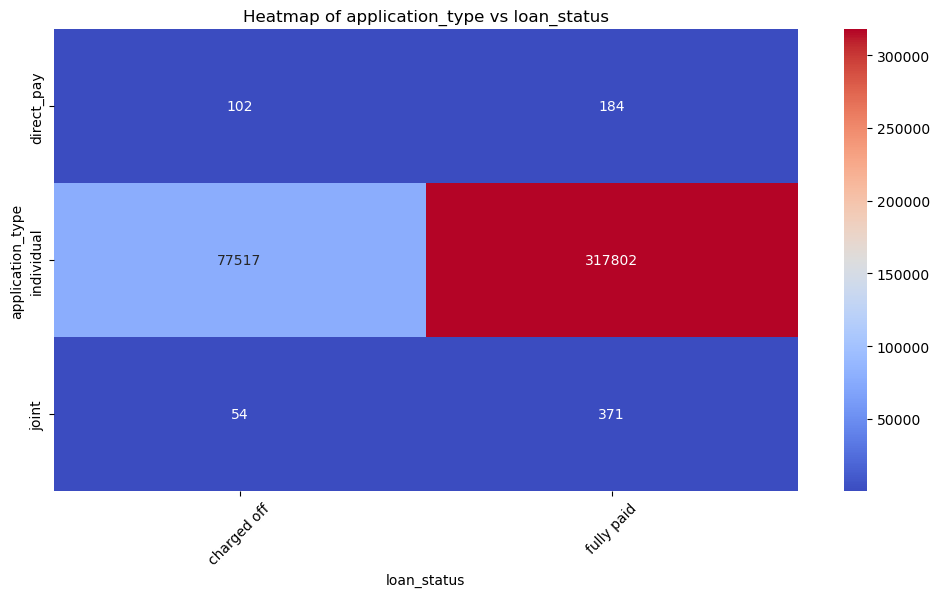

Processing column: address


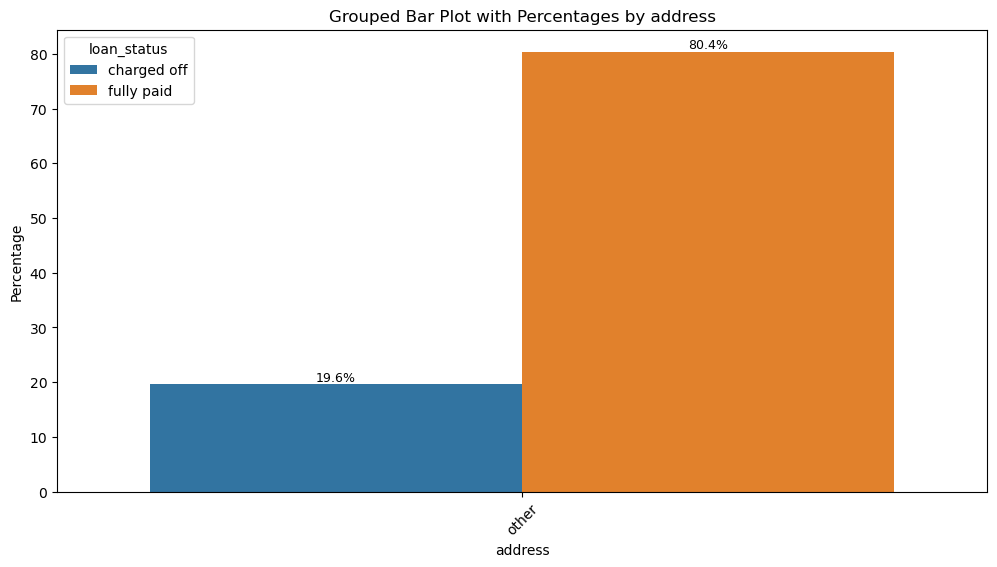

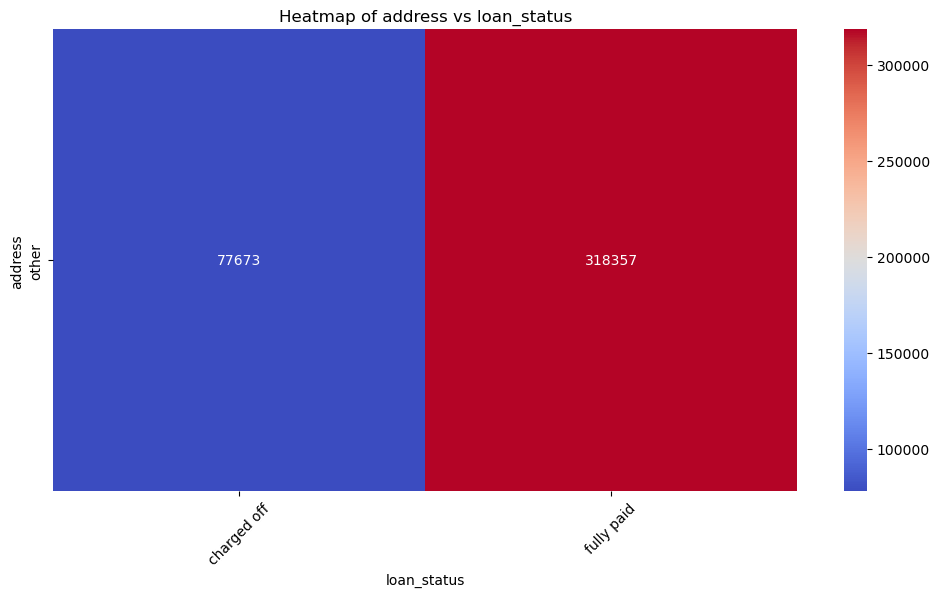

In [6]:
def plot_categorical_columns(plot, target='loan_status', top_n=12, threshold=10):
    # Check if the target column exists
    if target not in plot.columns:
        raise ValueError(f"Target column '{target}' not found in DataFrame")

    # Identify object type columns
    object_cols = plot.select_dtypes(include=['object']).columns
    if target in object_cols:
        object_cols = object_cols[object_cols != target]

    # Function to plot for each column
    def plot_for_column(col):
        print(f"Processing column: {col}")

        # Handle large number of categories
        value_counts = plot[col].value_counts()
        if len(value_counts) > top_n:
            top_categories = value_counts.nlargest(top_n).index
            plot[col] = plot[col].apply(lambda x: x if x in top_categories else 'other')
        
        # Aggregate less frequent categories
        value_counts = plot[col].value_counts()
        less_frequent = value_counts[value_counts < threshold].index
        plot[col] = plot[col].replace(less_frequent, 'other')

        # Compute counts for grouped bar plot
        counts = plot.groupby([col, target]).size().reset_index(name='count')
        total_counts = counts.groupby(col)['count'].sum().reset_index(name='total')
        counts = counts.merge(total_counts, on=col)
        counts['percentage'] = counts['count'] / counts['total'] * 100

        # Plot grouped bar plot with percentages
        plt.figure(figsize=(12, 6))
        ax = sns.barplot(data=counts, x=col, y='percentage', hue=target)
        for p in ax.patches:
            height = p.get_height()
            if height > 0:
                x = p.get_x() + p.get_width() / 2
                y = height
                percentage = f'{height:.1f}%'
                ax.text(x, y, percentage, ha='center', va='bottom', fontsize=9, color='black')
        plt.title(f'Grouped Bar Plot with Percentages by {col}')
        plt.xlabel(col)
        plt.ylabel('Percentage')
        plt.legend(title=target)
        plt.xticks(rotation=45)
        plt.show()

        # Create a crosstab for heatmap
        pivot_table = pd.crosstab(plot[col], plot[target])
        
        # Plot heatmap
        plt.figure(figsize=(12, 6))
        sns.heatmap(pivot_table, annot=True, cmap='coolwarm', fmt='d')
        plt.title(f'Heatmap of {col} vs {target}')
        plt.xlabel(target)
        plt.ylabel(col)
        plt.xticks(rotation=45)
        plt.show()

    # Plot for each categorical column
    for col in object_cols:
        plot_for_column(col)

plot = df.copy()

plot_categorical_columns(plot)

# Unique Values 

In [25]:
for i in df.columns:
    print(i,df[i].nunique())
    print("="*100)

loan_amnt 1397
term 2
int_rate 566
installment 55706
grade 7
sub_grade 35
emp_title 149260
emp_length 11
home_ownership 6
annual_inc 27197
verification_status 3
issue_d 115
loan_status 2
purpose 14
title 40139
dti 4262
earliest_cr_line 684
open_acc 61
pub_rec 20
revol_bal 55622
revol_util 1226
total_acc 118
initial_list_status 2
application_type 3
mort_acc 33
pub_rec_bankruptcies 9
address 393700


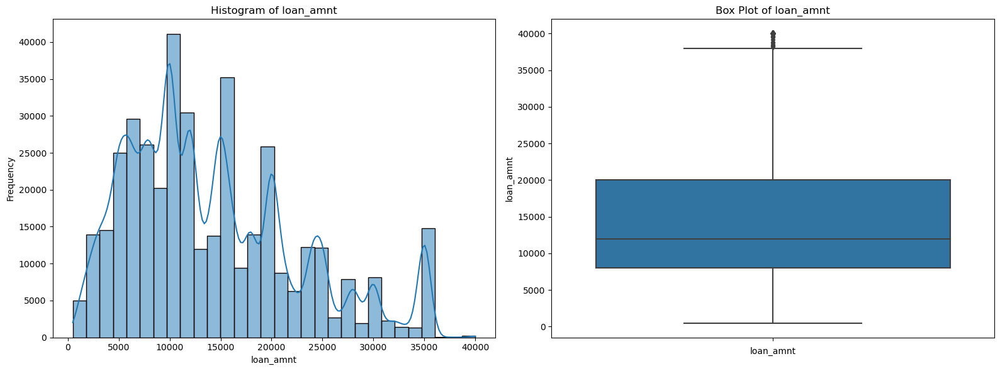

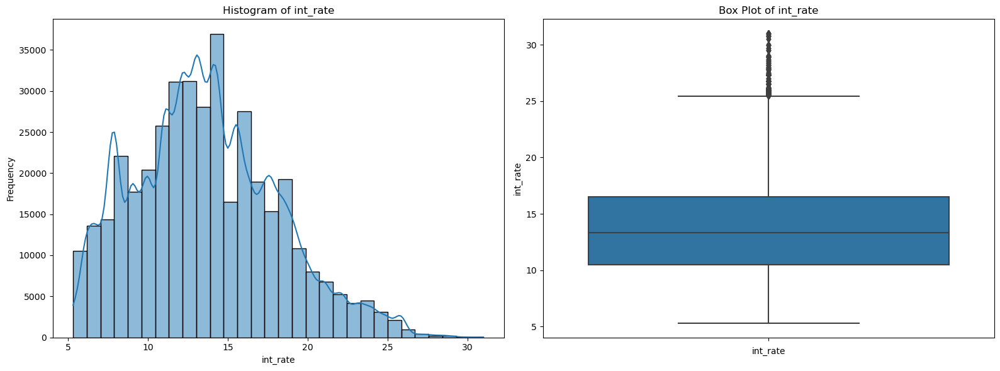

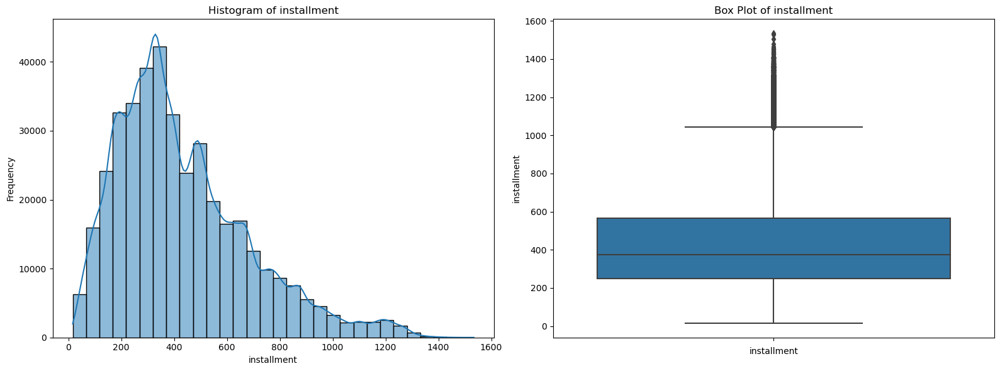

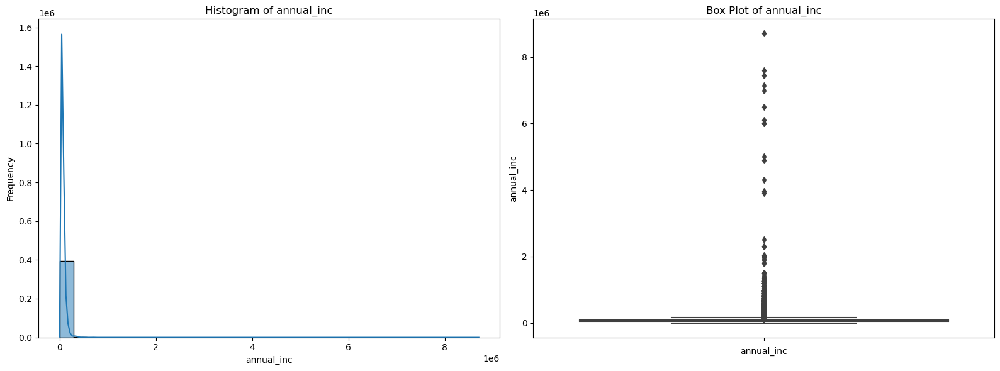

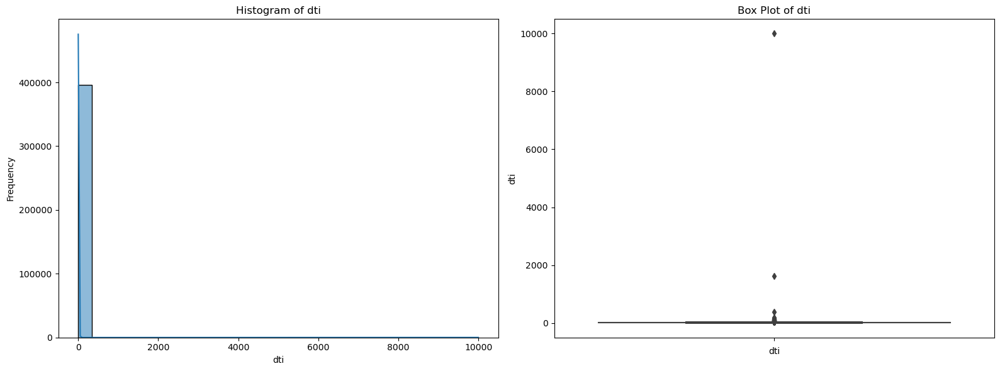

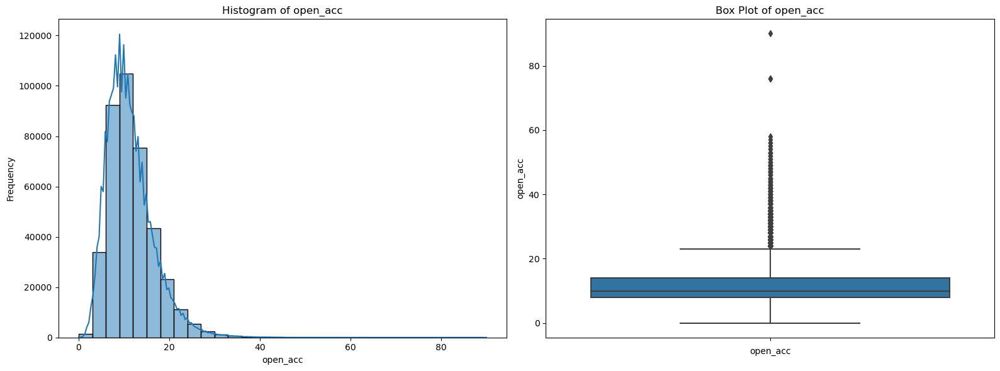

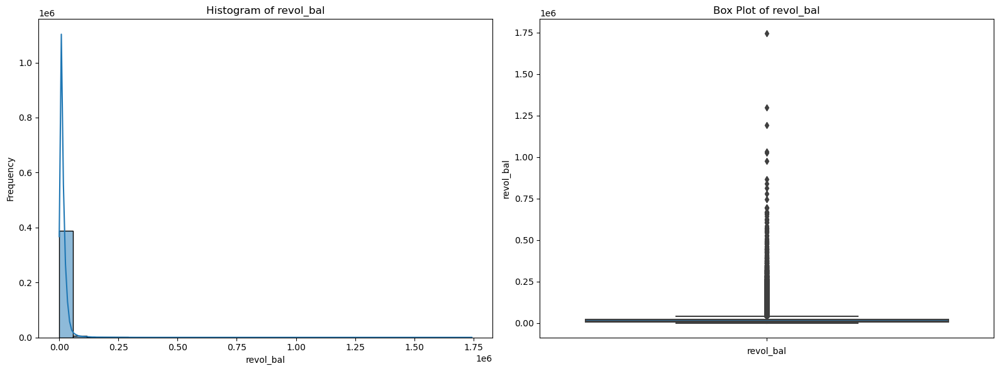

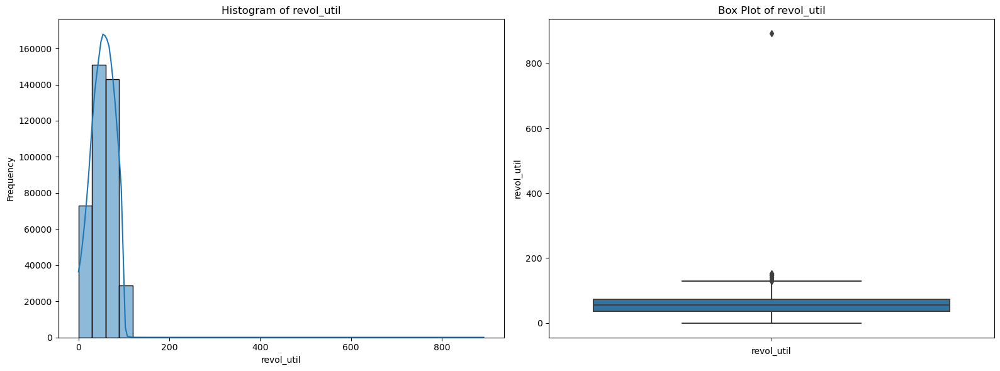

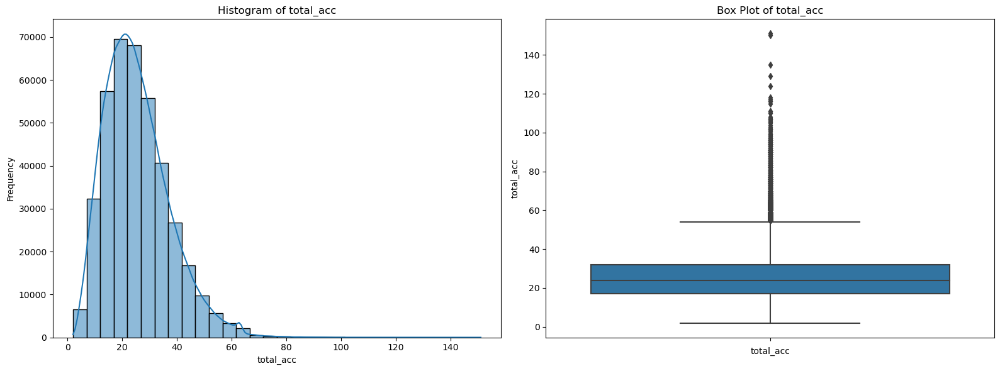

In [30]:
def plot_continuous_columns_side_by_side(df, unique_value_threshold=40):
    # Identify numerical columns with more than the unique value threshold
    numeric_cols = df.select_dtypes(include=['number']).columns
    high_cardinality_cols = [col for col in numeric_cols if df[col].nunique() > unique_value_threshold]
    
    # Check if there are any columns to plot
    if not high_cardinality_cols:
        print(f"No columns with more than {unique_value_threshold} unique values found.")
        return
    
    # Create side-by-side plots for each high cardinality column
    for col in high_cardinality_cols:
        # Create a figure with two subplots (side by side)
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        
        # Histogram Plot
        sns.histplot(df[col], kde=True, bins=30, ax=axes[0])
        axes[0].set_title(f'Histogram of {col}')
        axes[0].set_xlabel(col)
        axes[0].set_ylabel('Frequency')
        
        # Box Plot
        sns.boxplot(y=df[col], ax=axes[1])
        axes[1].set_title(f'Box Plot of {col}')
        axes[1].set_xlabel(col)
        
        # Adjust layout
        plt.tight_layout()
        plt.show()


plot_continuous_columns_side_by_side(df)

# Outlier Detection

In [40]:
def find_outliers(df):
    # Identify numerical columns
    numeric_cols = df.select_dtypes(include=['number']).columns
    
    for col in numeric_cols:
        # Calculate Q1 (25th percentile) and Q3 (75th percentile)
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        
        # Determine outlier bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Find outliers and categorize them
        lower_bound_outliers = df[df[col] < lower_bound]
        upper_bound_outliers = df[df[col] > upper_bound]
        
        total_outliers = pd.concat([lower_bound_outliers, upper_bound_outliers])
        total_outliers['Outlier_Type'] = 'Lower Bound'
        total_outliers.loc[df[col] > upper_bound, 'Outlier_Type'] = 'Upper Bound'
        
        # Print outliers information
        print(f"Column: {col}")
        print(f"Lower Bound: {lower_bound}")
        print(f"Upper Bound: {upper_bound}")
        print(f"Number of Outliers Below Lower Bound: {len(lower_bound_outliers)}")
        print(f"Number of Outliers Above Upper Bound: {len(upper_bound_outliers)}")
        print(f"Total Number of Outliers: {len(total_outliers)}")
        display(total_outliers.head())
        print("\n")
        
find_outliers(df)

Column: loan_amnt
Lower Bound: -10000.0
Upper Bound: 38000.0
Number of Outliers Below Lower Bound: 0
Number of Outliers Above Upper Bound: 191
Total Number of Outliers: 191


,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address,Outlier_Type
3998,40000.0,60 months,22.45,1115.02,e,e5,senior project engineer,8 years,own,92885.0,...,0.0,44216.0,59.0,41.0,w,individual,7.0,0.0,"402 strickland path suite 790\r\nwattsborough,...",Upper Bound
4788,40000.0,60 months,8.39,818.55,b,b1,partner,6 years,mortgage,655000.0,...,0.0,205916.0,7.0,22.0,f,individual,8.0,0.0,"6423 obrien dale apt. 994\r\nsouth darryl, mo ...",Upper Bound
6093,38225.0,36 months,25.69,1533.81,f,f1,general manager,3 years,mortgage,320000.0,...,1.0,47806.0,28.2,77.0,f,individual,8.0,1.0,"39219 andrew canyon\r\ngallowayshire, ok 30723",Upper Bound
7456,40000.0,36 months,15.59,1398.20,c,c5,nursing mgr,3 years,mortgage,180000.0,...,0.0,4249.0,3.3,45.0,w,individual,4.0,0.0,"79951 ward walks apt. 408\r\nkerrbury, va 00813",Upper Bound
8391,40000.0,36 months,5.32,1204.60,a,a1,vice president digital security services,< 1 year,rent,455000.0,...,0.0,2535.0,14.1,26.0,w,individual,7.0,0.0,"521 barry stravenue suite 623\r\nnorth kristy,...",Upper Bound




Column: int_rate
Lower Bound: 1.4900000000000038
Upper Bound: 25.489999999999995
Number of Outliers Below Lower Bound: 0
Number of Outliers Above Upper Bound: 3777
Total Number of Outliers: 3777


,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address,Outlier_Type
96,12625.0,60 months,25.78,376.36,f,f5,nursing assistant,7 years,mortgage,43000.0,...,0.0,19993.0,55.7,31.0,w,individual,1.0,0.0,"522 melissa village\r\neast janice, mt 00813",Upper Bound
97,13400.0,60 months,25.83,399.86,g,g2,designer,10+ years,mortgage,56000.0,...,0.0,28845.0,84.5,44.0,w,individual,6.0,0.0,"0326 jacob via\r\njacksonstad, mi 93700",Upper Bound
133,13075.0,60 months,27.31,401.68,g,g2,clerk-specialist level,10+ years,mortgage,54777.0,...,0.0,3845.0,59.2,27.0,f,individual,2.0,0.0,1532 gill greens apt. 236\r\nsouth cassandrafu...,Upper Bound
168,11800.0,60 months,28.99,374.49,g,g5,NaN,NaN,rent,44011.0,...,1.0,6313.0,67.2,13.0,f,individual,0.0,1.0,3019 smith manors suite 402\r\nlake anthonybur...,Upper Bound
204,34350.0,60 months,28.99,1090.13,g,g5,quality improvement data analyst,3 years,rent,84000.0,...,1.0,8400.0,85.7,23.0,w,individual,0.0,1.0,"5050 gomez mill suite 557\r\neast adamton, sd ...",Upper Bound




Column: installment
Lower Bound: -225.12499999999986
Upper Bound: 1042.7549999999999
Number of Outliers Below Lower Bound: 0
Number of Outliers Above Upper Bound: 11250
Total Number of Outliers: 11250


,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address,Outlier_Type
11,35000.0,36 months,14.64,1207.13,c,c3,director bureau of equipment inventory,8 years,mortgage,130000.00,...,0.0,81263.0,18.7,61.0,w,individual,4.0,0.0,"3126 sean dale apt. 141\r\nsouth matthew, ms 0...",Upper Bound
18,34000.0,36 months,7.90,1063.87,a,a4,pilot,10+ years,rent,130580.00,...,0.0,8767.0,11.9,36.0,f,individual,3.0,0.0,"254 mary ferry\r\nport kirstenborough, co 70466",Upper Bound
57,35000.0,36 months,14.16,1198.94,c,c2,administrator,9 years,mortgage,118497.84,...,0.0,8148.0,83.1,59.0,f,individual,3.0,0.0,"578 smith view suite 106\r\nmiguelfort, in 29597",Upper Bound
95,30000.0,36 months,16.49,1061.99,d,d3,sergeant major,10+ years,rent,101000.00,...,1.0,6080.0,76.0,15.0,f,individual,2.0,1.0,"2528 herrera track suite 897\r\nsavannahburgh,...",Upper Bound
103,30000.0,36 months,15.31,1044.52,c,c2,alice g. alatorre dds.,9 years,mortgage,108000.00,...,0.0,19430.0,84.8,15.0,w,individual,0.0,0.0,"453 murray stream\r\nsouth cathyfort, il 93700",Upper Bound




Column: annual_inc
Lower Bound: -22500.0
Upper Bound: 157500.0
Number of Outliers Below Lower Bound: 0
Number of Outliers Above Upper Bound: 16700
Total Number of Outliers: 16700


,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address,Outlier_Type
87,30000.0,60 months,24.70,875.28,g,g1,medtronic,5 years,mortgage,187321.0,...,0.0,54810.0,93.4,52.0,f,individual,3.0,0.0,"25281 kevin neck\r\narmstrongton, tn 29597",Upper Bound
139,20000.0,36 months,10.37,648.83,b,b3,hp,< 1 year,mortgage,170000.0,...,0.0,140820.0,76.2,19.0,f,individual,NaN,0.0,uscgc miller\r\nfpo ae 22690,Upper Bound
195,24000.0,60 months,24.50,697.42,f,f3,lieutenant,10+ years,mortgage,224000.0,...,0.0,5807.0,58.1,32.0,f,individual,6.0,0.0,"psc 8266, box 8855\r\napo ap 11650",Upper Bound
221,25000.0,60 months,12.49,562.33,b,b5,director information technology,10+ years,rent,170000.0,...,0.0,2390.0,5.4,13.0,f,individual,0.0,0.0,"381 garcia hollow\r\nwest oliviaport, ak 05113",Upper Bound
228,35000.0,36 months,12.99,1179.12,c,c2,lawyer partner,10+ years,mortgage,350000.0,...,0.0,216194.0,45.4,43.0,w,individual,2.0,0.0,90980 melissa cliffs suite 259\r\nport angelic...,Upper Bound




Column: dti
Lower Bound: -6.270000000000001
Upper Bound: 40.53
Number of Outliers Below Lower Bound: 0
Number of Outliers Above Upper Bound: 275
Total Number of Outliers: 275


,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address,Outlier_Type
885,10000.0,36 months,16.29,353.01,d,d1,NaN,NaN,rent,25000.0,...,1.0,3709.0,14.7,21.0,w,direct_pay,0.0,1.0,"34046 stephanie throughway\r\nerikstad, mn 93700",Upper Bound
1291,10000.0,36 months,11.47,329.62,b,b5,knot sawer,7 years,mortgage,22000.0,...,0.0,5906.0,53.7,33.0,w,joint,2.0,0.0,usnv gray\r\nfpo ap 48052,Upper Bound
3169,8750.0,36 months,17.27,313.14,d,d2,sales analyst,8 years,own,69000.0,...,0.0,14849.0,31.9,27.0,w,direct_pay,1.0,0.0,"20149 tanner way apt. 461\r\neast wendy, ok 30723",Upper Bound
4132,15000.0,36 months,21.97,572.63,e,e4,clerk iv,2 years,rent,30000.0,...,1.0,13523.0,68.6,33.0,f,direct_pay,1.0,1.0,unit 8344 box 3494\r\ndpo aa 70466,Upper Bound
4413,24000.0,36 months,14.46,825.64,c,c4,ed tech iii,< 1 year,rent,27000.0,...,0.0,17382.0,83.6,62.0,w,joint,2.0,0.0,uscgc olson\r\nfpo aa 30723,Upper Bound




Column: open_acc
Lower Bound: -1.0
Upper Bound: 23.0
Number of Outliers Below Lower Bound: 0
Number of Outliers Above Upper Bound: 10307
Total Number of Outliers: 10307


,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address,Outlier_Type
11,35000.0,36 months,14.64,1207.13,c,c3,director bureau of equipment inventory,8 years,mortgage,130000.0,...,0.0,81263.0,18.7,61.0,w,individual,4.0,0.0,"3126 sean dale apt. 141\r\nsouth matthew, ms 0...",Upper Bound
170,35000.0,60 months,23.10,988.68,e,e4,chief accountant,8 years,mortgage,125388.0,...,0.0,128741.0,58.6,59.0,f,individual,6.0,0.0,"78517 gary neck suite 758\r\njamesborough, ma ...",Upper Bound
191,35000.0,60 months,17.57,880.61,d,d4,teacher,10+ years,mortgage,150000.0,...,0.0,44777.0,62.7,52.0,f,individual,1.0,0.0,uscgc santana\r\nfpo aa 11650,Upper Bound
346,20400.0,60 months,18.24,520.70,d,d5,sales representative,4 years,rent,51000.0,...,1.0,13284.0,26.0,38.0,w,individual,0.0,0.0,"95540 barnes summit suite 139\r\nnorth corey, ...",Upper Bound
364,25000.0,60 months,11.44,549.07,b,b4,store manager,10+ years,mortgage,99000.0,...,0.0,29067.0,39.2,49.0,w,individual,3.0,0.0,"37658 pugh rest\r\nwest patriciatown, wv 30723",Upper Bound




Column: pub_rec
Lower Bound: 0.0
Upper Bound: 0.0
Number of Outliers Below Lower Bound: 0
Number of Outliers Above Upper Bound: 57758
Total Number of Outliers: 57758


,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address,Outlier_Type
10,10000.0,36 months,13.11,337.47,b,b4,sodexo,2 years,rent,95000.0,...,1.0,4702.0,64.4,26.0,f,individual,4.0,1.0,"40245 cody drives\r\nbartlettfort, nm 00813",Upper Bound
17,11200.0,60 months,12.29,250.79,c,c1,principal,10+ years,mortgage,81000.0,...,1.0,5874.0,54.9,20.0,w,individual,5.0,1.0,487 jennifer parkway suite 940\r\ncummingsshir...,Upper Bound
35,5375.0,36 months,13.11,181.39,b,b4,NaN,NaN,rent,34000.0,...,1.0,14998.0,88.7,20.0,f,individual,5.0,1.0,"23617 michael viaduct\r\nwest john, ms 05113",Upper Bound
55,15000.0,36 months,13.98,512.52,c,c3,armored car guard,3 years,own,40000.0,...,1.0,9207.0,51.7,9.0,w,individual,0.0,1.0,"6360 claire motorway\r\neast shannonchester, a...",Upper Bound
95,30000.0,36 months,16.49,1061.99,d,d3,sergeant major,10+ years,rent,101000.0,...,1.0,6080.0,76.0,15.0,f,individual,2.0,1.0,"2528 herrera track suite 897\r\nsavannahburgh,...",Upper Bound




Column: revol_bal
Lower Bound: -14367.5
Upper Bound: 40012.5
Number of Outliers Below Lower Bound: 0
Number of Outliers Above Upper Bound: 21259
Total Number of Outliers: 21259


,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address,Outlier_Type
11,35000.0,36 months,14.64,1207.13,c,c3,director bureau of equipment inventory,8 years,mortgage,130000.0,...,0.0,81263.0,18.7,61.0,w,individual,4.0,0.0,"3126 sean dale apt. 141\r\nsouth matthew, ms 0...",Upper Bound
13,35000.0,60 months,12.29,783.70,c,c1,regional counsel,10+ years,mortgage,157000.0,...,0.0,113091.0,94.9,27.0,w,individual,2.0,0.0,"3343 wells mews\r\nshellychester, or 29597",Upper Bound
51,15000.0,60 months,18.25,382.95,d,d3,rn,8 years,mortgage,75000.0,...,0.0,41310.0,59.6,23.0,w,individual,2.0,0.0,51321 joshua villages suite 660\r\nwest amanda...,Upper Bound
87,30000.0,60 months,24.70,875.28,g,g1,medtronic,5 years,mortgage,187321.0,...,0.0,54810.0,93.4,52.0,f,individual,3.0,0.0,"25281 kevin neck\r\narmstrongton, tn 29597",Upper Bound
89,23000.0,36 months,8.39,724.89,a,a5,controller,10+ years,mortgage,80000.0,...,0.0,51791.0,73.9,34.0,f,individual,2.0,0.0,"805 scott mountain\r\nport connie, dc 00813",Upper Bound




Column: revol_util
Lower Bound: -19.850000000000016
Upper Bound: 128.55
Number of Outliers Below Lower Bound: 0
Number of Outliers Above Upper Bound: 12
Total Number of Outliers: 12


,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address,Outlier_Type
16793,18000.0,60 months,17.57,452.89,d,d4,district sales manager,8 years,mortgage,136000.0,...,0.0,13650.0,129.4,31.0,w,individual,2.0,0.0,912 lindsay drive suite 555\r\nlake alexandria...,Upper Bound
65687,10000.0,36 months,14.16,342.56,c,c2,superintendent,10+ years,own,91000.0,...,0.0,9344.0,150.7,37.0,f,individual,6.0,0.0,"159 melanie rue suite 337\r\njenniferview, wi ...",Upper Bound
82600,12000.0,60 months,16.55,295.34,d,d2,NaN,NaN,mortgage,45600.0,...,0.0,13880.0,152.5,11.0,f,individual,5.0,0.0,"595 hall flat\r\nport heatherbury, ne 48052",Upper Bound
108246,10000.0,36 months,17.27,357.88,d,d2,driller apprentice,2 years,rent,60000.0,...,0.0,4100.0,136.7,6.0,f,individual,0.0,0.0,"8513 simpson islands\r\nnorth joshua, id 22690",Upper Bound
137211,3500.0,36 months,12.49,117.08,b,b4,budget analyst,10+ years,rent,45000.0,...,0.0,2677.0,892.3,9.0,f,individual,0.0,0.0,"12506 connie burg\r\nvelasquezfort, tn 00813",Upper Bound




Column: total_acc
Lower Bound: -5.5
Upper Bound: 54.5
Number of Outliers Below Lower Bound: 0
Number of Outliers Above Upper Bound: 8499
Total Number of Outliers: 8499


,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address,Outlier_Type
11,35000.0,36 months,14.64,1207.13,c,c3,director bureau of equipment inventory,8 years,mortgage,130000.00,...,0.0,81263.0,18.7,61.0,w,individual,4.0,0.0,"3126 sean dale apt. 141\r\nsouth matthew, ms 0...",Upper Bound
57,35000.0,36 months,14.16,1198.94,c,c2,administrator,9 years,mortgage,118497.84,...,0.0,8148.0,83.1,59.0,f,individual,3.0,0.0,"578 smith view suite 106\r\nmiguelfort, in 29597",Upper Bound
76,19000.0,36 months,6.68,583.89,a,a3,owner,10+ years,own,80000.00,...,0.0,26650.0,49.7,56.0,f,individual,6.0,0.0,"44296 victor plaza apt. 108\r\nkimhaven, nm 30723",Upper Bound
119,33600.0,60 months,16.29,822.28,d,d2,analyst,3 years,mortgage,145000.00,...,0.0,50348.0,63.5,62.0,w,individual,4.0,0.0,"1274 parker squares\r\nkevinbury, ar 29597",Upper Bound
170,35000.0,60 months,23.10,988.68,e,e4,chief accountant,8 years,mortgage,125388.00,...,0.0,128741.0,58.6,59.0,f,individual,6.0,0.0,"78517 gary neck suite 758\r\njamesborough, ma ...",Upper Bound




Column: mort_acc
Lower Bound: -4.5
Upper Bound: 7.5
Number of Outliers Below Lower Bound: 0
Number of Outliers Above Upper Bound: 6843
Total Number of Outliers: 6843


,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address,Outlier_Type
40,35000.0,60 months,16.99,869.66,d,d1,NaN,4 years,mortgage,130000.0,...,0.0,34130.0,53.8,27.0,f,individual,10.0,0.0,"8268 reed gardens suite 996\r\neast johnmouth,...",Upper Bound
177,25600.0,36 months,7.69,798.56,a,a4,electrical engineer,10+ years,mortgage,105000.0,...,0.0,27528.0,53.1,35.0,w,individual,10.0,0.0,71558 shaw mountain suite 811\r\nwest robertmo...,Upper Bound
235,20000.0,36 months,11.99,664.20,b,b5,aviation safety inspector,6 years,mortgage,98000.0,...,0.0,86411.0,84.3,37.0,f,individual,12.0,0.0,"2390 miller burgs\r\nnew steven, va 29597",Upper Bound
302,27200.0,60 months,23.99,782.34,f,f2,gm,2 years,rent,72000.0,...,1.0,10123.0,67.0,49.0,w,individual,11.0,1.0,"4090 sarah islands apt. 161\r\nwattsview, il 7...",Upper Bound
354,35000.0,60 months,22.99,986.47,f,f1,half owner,8 years,own,250000.0,...,0.0,657.0,32.8,31.0,w,individual,8.0,0.0,"0753 thomas rue apt. 166\r\nwest beth, co 70466",Upper Bound




Column: pub_rec_bankruptcies
Lower Bound: 0.0
Upper Bound: 0.0
Number of Outliers Below Lower Bound: 0
Number of Outliers Above Upper Bound: 45115
Total Number of Outliers: 45115


,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address,Outlier_Type
10,10000.0,36 months,13.11,337.47,b,b4,sodexo,2 years,rent,95000.0,...,1.0,4702.0,64.4,26.0,f,individual,4.0,1.0,"40245 cody drives\r\nbartlettfort, nm 00813",Upper Bound
17,11200.0,60 months,12.29,250.79,c,c1,principal,10+ years,mortgage,81000.0,...,1.0,5874.0,54.9,20.0,w,individual,5.0,1.0,487 jennifer parkway suite 940\r\ncummingsshir...,Upper Bound
35,5375.0,36 months,13.11,181.39,b,b4,NaN,NaN,rent,34000.0,...,1.0,14998.0,88.7,20.0,f,individual,5.0,1.0,"23617 michael viaduct\r\nwest john, ms 05113",Upper Bound
55,15000.0,36 months,13.98,512.52,c,c3,armored car guard,3 years,own,40000.0,...,1.0,9207.0,51.7,9.0,w,individual,0.0,1.0,"6360 claire motorway\r\neast shannonchester, a...",Upper Bound
95,30000.0,36 months,16.49,1061.99,d,d3,sergeant major,10+ years,rent,101000.0,...,1.0,6080.0,76.0,15.0,f,individual,2.0,1.0,"2528 herrera track suite 897\r\nsavannahburgh,...",Upper Bound


In [157]:
df.shape

(396030, 27)

# Outlier treatment using ZScore

In [5]:
def detect_outliers_zscore(df, features):
    outliers = {}
    for feature in features:
        z_scores = np.abs(stats.zscore(df[feature]))
        outlier_indices = np.where(z_scores > 3)[0]
        print(feature,outlier_indices.shape)
        outliers[feature] = outlier_indices
    return outliers

# Apply Z-Score method
outliers_zscore = detect_outliers_zscore(df, ["loan_amnt","installment","dti","int_rate","annual_inc","revol_bal","revol_util","total_acc"])

# Removing outliers based on indices from different methods
def remove_outliers(df, outliers_dict):
    outlier_indices = set()
    for indices in outliers_dict.values():
        outlier_indices.update(indices)
    return df.drop(index=outlier_indices)

# Example: Remove outliers using the Z-Score method
df_cleaned_zscore = remove_outliers(df, outliers_zscore)

df = df_cleaned_zscore.copy()
df.reset_index(drop=True,inplace=True)

loan_amnt (185,)
installment (5050,)
dti (12,)
int_rate (756,)
annual_inc (3197,)
revol_bal (4790,)
revol_util (0,)
total_acc (3401,)


loan_amnt


C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 8.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


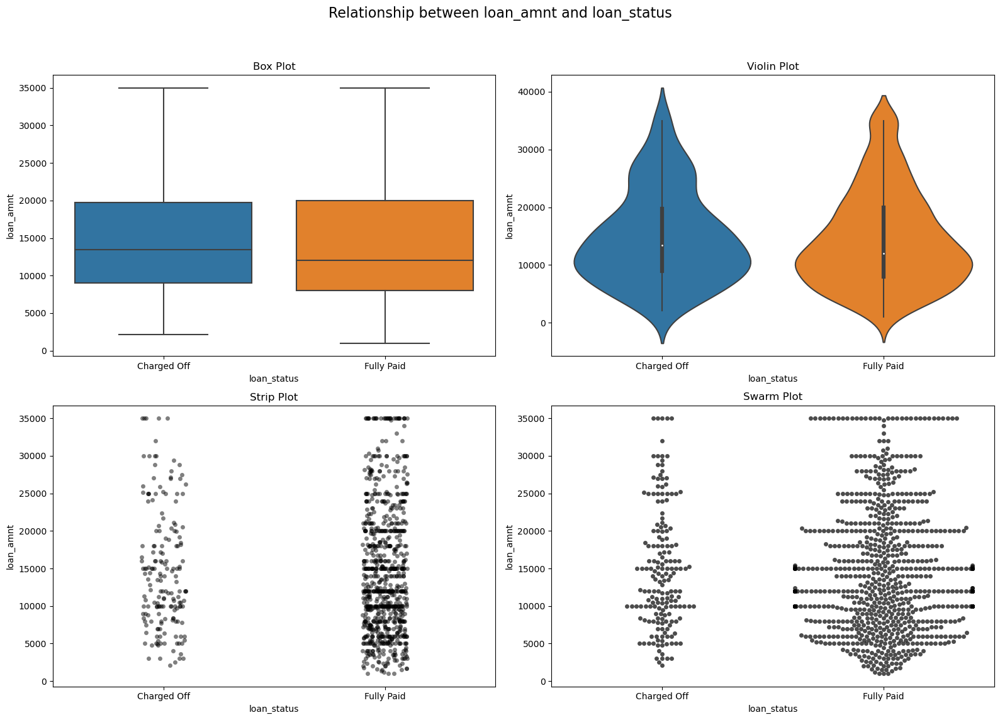

int_rate


C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 8.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


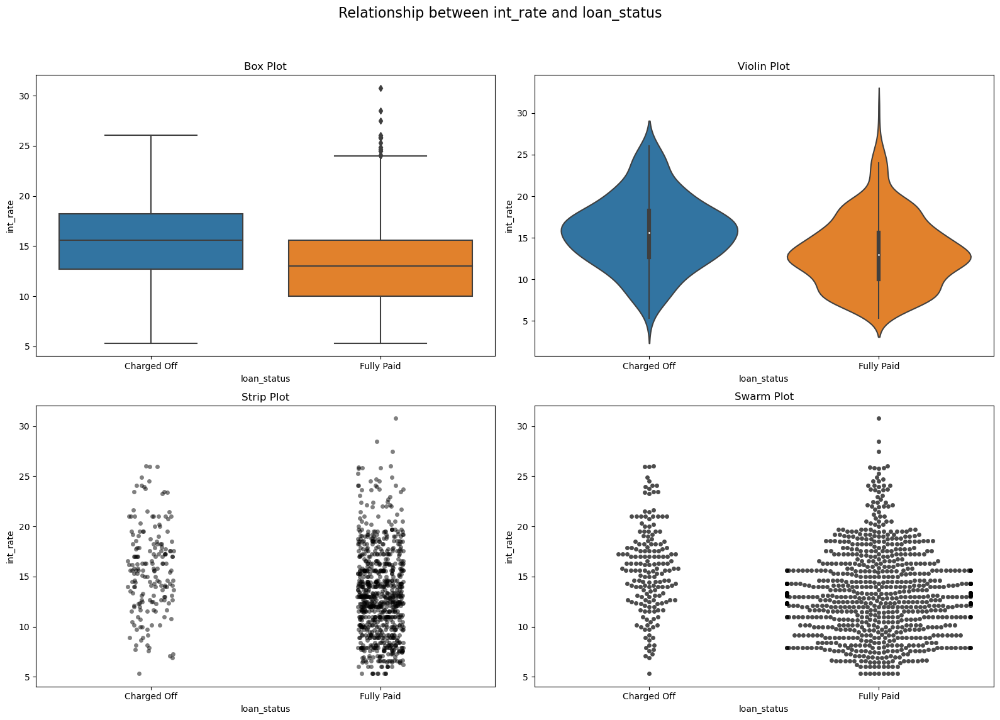

installment


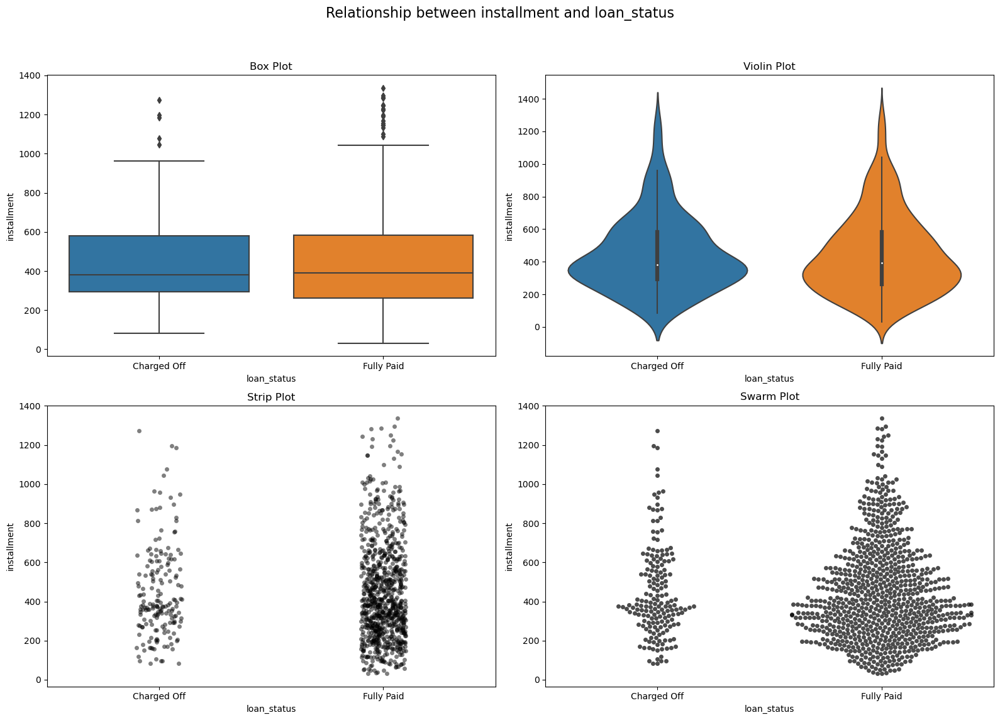

annual_inc


C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 23.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 37.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


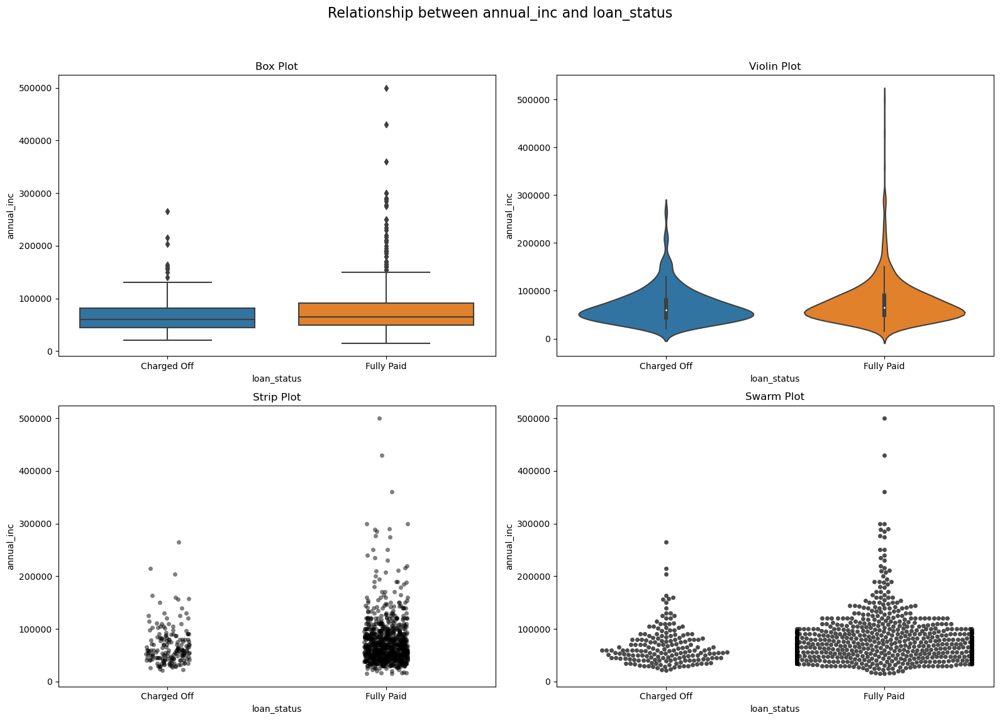

dti


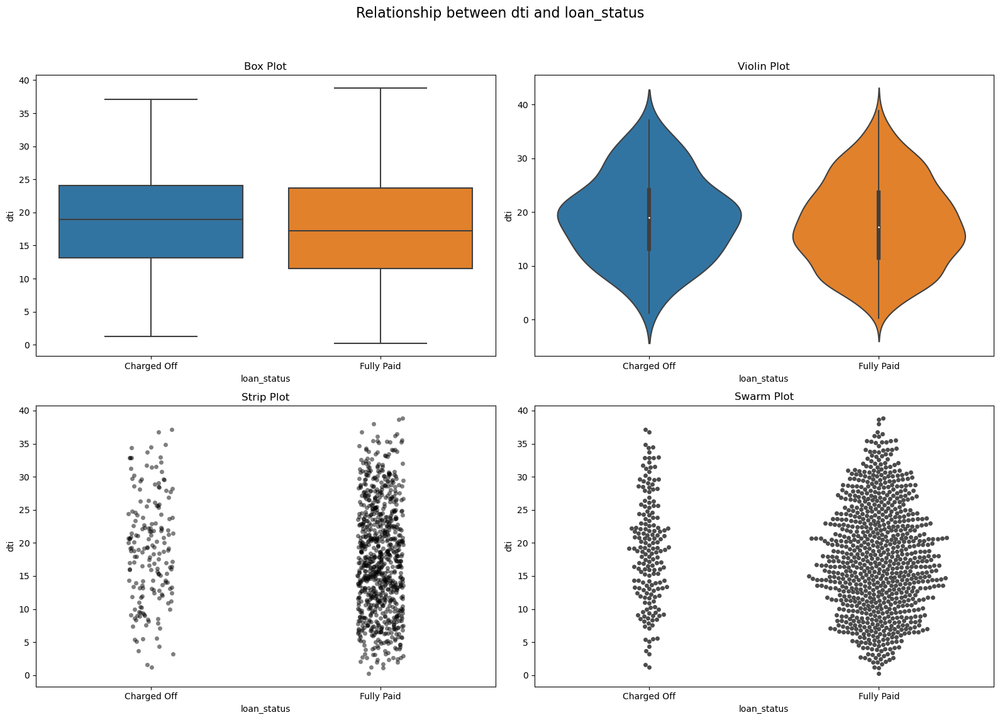

open_acc


C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 11.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 24.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


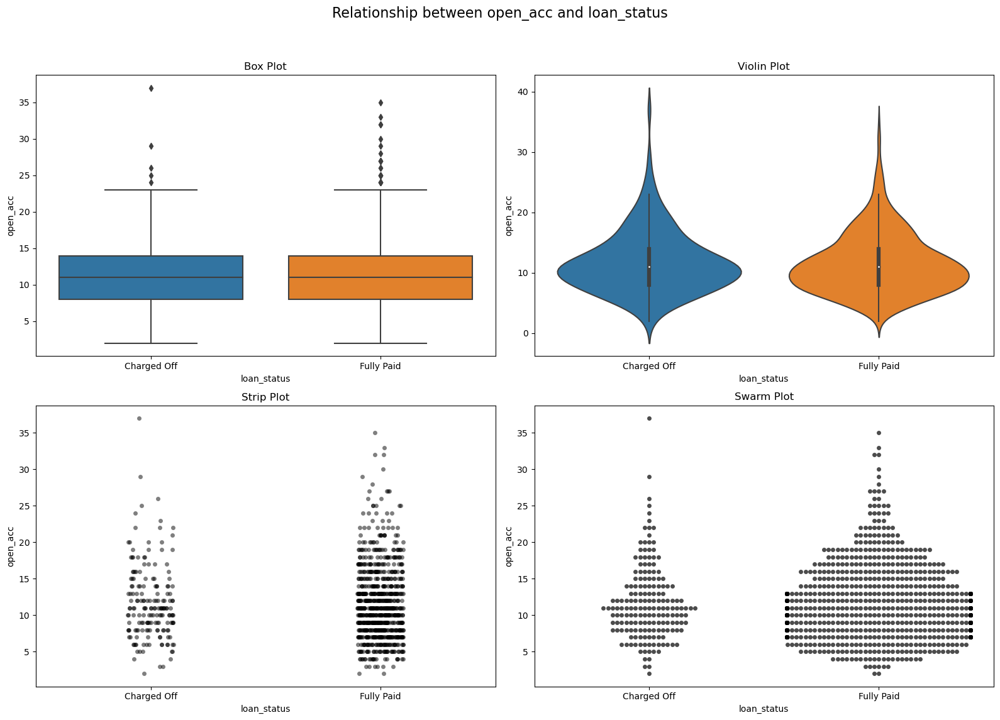

pub_rec


C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 51.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 84.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 60.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 88.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


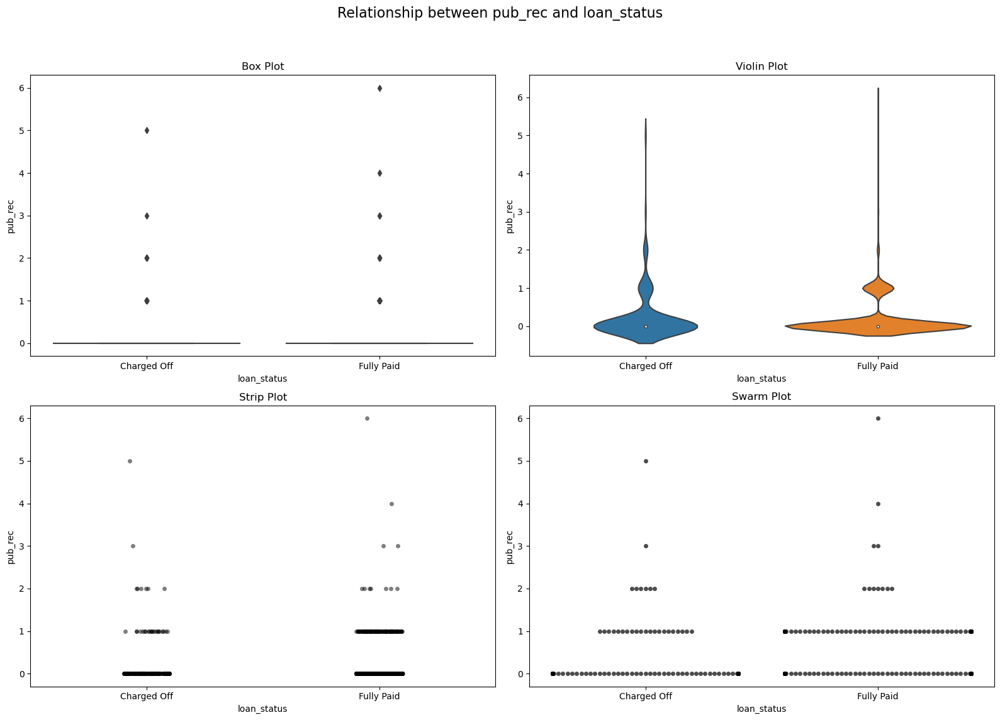

revol_bal


C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 54.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 11.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 62.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


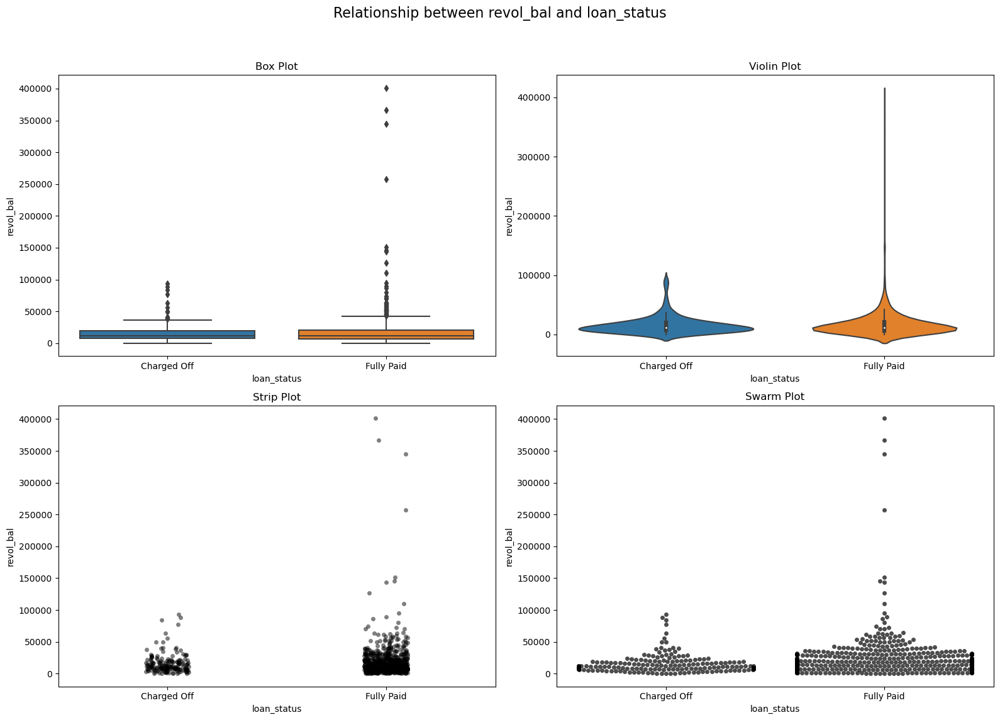

revol_util


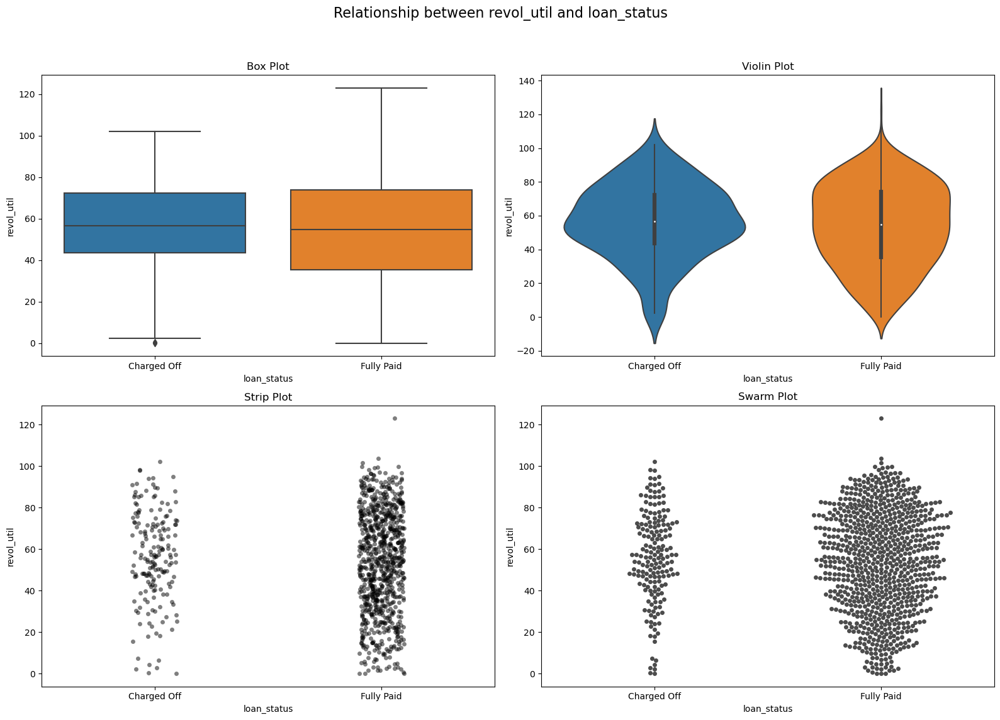

total_acc


C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 6.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


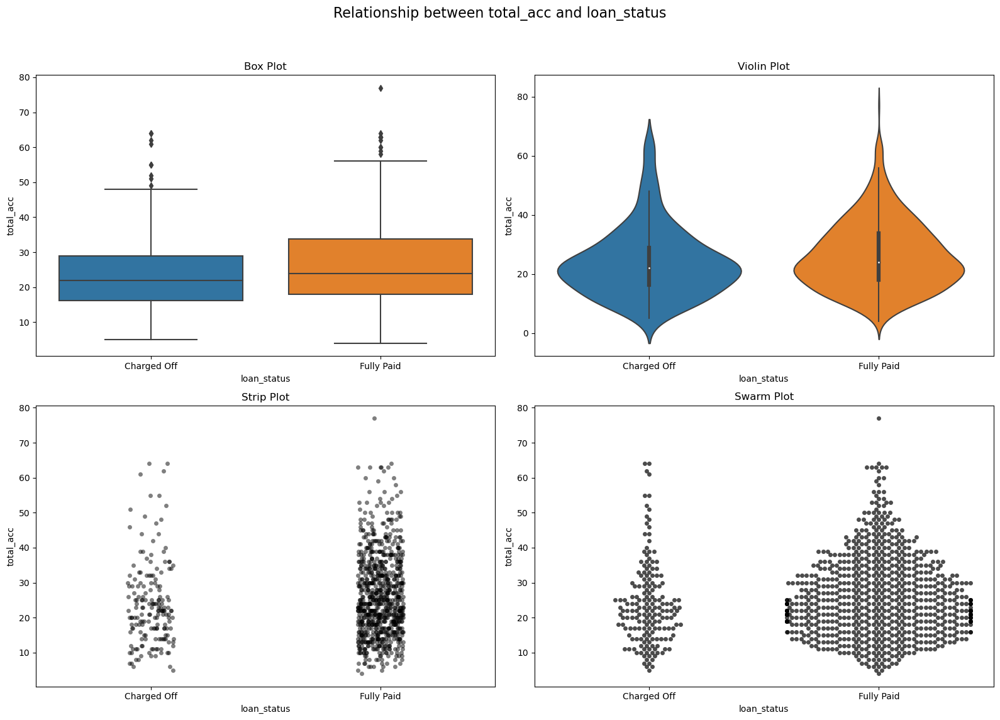

mort_acc


C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 14.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 52.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 23.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 62.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


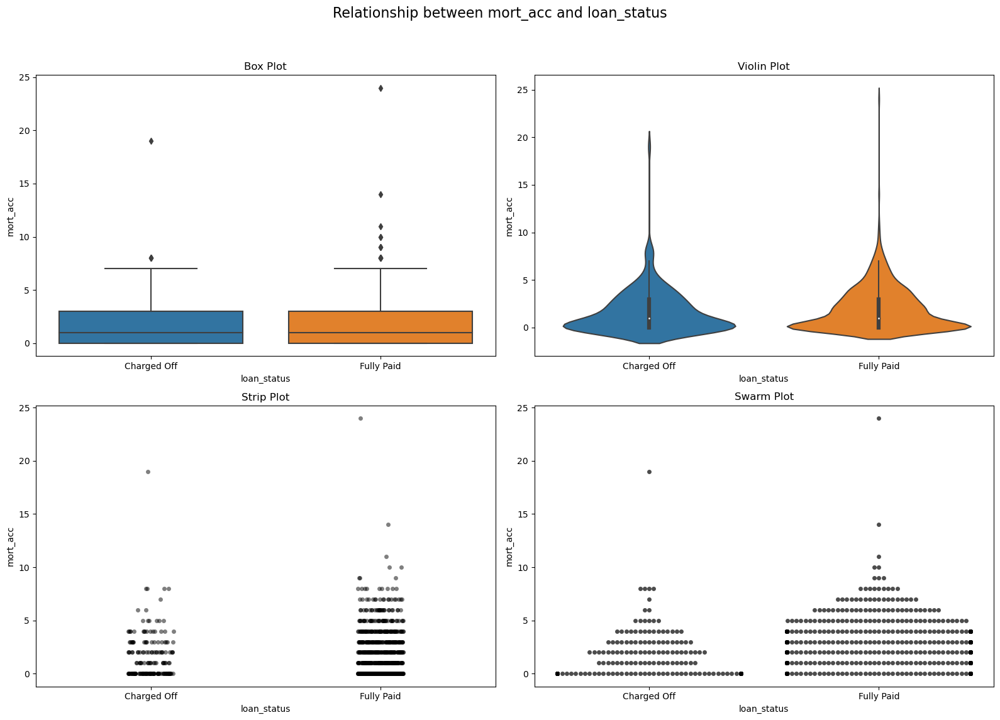

pub_rec_bankruptcies


C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 56.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 86.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 66.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\akash\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 90.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


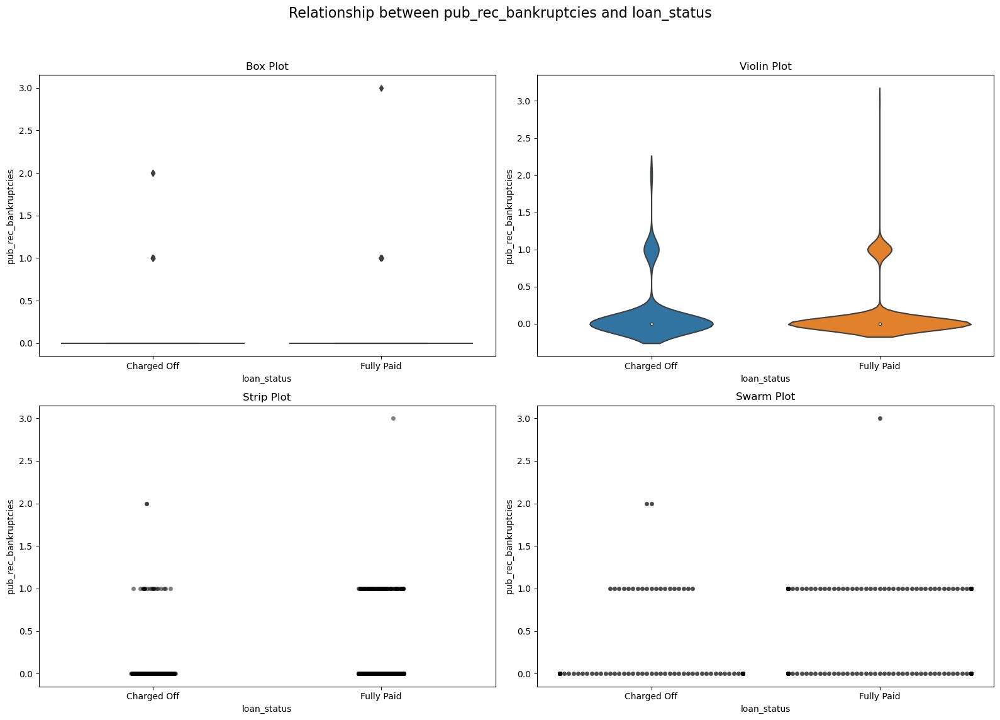

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def identify_and_plot_continuous_columns(plot, target_col, unique_value_threshold=40, sample_size=None):
    # Identify columns with more than the unique value threshold
    
    continuous_cols = [col for col in plot.columns if plot[col].dtypes==float]
    
    
    # Optional: Sample data if the dataset is large
    if sample_size and len(plot) > sample_size:
        plot = plot.sample(sample_size, random_state=1)
    
    for col in continuous_cols:
        # Create subplots
        print(col)
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        fig.suptitle(f'Relationship between {col} and {target_col}', fontsize=16)
        
        # Box Plot
        sns.boxplot(data=plot, x=target_col, y=col, ax=axes[0, 0])
        axes[0, 0].set_title('Box Plot')
        
        # Violin Plot
        sns.violinplot(data=plot, x=target_col, y=col, ax=axes[0, 1])
        axes[0, 1].set_title('Violin Plot')
        
        # Strip Plot
        sns.stripplot(data=plot, x=target_col, y=col, ax=axes[1, 0], color='black', alpha=0.5, jitter=True)
        axes[1, 0].set_title('Strip Plot')
        
        # Swarm Plot
        sns.swarmplot(data=plot, x=target_col, y=col, ax=axes[1, 1], color='black', alpha=0.7)
        axes[1, 1].set_title('Swarm Plot')
        
        # Adjust layout
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()


# Make sure the target column is categorical
df['loan_status'] = df['loan_status'].astype('category')
plot = df.copy()

identify_and_plot_continuous_columns(plot, 'loan_status', sample_size=1000)


# Checking Cat vs Target column 

In [17]:
# Null-> two variables are independent
# Alternate-> they are dependent

def perform_chi_square_tests(df, target_col):
    # Ensure the target column is categorical
    if not pd.api.types.is_categorical_dtype(df[target_col]):
        raise ValueError(f"The target column '{target_col}' must be categorical.")

    # Identify categorical columns
    categorical_cols = [col for col in df.columns if pd.api.types.is_categorical_dtype(df[col]) or df[col].dtype == 'object']
    
    # Initialize results
    results = []

    for col in categorical_cols:
        if col == target_col:
            continue
        
        # Create contingency table
        contingency_table = pd.crosstab(df[col], df[target_col])
        
        # Perform Chi-Square Test
        chi2, p, dof, ex = chi2_contingency(contingency_table)
        
        # Determine verdict
        if p < 0.05:
            verdict = "Significant association"
        else:
            verdict = "No significant association"
        
        # Append results
        results.append({
            'Categorical Column': col,
            'Chi-Square Statistic': chi2,
            'P-Value': p,
            'Degrees of Freedom': dof,
            'Verdict': verdict
        })
    
    # Convert results to DataFrame
    results_df = pd.DataFrame(results)
    
    return results_df


# Ensure the target column is categorical
df['loan_status'] = df['loan_status'].astype('category')

# Perform Chi-Square Tests
chi_square_results = perform_chi_square_tests(df, 'loan_status')



     Categorical Column  Chi-Square Statistic        P-Value  \
0                  term          11885.537227   0.000000e+00   
1                 grade          26338.058128   0.000000e+00   
2             sub_grade          27560.204017   0.000000e+00   
3             emp_title         175801.133490   2.540377e-06   
4            emp_length            122.113174   1.884050e-21   
5        home_ownership           1860.635095   0.000000e+00   
6   verification_status           2903.069067   0.000000e+00   
7               issue_d           6433.094515   0.000000e+00   
8               purpose           1397.067960  6.573355e-291   
9                 title          44199.410110   1.000000e+00   
10     earliest_cr_line           1847.924559  5.739812e-108   
11  initial_list_status             35.611255   2.408916e-09   
12     application_type             59.601903   1.141856e-13   
13              address         394493.972956   1.851157e-01   

    Degrees of Freedom                 

In [18]:
chi_square_results

,Categorical Column,Chi-Square Statistic,P-Value,Degrees of Freedom,Verdict
0,term,11885.537227,0.000000e+00,1,Significant association
1,grade,26338.058128,0.000000e+00,6,Significant association
2,sub_grade,27560.204017,0.000000e+00,34,Significant association
3,emp_title,175801.133490,2.540377e-06,173104,Significant association
4,emp_length,122.113174,1.884050e-21,10,Significant association
5,home_ownership,1860.635095,0.000000e+00,5,Significant association
6,verification_status,2903.069067,0.000000e+00,2,Significant association
7,issue_d,6433.094515,0.000000e+00,114,Significant association
8,purpose,1397.067960,6.573355e-291,13,Significant association
9,title,44199.410110,1.000000e+00,48815,No significant association


# Correlation plot

In [24]:
continuous_cols = [col for col in df.columns if pd.api.types.is_numeric_dtype(df[col])]

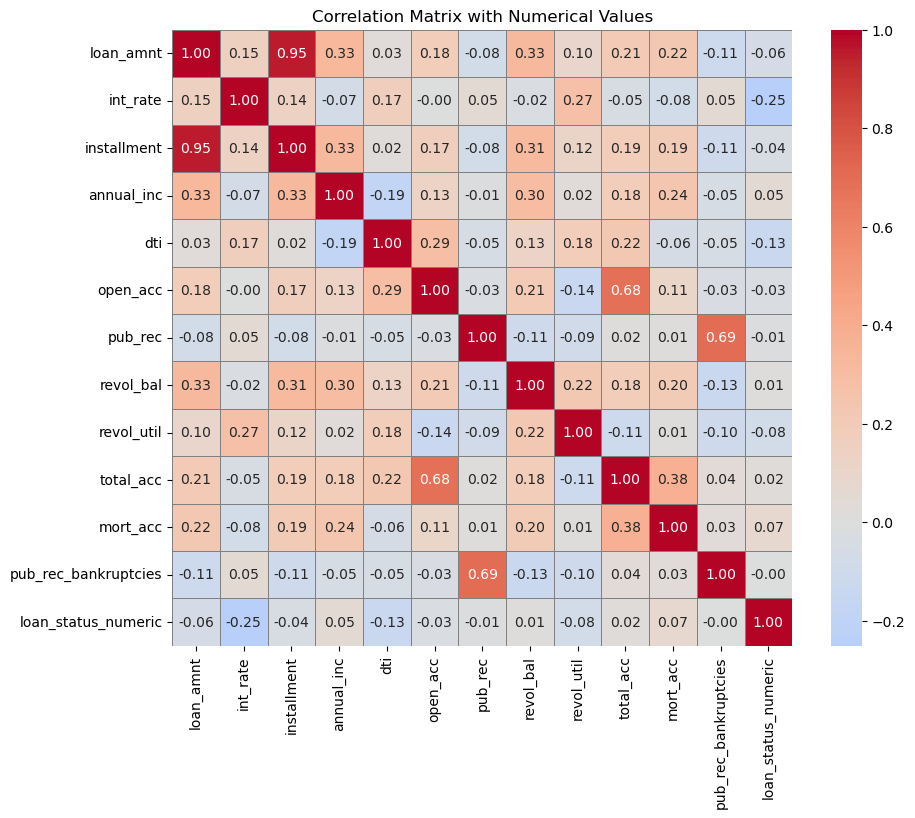

In [28]:
corr_matrix = df[continuous_cols].corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', center=0, linewidths=0.5, linecolor='gray')

# Add titles and labels
plt.title('Correlation Matrix with Numerical Values')
plt.show()

In [92]:
df.shape

(396030, 27)

In [91]:
df.shape[0]==df.drop_duplicates().shape[0]

True

In [347]:
df.columns

Index(['loan_amnt', 'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       'emp_title', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'purpose', 'title',
       'dti', 'earliest_cr_line', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'initial_list_status', 'application_type',
       'mort_acc', 'pub_rec_bankruptcies', 'address'],
      dtype='object')

# Feature Enginerring

In [9]:
df['Pub_rec'] = (df['pub_rec'] > 1.0).astype(int)
df['Mort_acc'] = (df['mort_acc'] > 1.0).astype(int)
df['Pub_rec_bankruptcies'] = (df['pub_rec_bankruptcies'] > 1.0).astype(int)

# Converting categorical columns to Numerical

### Removing months from term will simply make it numrical

In [10]:
df["term"] = df["term"].apply(lambda x:x.split()[0])
df["term"] = df["term"].astype(int)

### dropping sub_grade column as same info is there in grade 

In [11]:
df.drop(["sub_grade"],inplace=True,axis=1)
gradeMapping = {"a":1,"b":2,"c":3,"d":4,"e":5,"f":6,"g":7}
df["grade"] = df["grade"].map(gradeMapping)

### Replacing Nan values in emp_title to other

In [12]:
df["emp_title"] = df["emp_title"].fillna("other")

### Whereever there is missing emp_title there is missing emp_length, replacing emp_length with -1

In [13]:
df["emp_length"].fillna("-1",inplace=True)

### converting to numerical

In [14]:
df["emp_length"] = df["emp_length"].apply(lambda x:int(re.findall(r'\d+',x)[0]))

### feature Engineered column diff_issue_credit_line

In [15]:
def months_difference(start_date, end_date):
    delta = relativedelta(end_date, start_date)
    return delta.years * 12 + delta.months



In [16]:
df['issue_d'] = pd.to_datetime(df['issue_d'], format='%b-%Y')
df['earliest_cr_line'] = pd.to_datetime(df['earliest_cr_line'], format='%b-%Y')

# Apply the function to the DataFrame
df['diff_issue_credit_line'] = df.apply(lambda row: months_difference(row['earliest_cr_line'], row['issue_d']), axis=1)


### dropping issue_d and earliest_cr_line

In [17]:
df.drop(["issue_d","earliest_cr_line"],inplace=True,axis=1)

There's lot of things in emp_title, first there are lot of categories around 149260,
Around 146113 has count of <10. We can apply filter of whereever the employee_title count <10 just drop them or assign others
but problem is we might miss out category here if new application comes up our model has no idea about that employee title. So will do label encoding and feature engineering for default percent its (charged off/charged off+full paid)


In [18]:
category_counts = df['emp_title'].value_counts()
category_counts[category_counts<10].shape[0]/df['emp_title'].nunique()

0.9791412312467667

### 97% of the data has employee title which has count <10

In [19]:
def CatVsLabelFE(df,cat,label = "loan_status"):
    print([cat, label])
    status_counts = df.groupby([cat, label]).size().unstack(fill_value=0)
    status_counts = status_counts.reset_index()

    # Rename columns
    status_counts.columns = [cat, 'Charged Off', 'Fully Paid']

    status_counts['defaultPercentby'+ cat] = (status_counts["Charged Off"]/(status_counts["Charged Off"]+status_counts["Fully Paid"]))*100

    return status_counts

def OneHotEncode(df,cat):
    #print(df.shape)
    # Initialize OneHotEncoder
    encoder = OneHotEncoder(sparse_output=False,drop='first')

    # Fit and transform the 'emp_title' column
    encoded_array = encoder.fit_transform(df[[cat]])
    #print(encoder.get_feature_names_out([cat]))
    #print(encoded_array.shape)

    # Create a DataFrame from the encoded array
    encoded_df = pd.DataFrame(encoded_array, columns=encoder.get_feature_names_out([cat]))
    
    #print(encoded_df.index)
    #return encoded_df

    # Concatenate the original DataFrame (if needed) and the encoded columns
    return pd.concat([df, encoded_df], axis=1).drop(cat, axis=1)

In [20]:
status_counts = CatVsLabelFE(df,"emp_title")

['emp_title', 'loan_status']


In [21]:
label_encoder = preprocessing.LabelEncoder() 
  
# Encode labels in column 'species'. 
df["emp_title_encoded"]= label_encoder.fit_transform(df['emp_title']) 
classes = label_encoder.classes_
mappingEmployee = dict(zip(classes, range(len(classes))))
df.drop("emp_title",inplace=True,axis=1)

In [22]:
df.shape

(380244, 28)

# home_ownerShip

In [23]:
df["home_ownership"].unique()

array(['rent', 'mortgage', 'own', 'other', 'none', 'any'], dtype=object)

In [24]:
df.shape

(380244, 28)

In [25]:
status_counts = CatVsLabelFE(df,"home_ownership")
df = OneHotEncode(df,"home_ownership")

['home_ownership', 'loan_status']


# Source Verified

In [26]:
df["verification_status"].unique()

array(['not verified', 'source verified', 'verified'], dtype=object)

In [27]:
status_counts = CatVsLabelFE(df,"verification_status")
df = OneHotEncode(df,"verification_status")

['verification_status', 'loan_status']


In [28]:
df.shape

(380244, 33)

# Purpose

In [29]:
df["purpose"].unique()

array(['vacation', 'debt_consolidation', 'credit_card',
       'home_improvement', 'small_business', 'major_purchase', 'other',
       'medical', 'wedding', 'car', 'moving', 'house', 'educational',
       'renewable_energy'], dtype=object)

In [30]:
status_counts = CatVsLabelFE(df,"purpose")
df = OneHotEncode(df,"purpose")

['purpose', 'loan_status']


In [31]:
df.shape

(380244, 45)

## small business has highest default percentage

In [32]:
df.drop("title",inplace=True,axis=1)

## application_type

In [33]:
df["application_type"].unique()

array(['individual', 'joint', 'direct_pay'], dtype=object)

In [34]:
status_counts = CatVsLabelFE(df,"application_type")
df = OneHotEncode(df,"application_type")

['application_type', 'loan_status']


In [35]:
df.shape

(380244, 45)

## Direct pay has highest default count

In [36]:
df.drop("address",inplace=True,axis=1)

### Initial_list_status

In [37]:
status_counts = CatVsLabelFE(df,"initial_list_status")
df = OneHotEncode(df,"initial_list_status")

['initial_list_status', 'loan_status']


In [38]:
df.isna().sum()

loan_amnt                                  0
term                                       0
int_rate                                   0
installment                                0
grade                                      0
emp_length                                 0
annual_inc                                 0
loan_status                                0
dti                                        0
open_acc                                   0
pub_rec                                    0
revol_bal                                  0
revol_util                               252
total_acc                                  0
mort_acc                               36902
pub_rec_bankruptcies                     519
Pub_rec                                    0
Mort_acc                                   0
Pub_rec_bankruptcies                       0
diff_issue_credit_line                     0
emp_title_encoded                          0
home_ownership_mortgage                    0
home_owner

# Using Imputer

In [39]:
label_encoder = LabelEncoder()

# Fit and transform the target column
df['loan_status'] = label_encoder.fit_transform(df['loan_status'])

In [40]:
label = df['loan_status']
df.drop("loan_status",inplace=True,axis=1)

In [41]:
# Identify columns with missing values
missing_cols = df.columns[df.isna().any()].tolist()
print("Columns with missing values:", missing_cols)

imputer = SimpleImputer(strategy='median')

# Impute only columns with missing values
df[missing_cols] = imputer.fit_transform(df[missing_cols])

Columns with missing values: ['revol_util', 'mort_acc', 'pub_rec_bankruptcies']


# MODEL Building

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_fscore_support, confusion_matrix, accuracy_score
from sklearn.metrics import ConfusionMatrixDisplay

def plot_model_performance(y_train_true, y_train_pred, y_test_true, y_test_pred, title="Model Performance"):
    
    def calculate_metrics(y_true, y_pred):
        precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='weighted')
        accuracy = accuracy_score(y_true, y_pred)
        return precision, recall, f1, accuracy

    # Calculate metrics for training set
    train_precision, train_recall, train_f1, train_accuracy = calculate_metrics(y_train_true, y_train_pred)
    print("\nTraining Set Metrics:")
    print(f"Precision: {train_precision:.2f}")
    print(f"Recall: {train_recall:.2f}")
    print(f"F1 Score: {train_f1:.2f}")
    print(f"Accuracy: {train_accuracy:.2f}")

    # Calculate metrics for testing set
    test_precision, test_recall, test_f1, test_accuracy = calculate_metrics(y_test_true, y_test_pred)
    print("\nTesting Set Metrics:")
    print(f"Precision: {test_precision:.2f}")
    print(f"Recall: {test_recall:.2f}")
    print(f"F1 Score: {test_f1:.2f}")
    print(f"Accuracy: {test_accuracy:.2f}")

    # Confusion Matrix
    cm_train = confusion_matrix(y_train_true, y_train_pred)
    cm_test = confusion_matrix(y_test_true, y_test_pred)

    # Plotting Precision, Recall, F1 Score, and Accuracy
    fig, ax = plt.subplots(2, 2, figsize=(16, 12))
    plt.suptitle(title, fontsize=16)

    # Training Metrics
    metrics_train = {'Precision': train_precision, 'Recall': train_recall, 'F1 Score': train_f1, 'Accuracy': train_accuracy}
    bars_train = ax[0, 0].bar(metrics_train.keys(), metrics_train.values(), color='blue', alpha=0.7)
    ax[0, 0].set_ylim([0, 1])
    ax[0, 0].set_title('Training Metrics')
    ax[0, 0].set_ylabel('Score')

    # Add numbers on bars for training metrics
    for bar in bars_train:
        yval = bar.get_height()
        ax[0, 0].text(bar.get_x() + bar.get_width()/2.0, yval + 0.02, round(yval, 2), ha='center', va='bottom')

    # Testing Metrics
    metrics_test = {'Precision': test_precision, 'Recall': test_recall, 'F1 Score': test_f1, 'Accuracy': test_accuracy}
    bars_test = ax[0, 1].bar(metrics_test.keys(), metrics_test.values(), color='orange', alpha=0.7)
    ax[0, 1].set_ylim([0, 1])
    ax[0, 1].set_title('Testing Metrics')
    ax[0, 1].set_ylabel('Score')

    # Add numbers on bars for testing metrics
    for bar in bars_test:
        yval = bar.get_height()
        ax[0, 1].text(bar.get_x() + bar.get_width()/2.0, yval + 0.02, round(yval, 2), ha='center', va='bottom')

    # Confusion Matrix Plot
    disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=np.unique(y_train_true))
    disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=np.unique(y_test_true))
    
    disp_train.plot(ax=ax[1, 0], cmap='Blues', values_format='d')
    ax[1, 0].set_title('Confusion Matrix (Training Set)')
    
    disp_test.plot(ax=ax[1, 1], cmap='Blues', values_format='d')
    ax[1, 1].set_title('Confusion Matrix (Testing Set)')
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust plot to fit the suptitle
    plt.show()

In [43]:
def modelBuild(model,X_train,y_train,X_test,y_test):
    model.fit(X_train,y_train)

    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    probabilityTrain = model.predict_proba(X_train)
    probabilitesTrain = probabilityTrain[:,1]

    fprTrain, tprTrain, thrTrain = roc_curve(y_train,probabilitesTrain)

    print("Train Data")
    plt.plot(fprTrain,tprTrain)
    #random model
    plt.plot(fprTrain,fprTrain,'--',color='red' )
    plt.title('ROC curve')
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.show()

    probabilityTest = model.predict_proba(X_test)
    probabilitesTest = probabilityTest[:,1]

    fprTest, tprTest, thrTest = roc_curve(y_test,probabilitesTest)

    print("Test Data")
    plt.plot(fprTest,tprTest)

    #random model
    plt.plot(fprTest,fprTest,'--',color='red' )
    plt.title('ROC curve')
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.show()

    def calculateMetric(y_true,y_pred,probabilites):
        print("ROC AUC score",roc_auc_score(y_true,probabilites))
        precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='binary')
        accuracy = accuracy_score(y_true, y_pred)
        print(f" Precision: {precision:.4f}")
        print(f" Recall: {recall:.4f}")
        print(f" F1 Score: {f1:.4f}")
        print(f"Accuracy: {accuracy:.4f}")
        
        precisionP, recallP, thrP = precision_recall_curve(y_true, probabilites)
        plt.plot(recallP, precisionP)

        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.title('PR curve')
        plt.show()
        
        print("AUC score",auc(recallP, precisionP))
        
        return precision, recall, f1,accuracy,roc_auc_score(y_true,probabilites)

    print("Train Metrics...")
    precision_train, recall_train, f1_train, accuracy_train,roc_auc_train= calculateMetric(y_train,y_pred_train,probabilitesTrain)
    print("="*100)
    print("Test Metrics...")
    precision_test, recall_test, f1_test, accuracy_test,roc_auc_test = calculateMetric(y_test,y_pred_test,probabilitesTest)
    
    # Plot model metrics
    fig, axs = plt.subplots(1, 2, figsize=(16, 6), sharex=True)
    fig.suptitle('Model Performance Metrics', fontsize=16)

    plt.subplot(1,2,1)
    # Training Metrics
    plt.bar(['Precision', 'Recall', 'F1 Score', 'Accuracy', 'ROC AUC'], [precision_train, recall_train, f1_train, accuracy_train, roc_auc_train])
    plt.title('Training Metrics')
    plt.ylabel('Score')
    plt.grid(True)

    plt.subplot(1,2,2)
    # # Testing Metrics
    plt.bar(['Precision', 'Recall', 'F1 Score', 'Accuracy', 'ROC AUC'], [precision_test, recall_test, f1_test, accuracy_test, roc_auc_test])
    plt.title('Testing Metrics')
    plt.ylabel('Score')
    plt.grid(True)

    plt.show()
    
    conf_matrix = confusion_matrix(y_test, y_pred_test)

    ConfusionMatrixDisplay(conf_matrix).plot()
    
    plt.show()
    
    return  precision_test, recall_test, f1_test, accuracy_test,roc_auc_test

Train Data


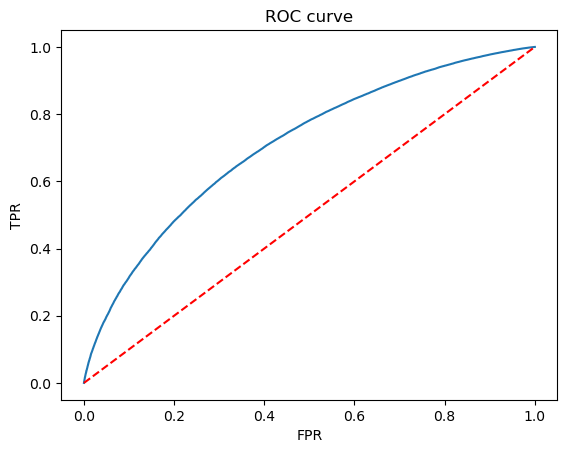

Test Data


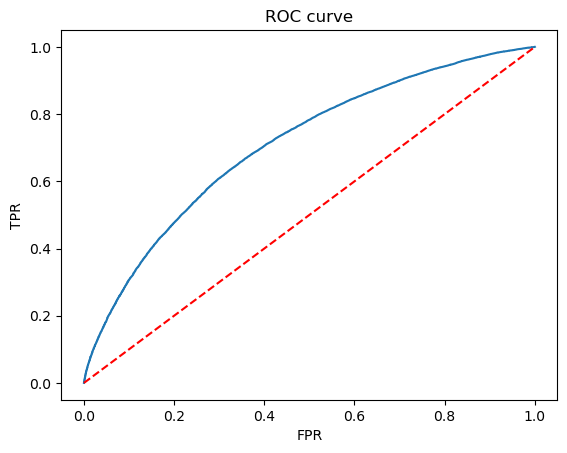

Train Metrics...
ROC AUC score 0.7092595404335595
 Precision: 0.8138
 Recall: 0.9823
 F1 Score: 0.8901
Accuracy: 0.8052


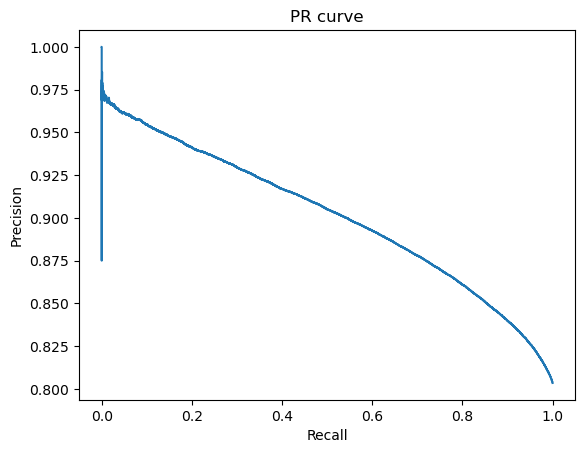

AUC score 0.9010352531229185
Test Metrics...
ROC AUC score 0.7089333268451653
 Precision: 0.8149
 Recall: 0.9824
 F1 Score: 0.8908
Accuracy: 0.8064


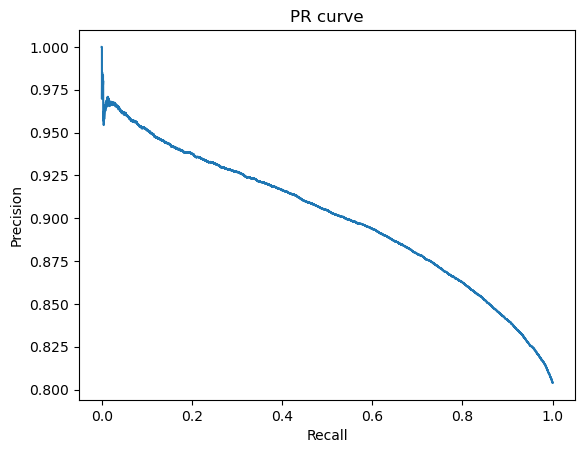

AUC score 0.9002437203163983


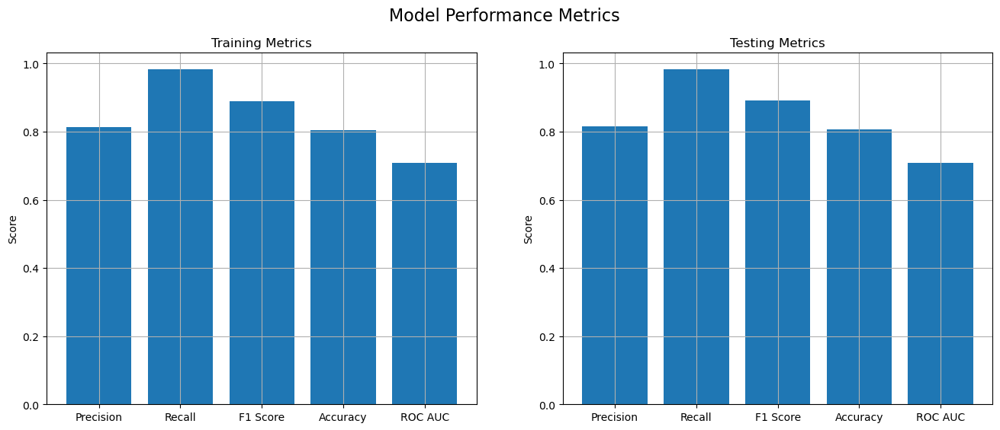

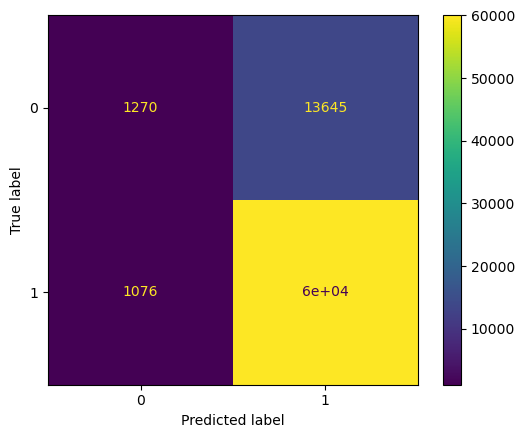

(0.8148650665508866,
 0.9823993195275951,
 0.8908237353248737,
 0.8064274349432603,
 0.7089333268451653)

In [381]:
X_train, X_test, y_train, y_test = train_test_split(df, label, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

X_train = pd.DataFrame(X_train,columns = df.columns)
X_test = pd.DataFrame(X_test,columns = df.columns)

model = LogisticRegression()
modelBuild(model,X_train,y_train,X_test,y_test)

Train Data


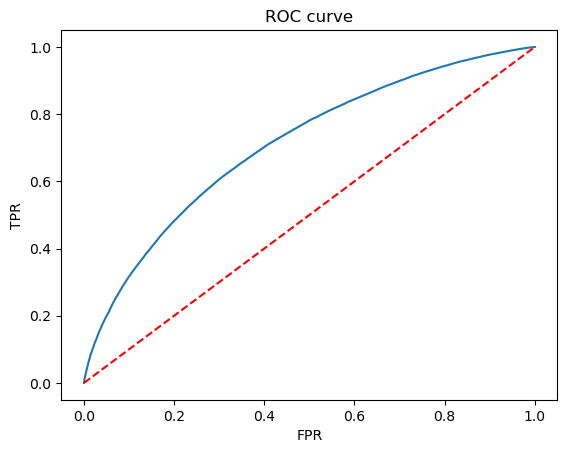

Test Data


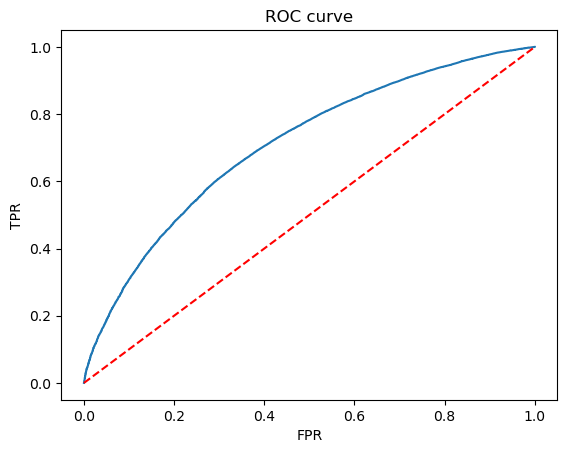

Train Metrics...
ROC AUC score 0.7093826325544145
 Precision: 0.8829
 Recall: 0.6667
 F1 Score: 0.7597
Accuracy: 0.6611


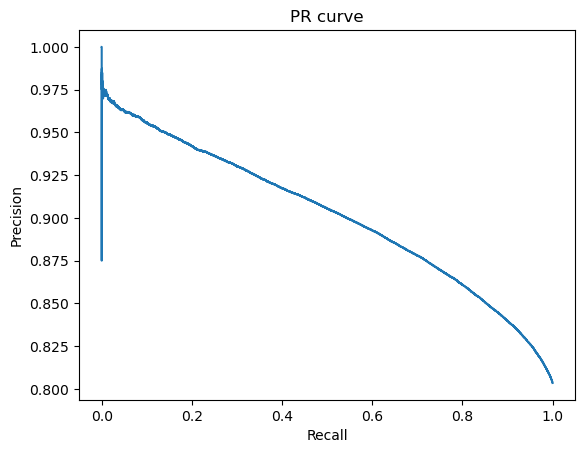

AUC score 0.9013841634352667
Test Metrics...
ROC AUC score 0.7089578077256381
 Precision: 0.8841
 Recall: 0.6680
 F1 Score: 0.7610
Accuracy: 0.6628


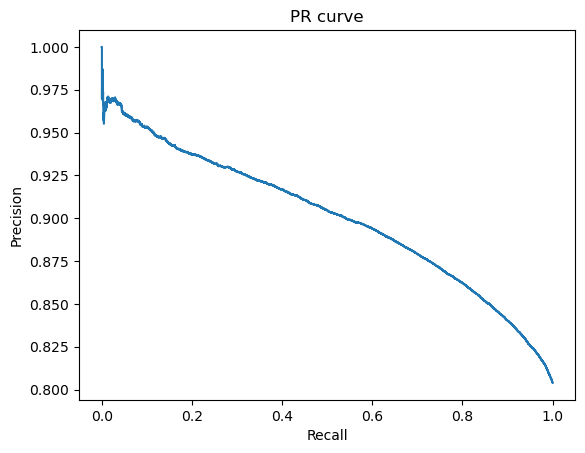

AUC score 0.9005119112957656


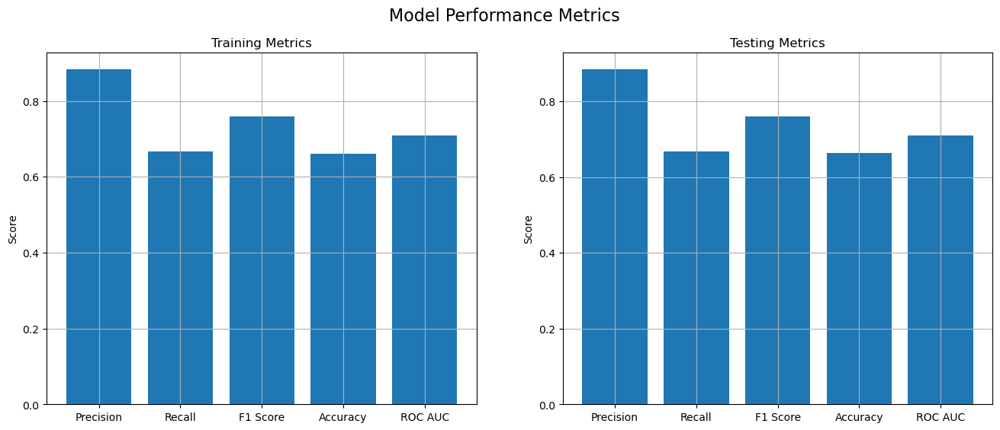

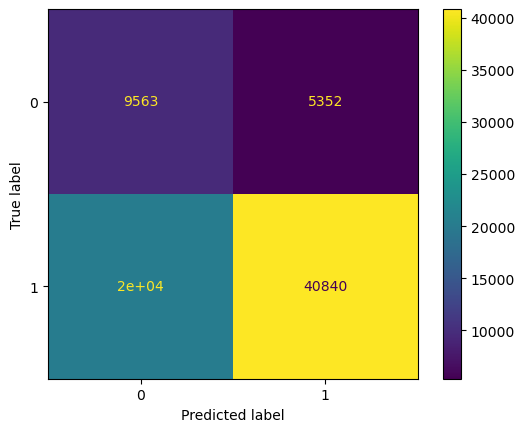

(0.8841357810876342,
 0.668040697484215,
 0.7610457857369137,
 0.6627700561480099,
 0.7089578077256381)

In [382]:
model = LogisticRegression(class_weight = "balanced")
modelBuild(model,X_train,y_train,X_test,y_test)

# USING VIF

In [282]:
def calculate_vif(df):    
    vif_data = pd.DataFrame()
    vif_data["Feature"] = df.columns
    vif_data["VIF"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    
    return vif_data


def remove_high_vif_features(df, threshold=5):
    vif_data = calculate_vif(df)
    print(f"Initial VIF values:\n{vif_data}")

    # Identify features with high VIF
    while vif_data['VIF'].max() > threshold:
        # Feature with the highest VIF
        feature_to_drop = vif_data.sort_values('VIF', ascending=False).iloc[0]['Feature']
        print(f"Dropping feature: {feature_to_drop} with VIF: {vif_data['VIF'].max()}")

        # Drop the feature with the highest VIF
        df = df.drop(columns=[feature_to_drop])

        # Recalculate VIF values
        vif_data = calculate_vif(df)
        print(f"Updated VIF values:\n{vif_data}")

    return df

VIFREMDf = remove_high_vif_features(X_train)

Initial VIF values:
                                Feature           VIF
0                             loan_amnt     59.384805
1                                  term      6.940022
2                              int_rate     11.916670
3                           installment     49.775592
4                                 grade     11.132290
5                            emp_length      1.079898
6                            annual_inc      1.711266
7                                   dti      1.439579
8                              open_acc      2.184849
9                               pub_rec      1.968956
10                            revol_bal      1.864270
11                           revol_util      1.551632
12                            total_acc      2.322920
13                             mort_acc      1.578234
14                 pub_rec_bankruptcies      1.999558
15               diff_issue_credit_line      1.236769
16                    emp_title_encoded      1.001594
17      

Updated VIF values:
                                Feature       VIF
0                                  term  1.434926
1                           installment  1.558094
2                                 grade  1.682465
3                            emp_length  1.078441
4                            annual_inc  1.694477
5                                   dti  1.438255
6                              open_acc  2.177952
7                               pub_rec  1.968820
8                             revol_bal  1.846317
9                            revol_util  1.497144
10                            total_acc  2.322076
11                             mort_acc  1.577714
12                 pub_rec_bankruptcies  1.998628
13               diff_issue_credit_line  1.235407
14                    emp_title_encoded  1.001586
15                  home_ownership_none  1.000289
16                 home_ownership_other  1.001153
17                   home_ownership_own  1.145430
18                  home_owner

Train Data


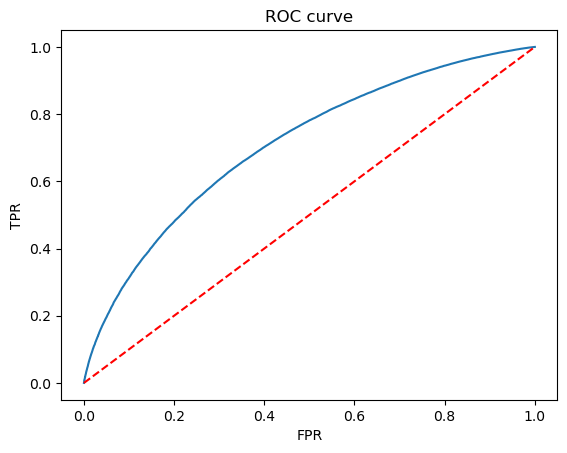

Test Data


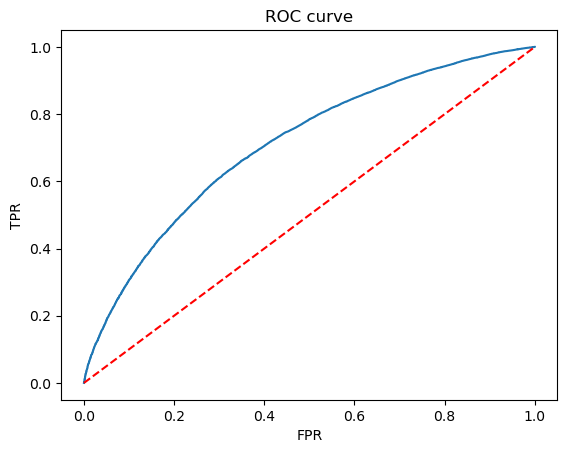

Train Metrics...
ROC AUC score 0.7091689789262652
 Precision: 0.8139
 Recall: 0.9821
 F1 Score: 0.8902
Accuracy: 0.8052


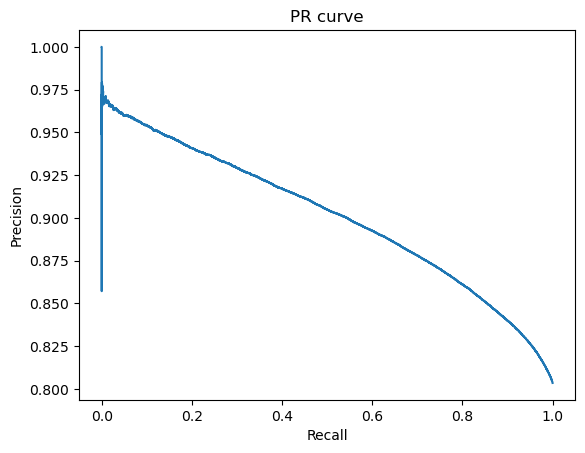

AUC score 0.9008175724924652
Test Metrics...
ROC AUC score 0.7090586879921654
 Precision: 0.8148
 Recall: 0.9822
 F1 Score: 0.8907
Accuracy: 0.8062


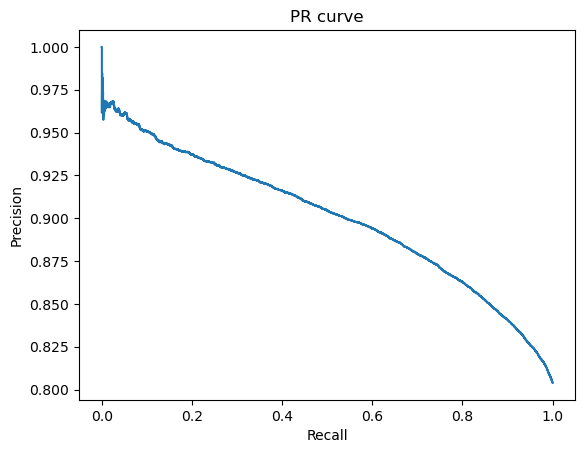

AUC score 0.9001212546830413


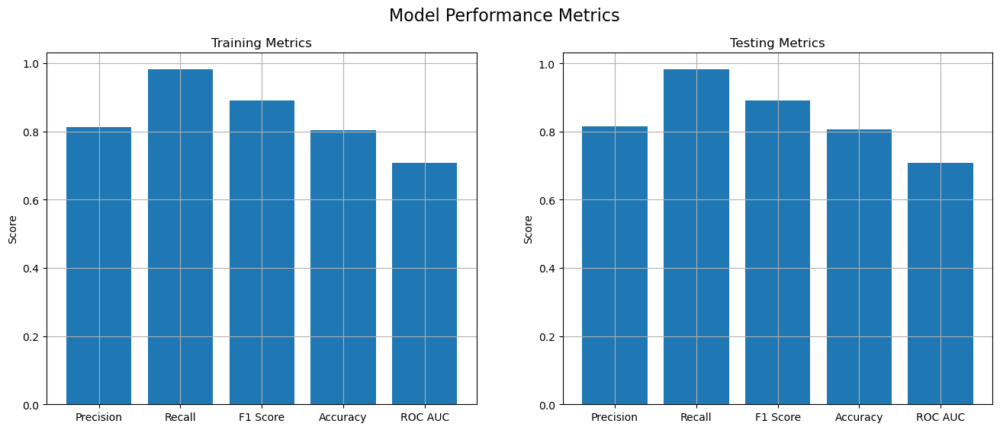

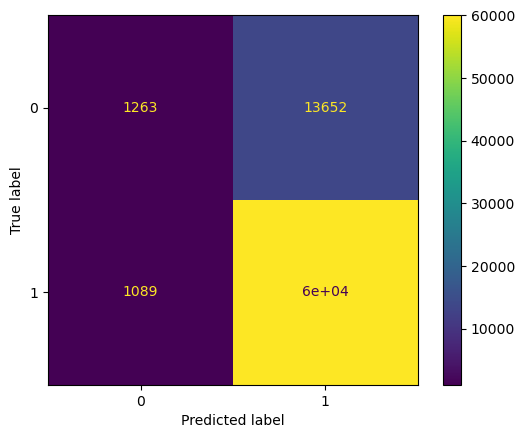

In [286]:
model = LogisticRegression()
modelBuild(model,VIFREMDf,y_train,X_test[VIFREMDf.columns],y_test)

In [44]:
from collections import defaultdict
Metric = defaultdict(dict)
def metricToDf(Metric):
    # Convert dictionary to a list of tuples
    data_list = [(key, value) for key, value in Metric.items()]

    # Convert the list of tuples to a DataFrame
    Met = pd.DataFrame.from_records(data_list, columns=['C', 'Metrics'])

    # Split the 'Metrics' dictionary into separate columns
    Met = Met.join(pd.json_normalize(Met.pop('Metrics')))
    
    return Met.sort_values(by=["precision"],ascending=False)

for c: 0.0001
Train Data


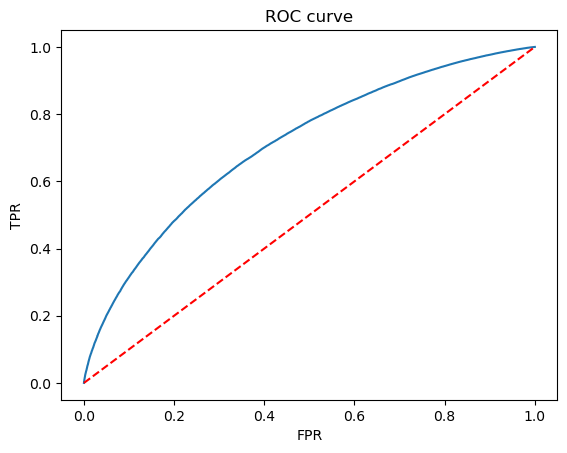

Test Data


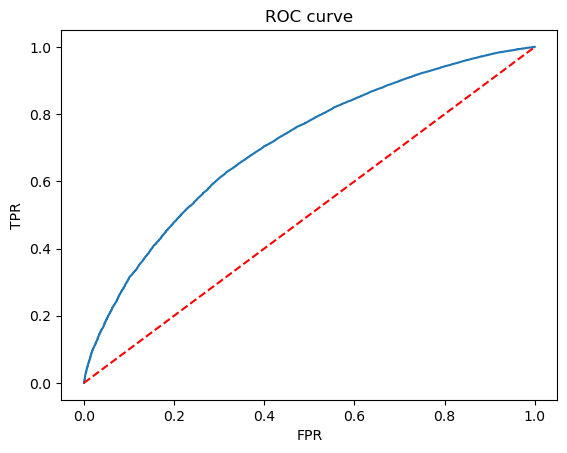

Train Metrics...
ROC AUC score 0.7086968103751985
 Precision: 0.8104
 Recall: 0.9888
 F1 Score: 0.8907
Accuracy: 0.8051


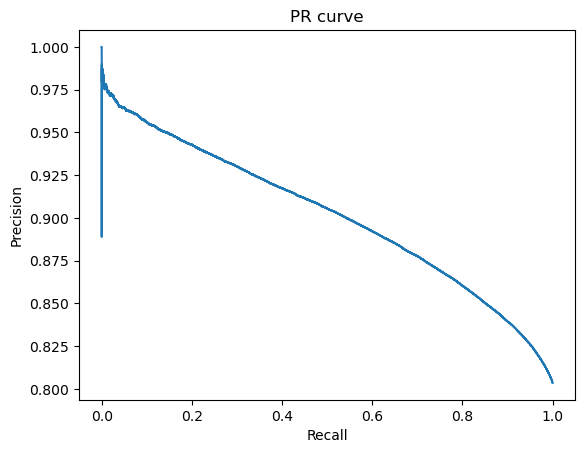

AUC score 0.9014026538723725
Test Metrics...
ROC AUC score 0.7083786136949634
 Precision: 0.8112
 Recall: 0.9888
 F1 Score: 0.8912
Accuracy: 0.8060


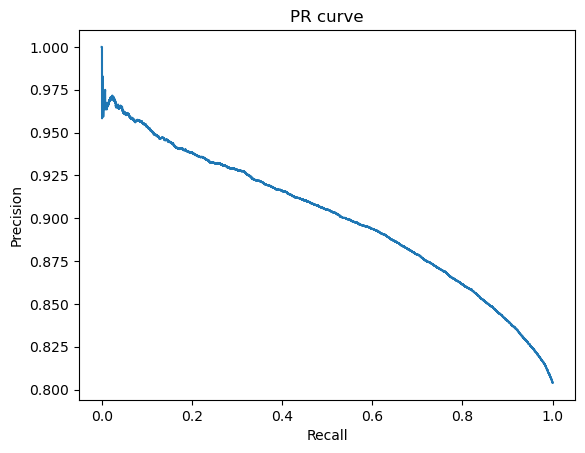

AUC score 0.900430348279633


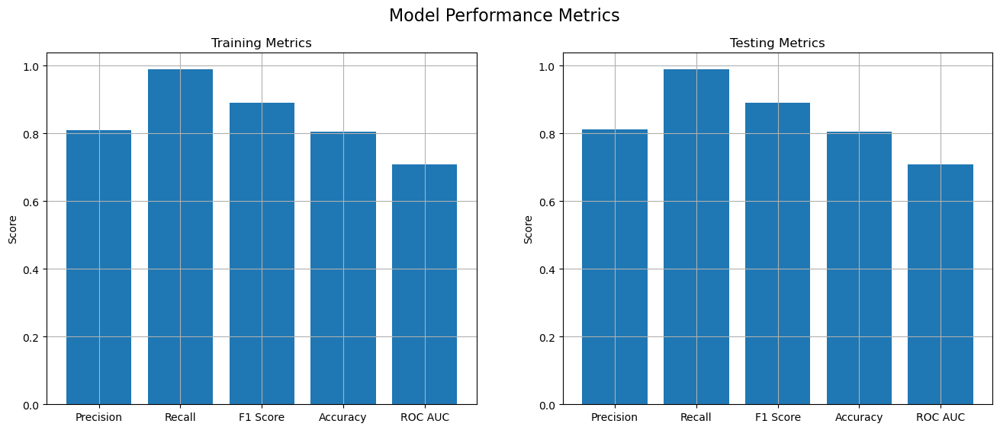

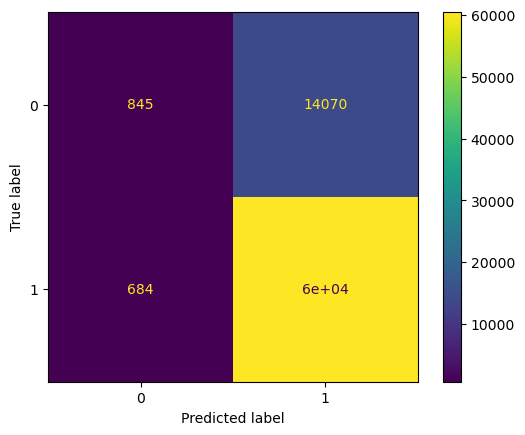

for c: 0.001
Train Data


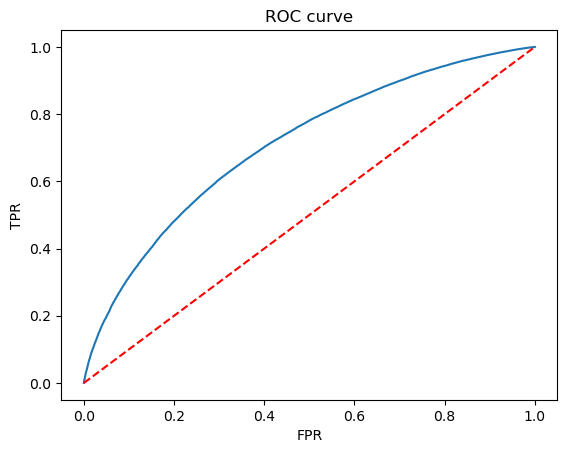

Test Data


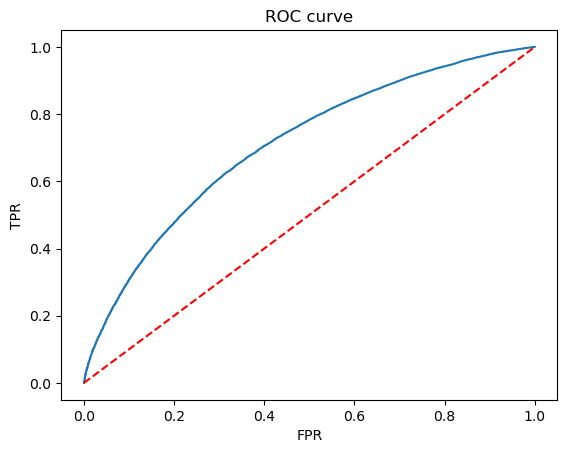

Train Metrics...
ROC AUC score 0.7091888194202054
 Precision: 0.8133
 Recall: 0.9834
 F1 Score: 0.8903
Accuracy: 0.8053


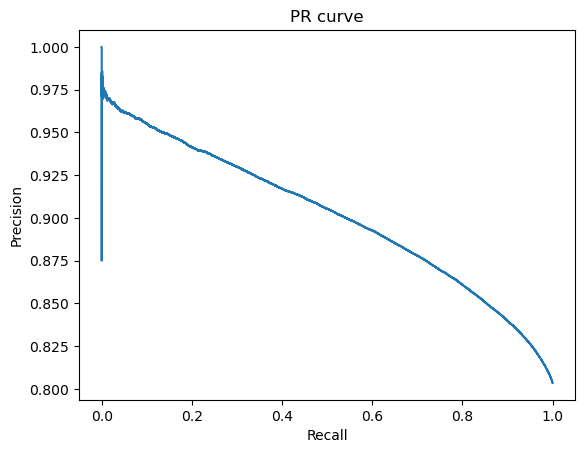

AUC score 0.9011683188858971
Test Metrics...
ROC AUC score 0.7088160824886129
 Precision: 0.8145
 Recall: 0.9835
 F1 Score: 0.8910
Accuracy: 0.8066


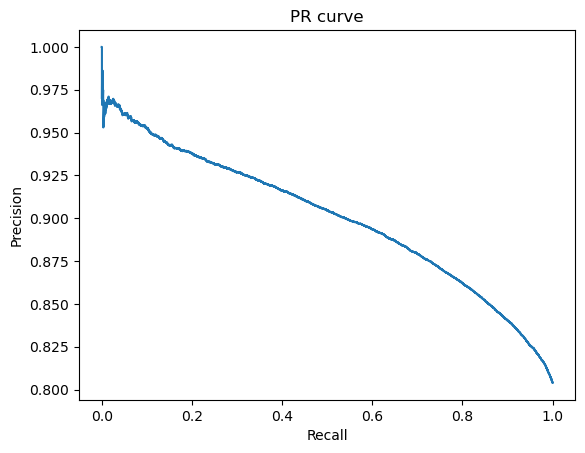

AUC score 0.9003163797764959


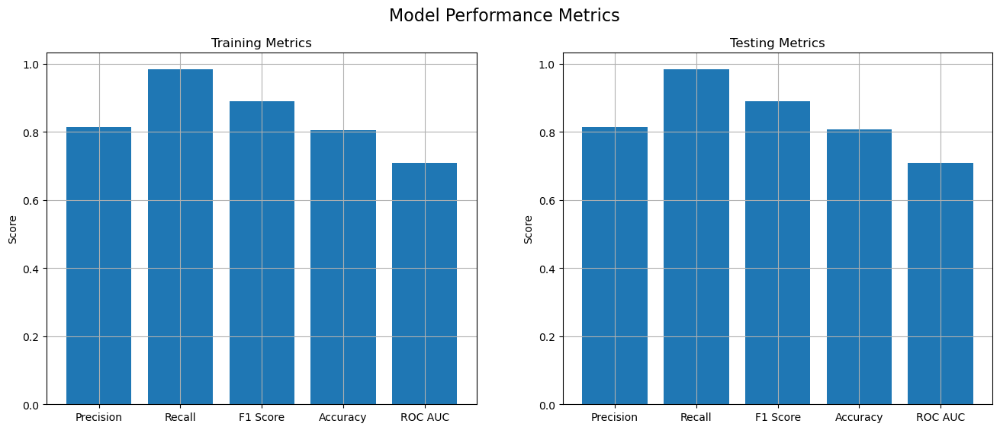

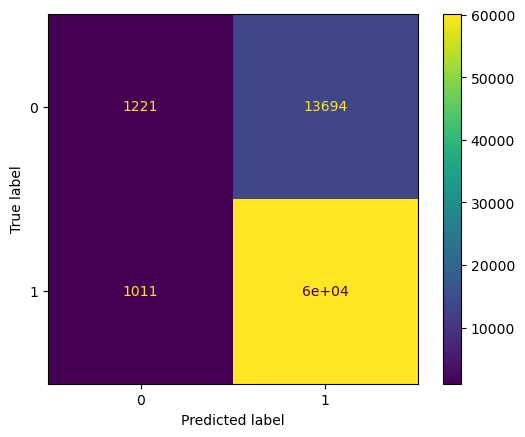

for c: 0.01
Train Data


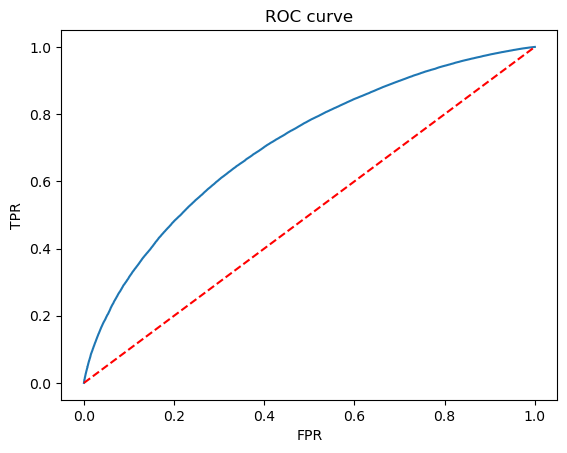

Test Data


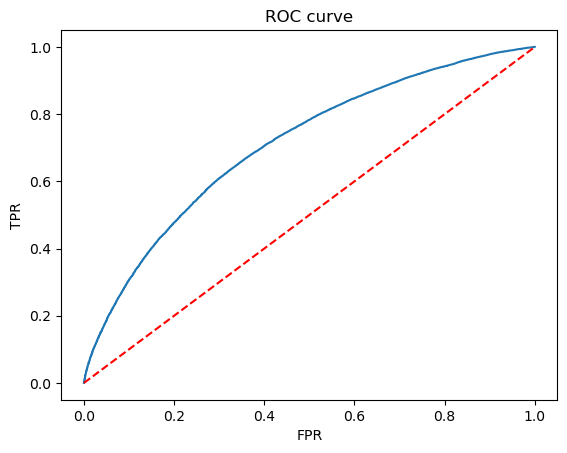

Train Metrics...
ROC AUC score 0.7092547405756691
 Precision: 0.8137
 Recall: 0.9824
 F1 Score: 0.8902
Accuracy: 0.8052


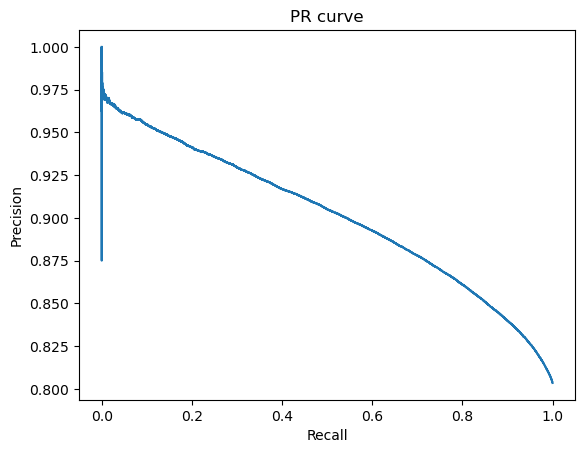

AUC score 0.9010532010460004
Test Metrics...
ROC AUC score 0.7089223564013263
 Precision: 0.8149
 Recall: 0.9825
 F1 Score: 0.8909
Accuracy: 0.8065


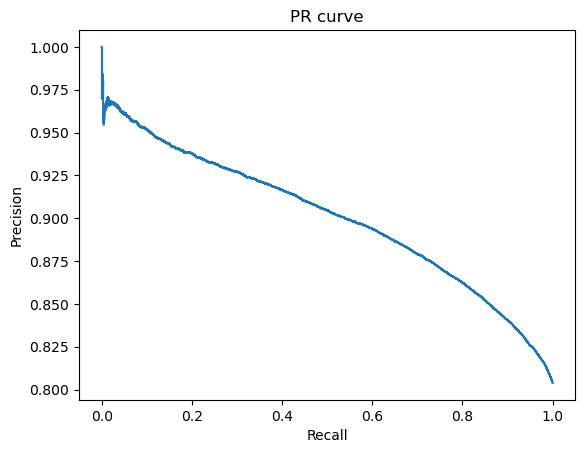

AUC score 0.9002521562222227


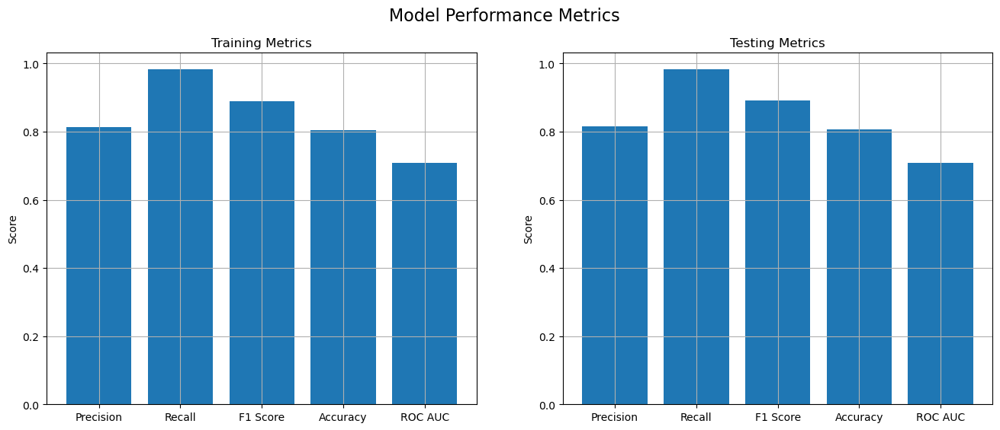

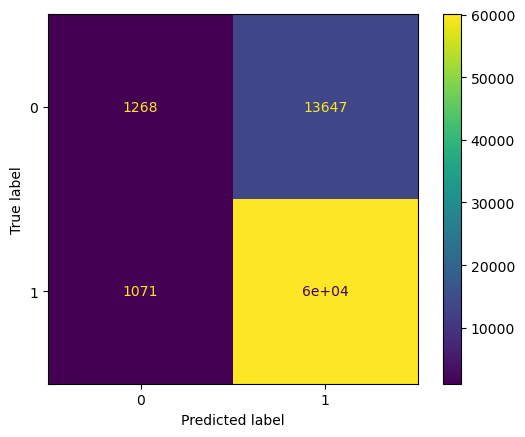

for c: 0.1
Train Data


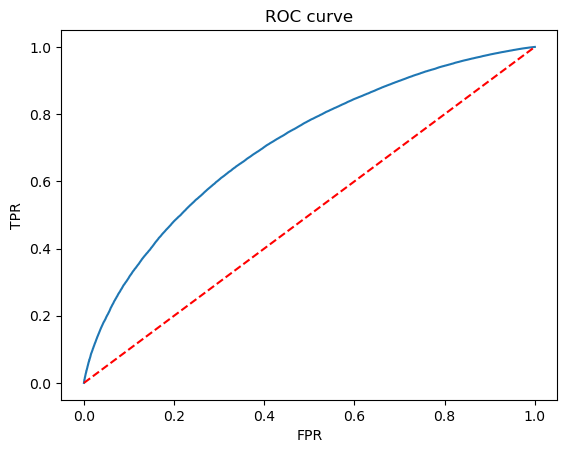

Test Data


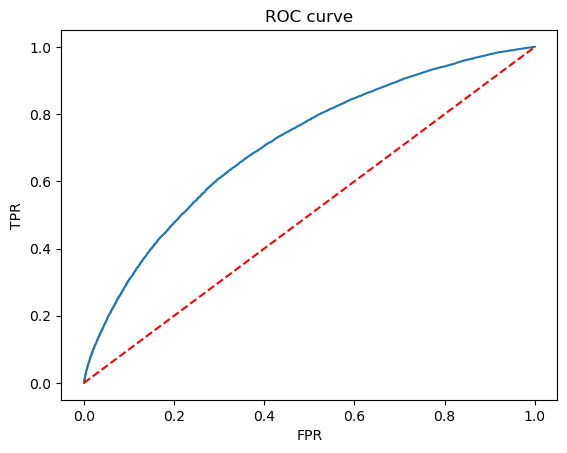

Train Metrics...
ROC AUC score 0.7092591651858793
 Precision: 0.8138
 Recall: 0.9823
 F1 Score: 0.8901
Accuracy: 0.8052


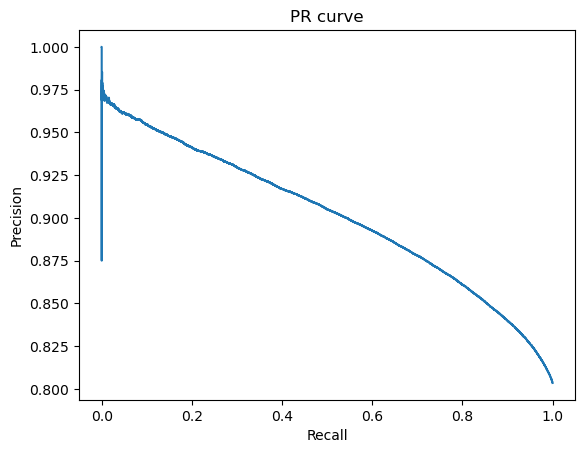

AUC score 0.9010369674636785
Test Metrics...
ROC AUC score 0.7089318671170087
 Precision: 0.8149
 Recall: 0.9824
 F1 Score: 0.8908
Accuracy: 0.8064


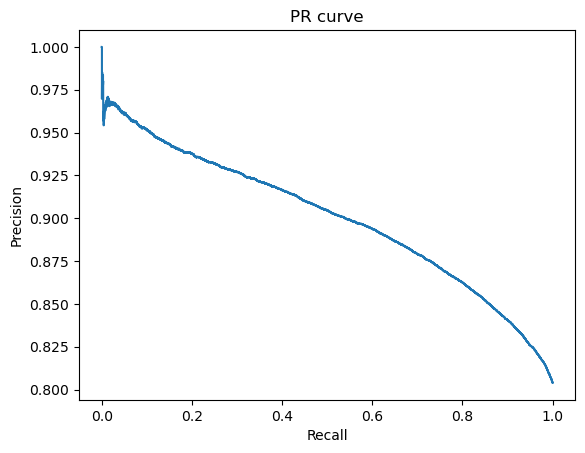

AUC score 0.9002440649478742


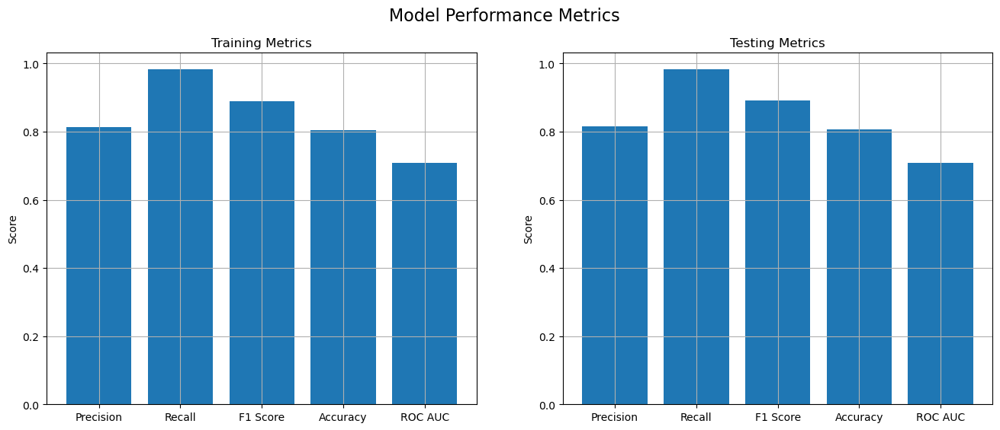

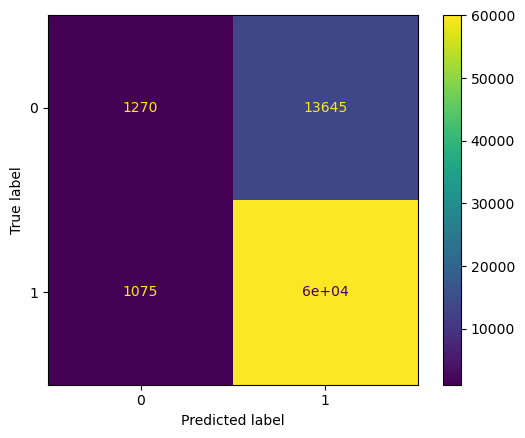

for c: 1
Train Data


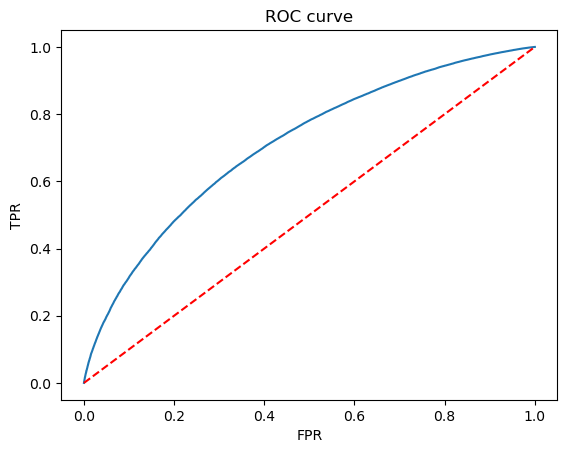

Test Data


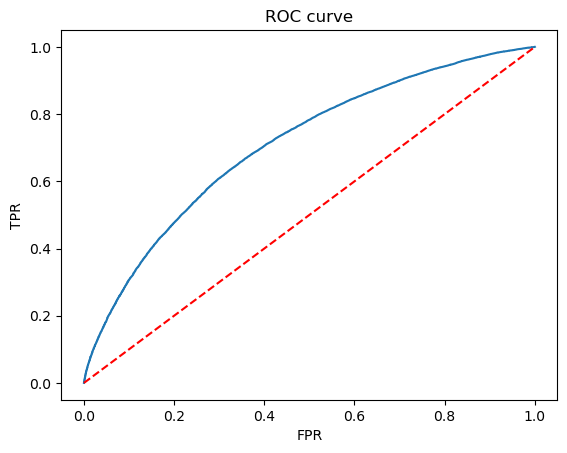

Train Metrics...
ROC AUC score 0.7092595404335595
 Precision: 0.8138
 Recall: 0.9823
 F1 Score: 0.8901
Accuracy: 0.8052


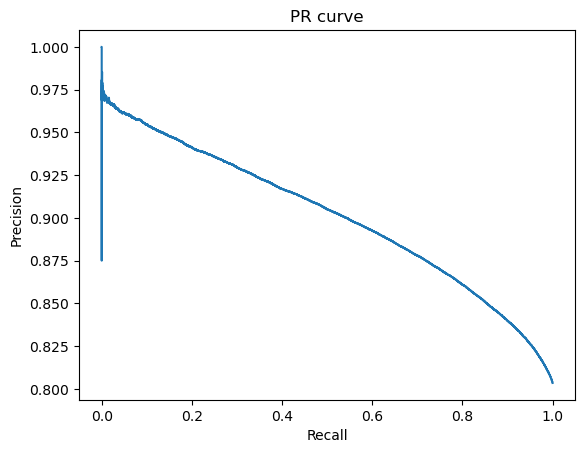

AUC score 0.9010352531229185
Test Metrics...
ROC AUC score 0.7089333268451653
 Precision: 0.8149
 Recall: 0.9824
 F1 Score: 0.8908
Accuracy: 0.8064


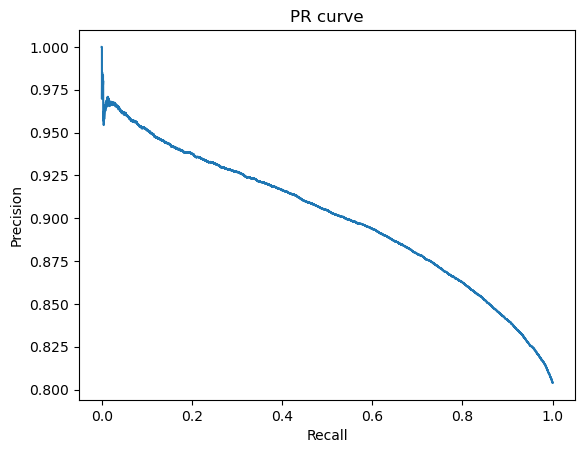

AUC score 0.9002437203163983


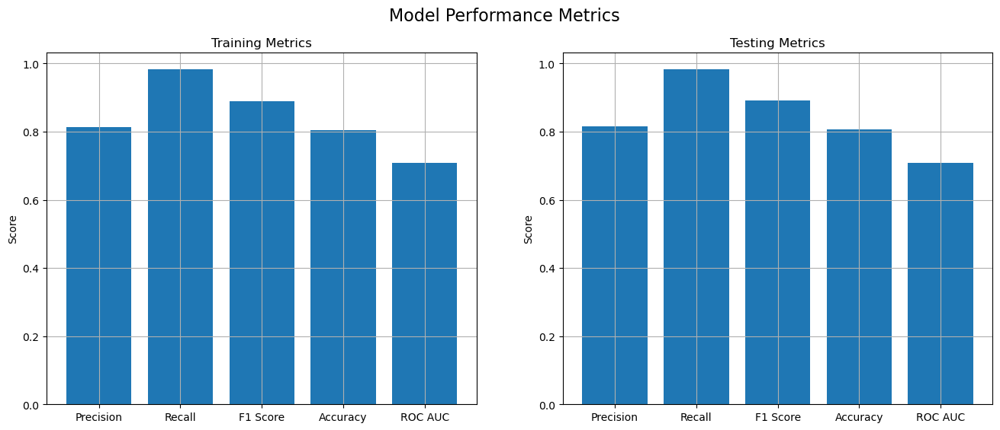

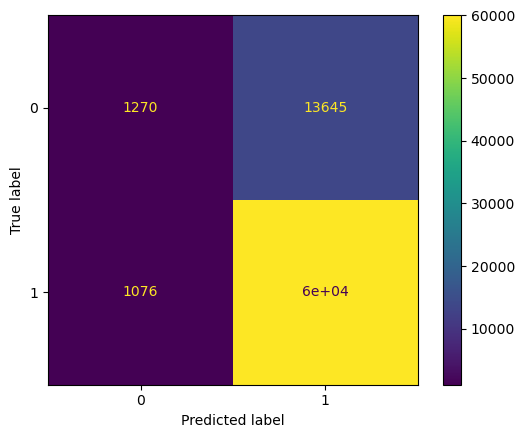

for c: 10
Train Data


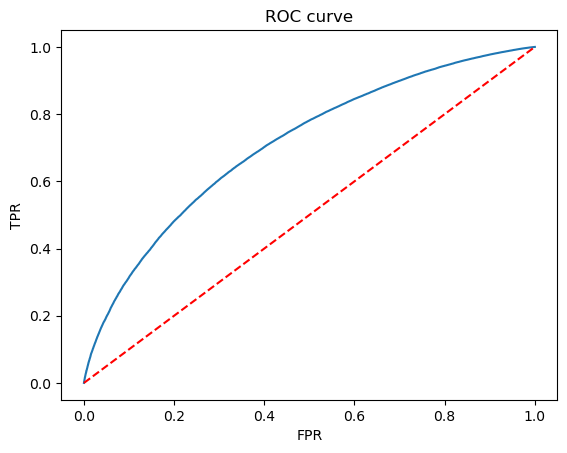

Test Data


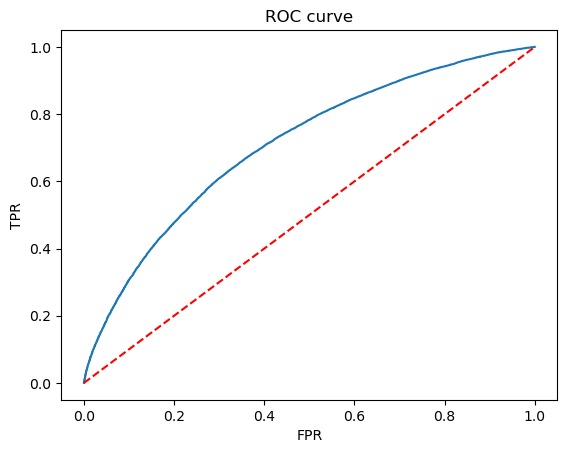

Train Metrics...
ROC AUC score 0.7092595183279602
 Precision: 0.8138
 Recall: 0.9823
 F1 Score: 0.8901
Accuracy: 0.8052


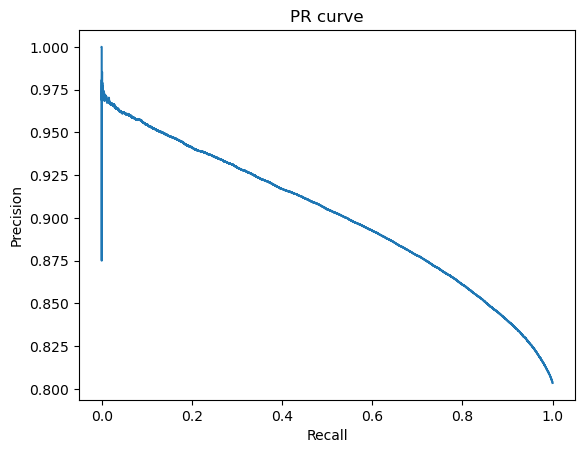

AUC score 0.9010350502410738
Test Metrics...
ROC AUC score 0.7089332676225353
 Precision: 0.8149
 Recall: 0.9824
 F1 Score: 0.8908
Accuracy: 0.8064


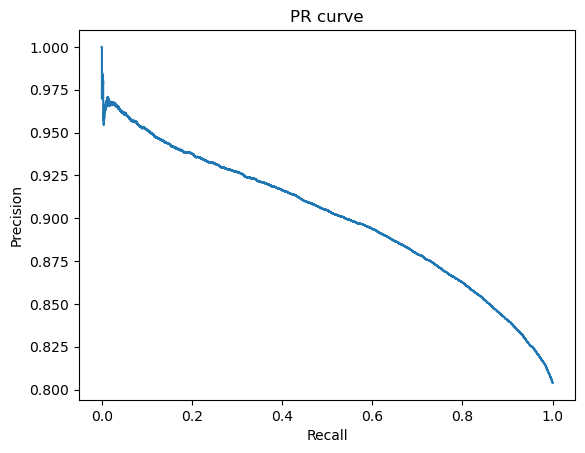

AUC score 0.9002435264752143


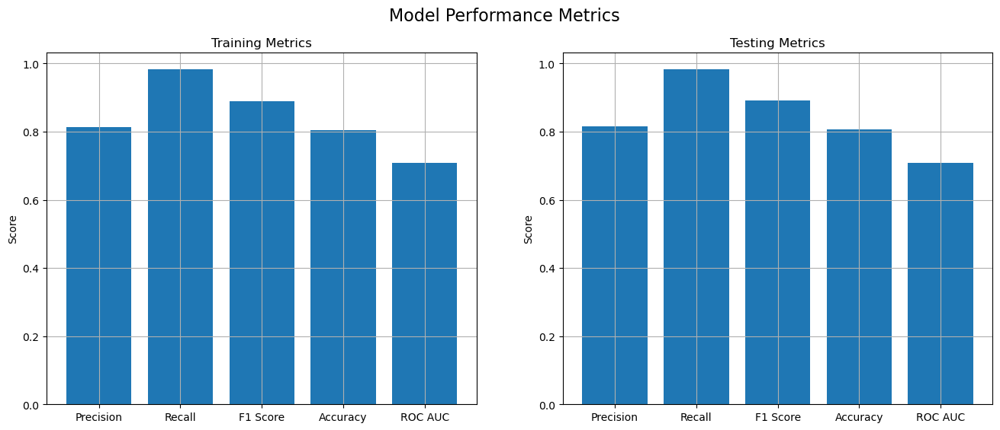

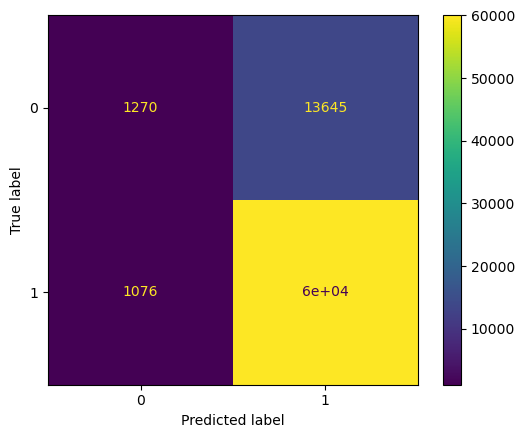

for c: 100
Train Data


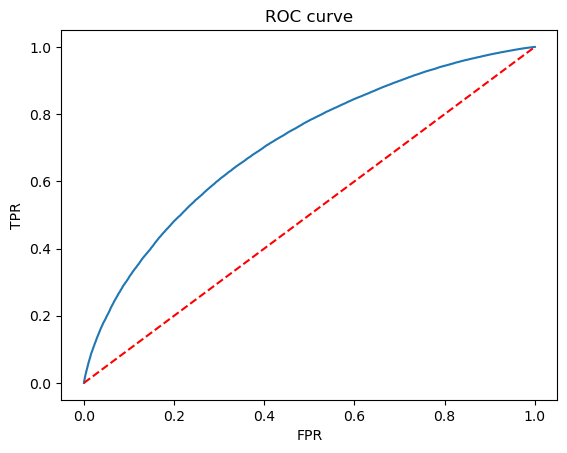

Test Data


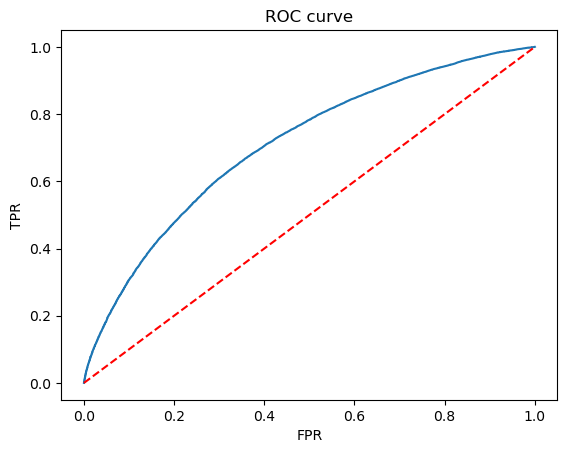

Train Metrics...
ROC AUC score 0.7092595181910835
 Precision: 0.8138
 Recall: 0.9823
 F1 Score: 0.8901
Accuracy: 0.8052


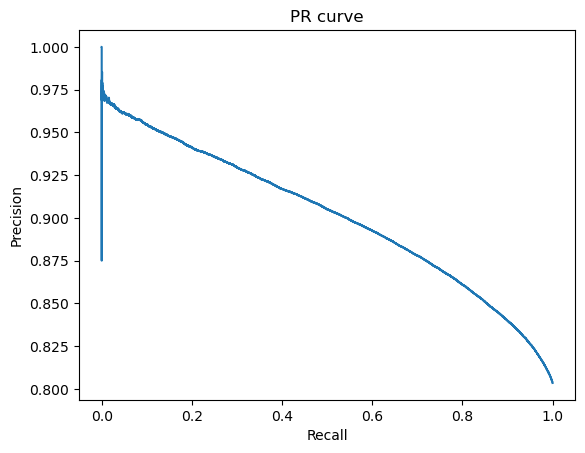

AUC score 0.9010350330057301
Test Metrics...
ROC AUC score 0.708933299427281
 Precision: 0.8149
 Recall: 0.9824
 F1 Score: 0.8908
Accuracy: 0.8064


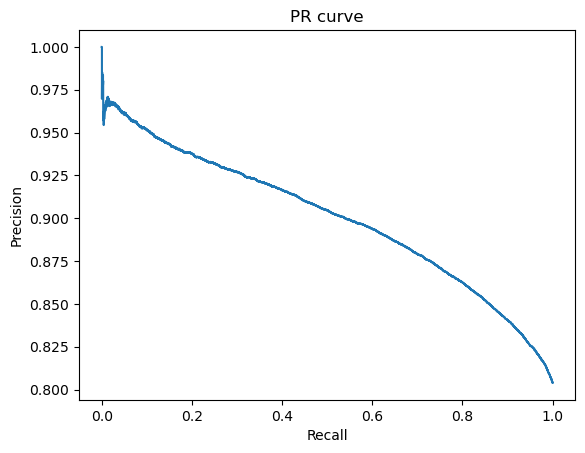

AUC score 0.9002435376497193


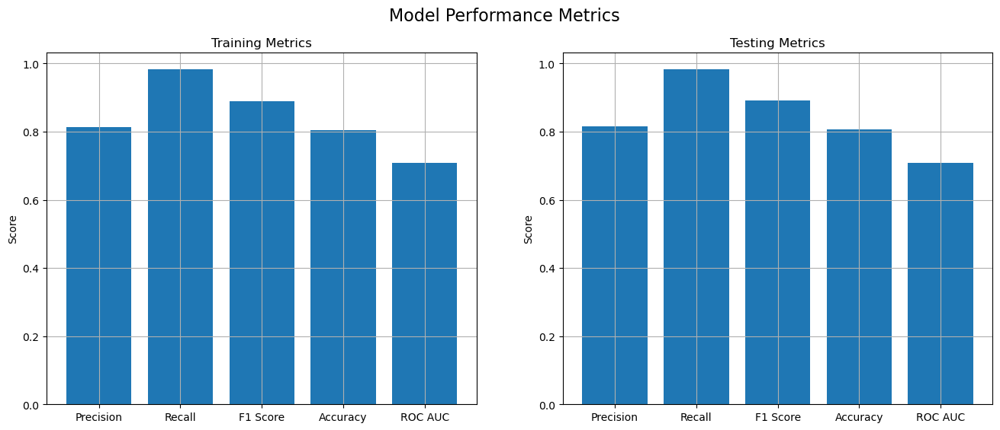

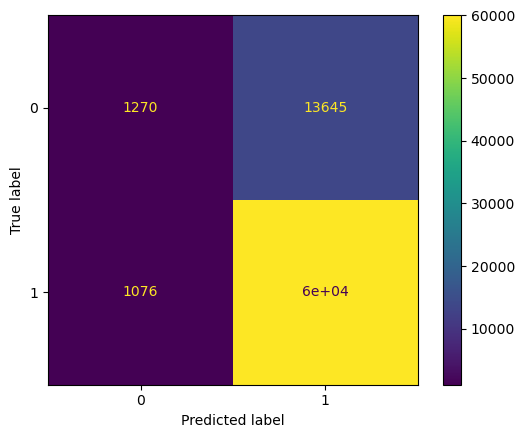

for c: 100
Train Data


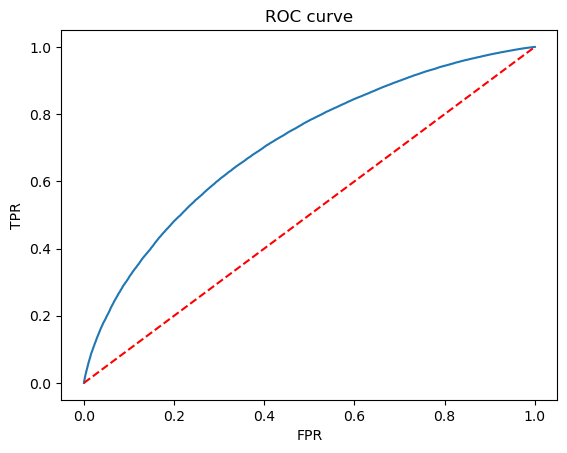

Test Data


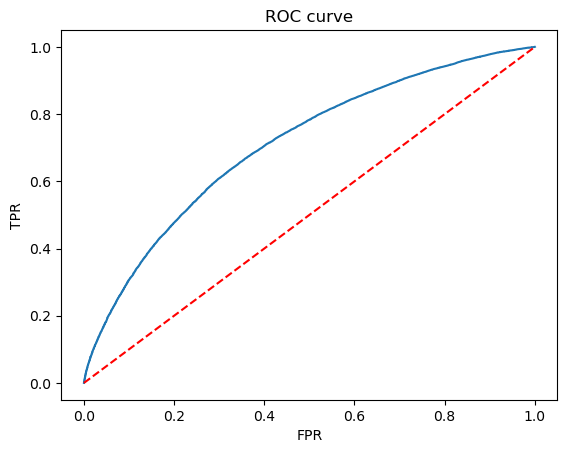

Train Metrics...
ROC AUC score 0.7092595181910835
 Precision: 0.8138
 Recall: 0.9823
 F1 Score: 0.8901
Accuracy: 0.8052


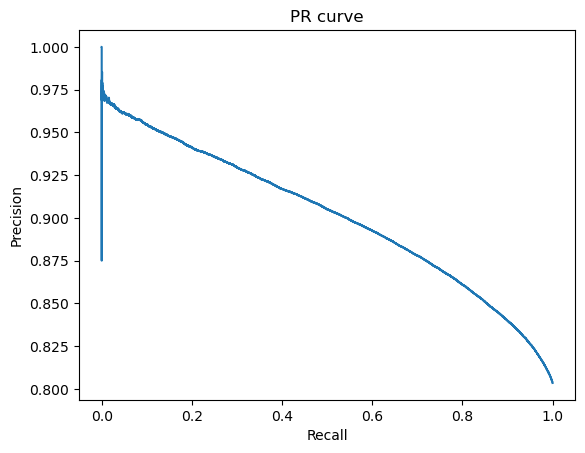

AUC score 0.9010350330057301
Test Metrics...
ROC AUC score 0.708933299427281
 Precision: 0.8149
 Recall: 0.9824
 F1 Score: 0.8908
Accuracy: 0.8064


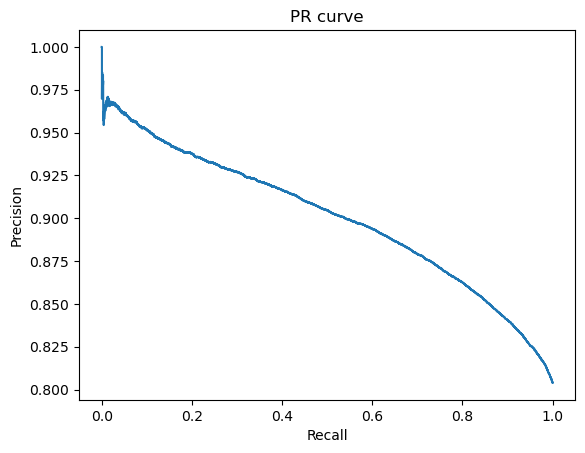

AUC score 0.9002435376497193


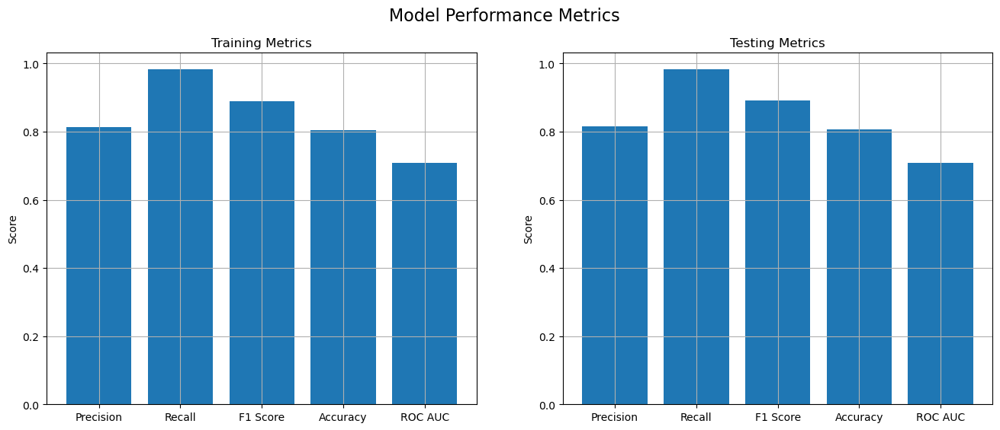

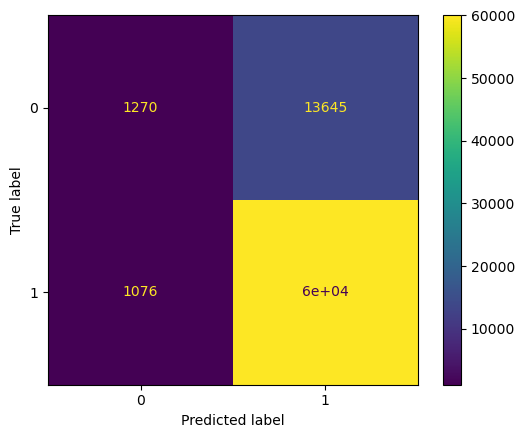

for c: 1000
Train Data


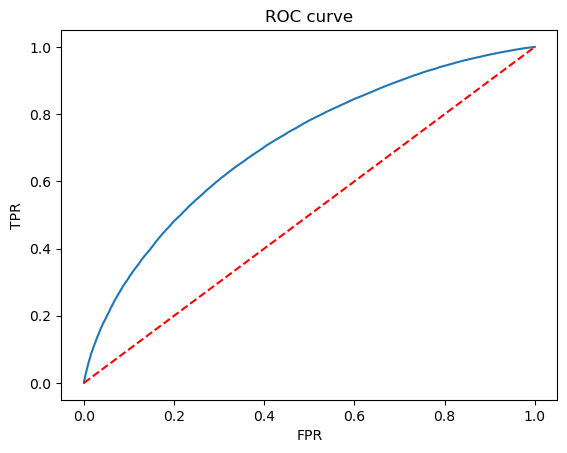

Test Data


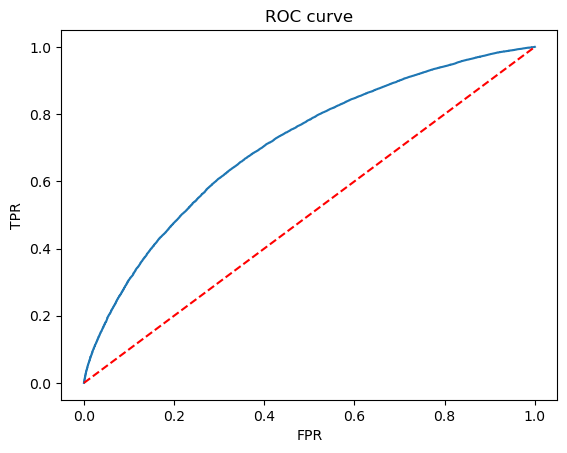

Train Metrics...
ROC AUC score 0.7092595187385906
 Precision: 0.8138
 Recall: 0.9823
 F1 Score: 0.8901
Accuracy: 0.8052


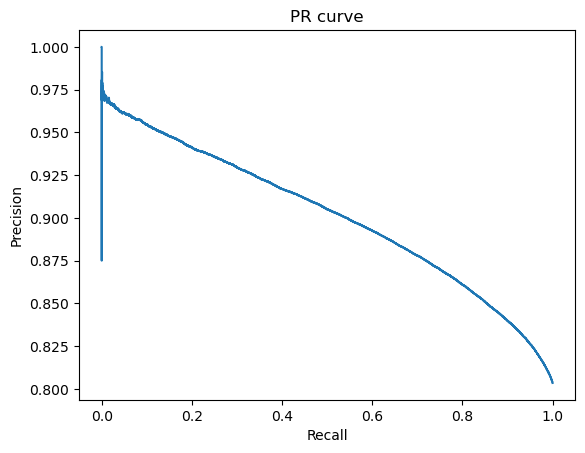

AUC score 0.9010350320140821
Test Metrics...
ROC AUC score 0.7089332884601274
 Precision: 0.8149
 Recall: 0.9824
 F1 Score: 0.8908
Accuracy: 0.8064


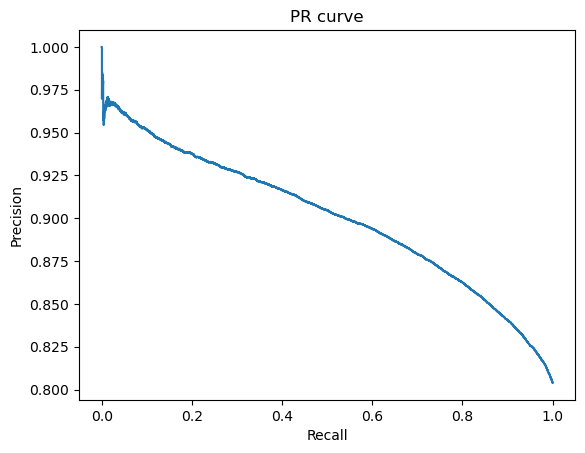

AUC score 0.9002435256627342


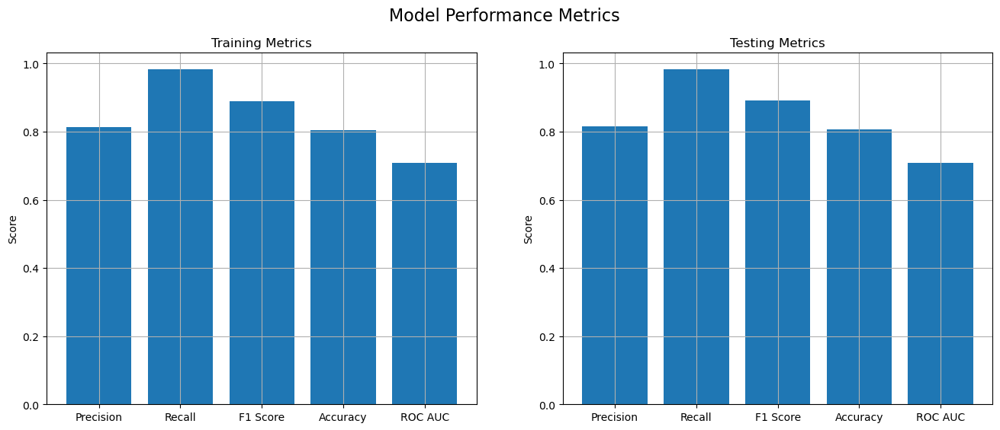

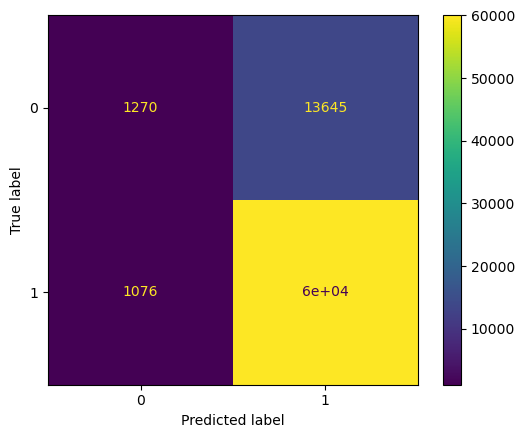

,C,precision,recall,f1,accuracy,rocauc
3,0.1000,0.814868,0.982416,0.890832,0.806441,0.708932
4,1.0000,0.814865,0.982399,0.890824,0.806427,0.708933
5,10.0000,0.814865,0.982399,0.890824,0.806427,0.708933
6,100.0000,0.814865,0.982399,0.890824,0.806427,0.708933
7,1000.0000,0.814865,0.982399,0.890824,0.806427,0.708933
2,0.0100,0.814856,0.982481,0.890852,0.806467,0.708922
1,0.0010,0.814487,0.983463,0.891035,0.806638,0.708816
0,0.0001,0.811192,0.988811,0.891238,0.805994,0.708379


In [386]:
for c in [0.0001,0.001,0.01,0.1,1,10,100,100,1000]:
    print("for c:",c)
    model = LogisticRegression(C=c)
    precision_test, recall_test, f1_test, accuracy_test,roc_auc_test = modelBuild(model,X_train,y_train,X_test,y_test)
    Metric[c]["precision"] = precision_test
    Metric[c]["recall"] = recall_test
    Metric[c]["f1"] = f1_test
    Metric[c]["accuracy"] = accuracy_test
    Metric[c]["rocauc"] = roc_auc_test
    
    print("="*100)
metricToDf(Metric)

for c: 0.0001
Train Data


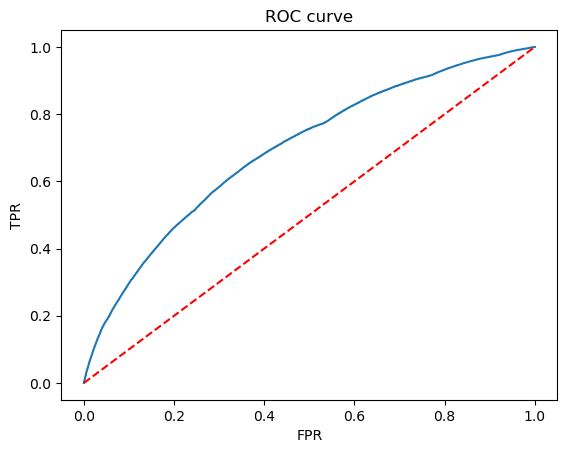

Test Data


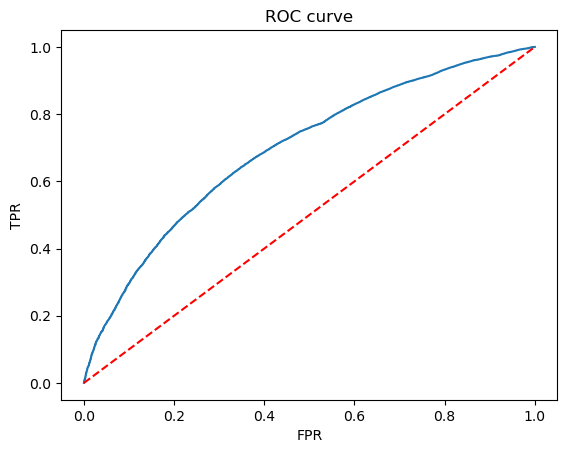

Train Metrics...
ROC AUC score 0.6937599141234453
 Precision: 0.8035
 Recall: 1.0000
 F1 Score: 0.8910
Accuracy: 0.8035


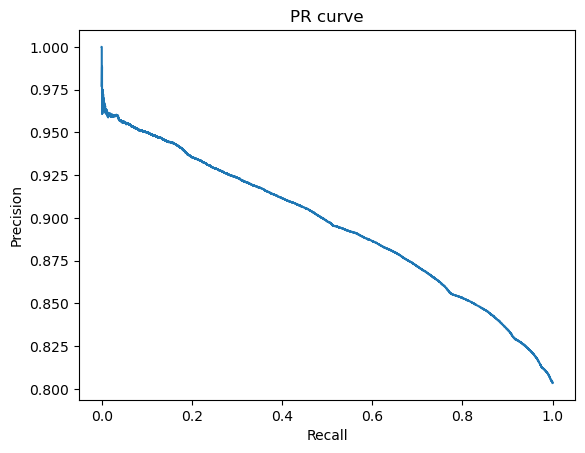

AUC score 0.8952753385526719
Test Metrics...
ROC AUC score 0.695559301313785
 Precision: 0.8039
 Recall: 1.0000
 F1 Score: 0.8913
Accuracy: 0.8039


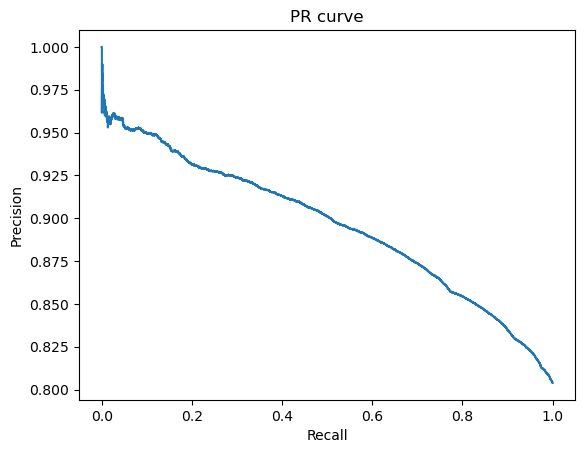

AUC score 0.8957604416455104


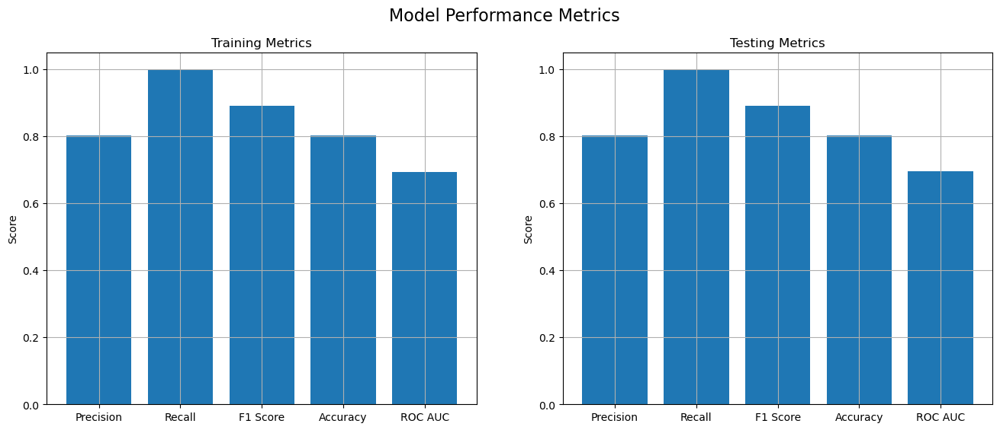

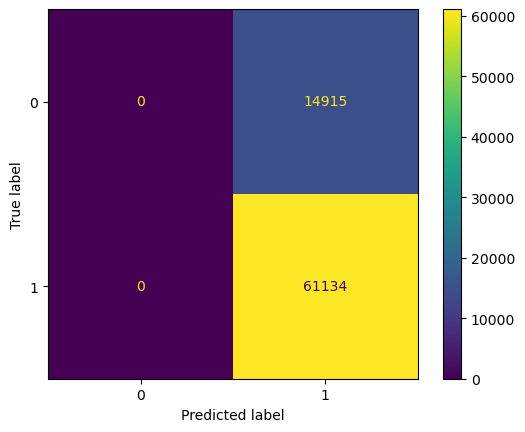

for c: 0.001
Train Data


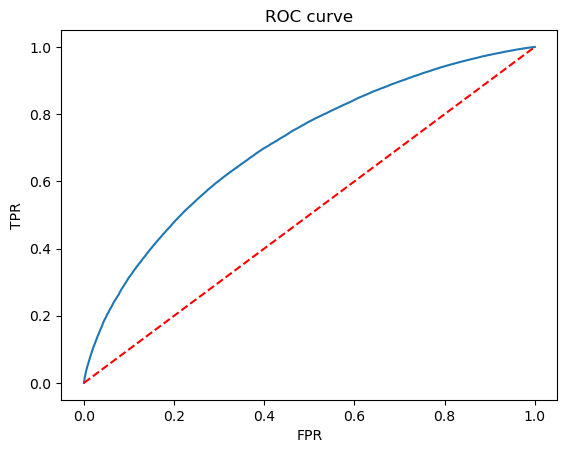

Test Data


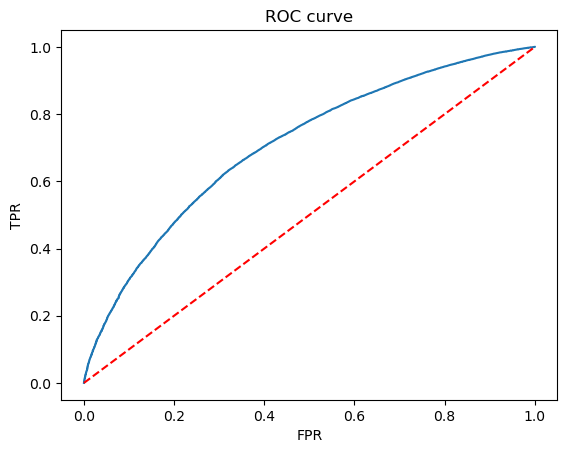

Train Metrics...
ROC AUC score 0.7073353998826488
 Precision: 0.8114
 Recall: 0.9866
 F1 Score: 0.8905
Accuracy: 0.8050


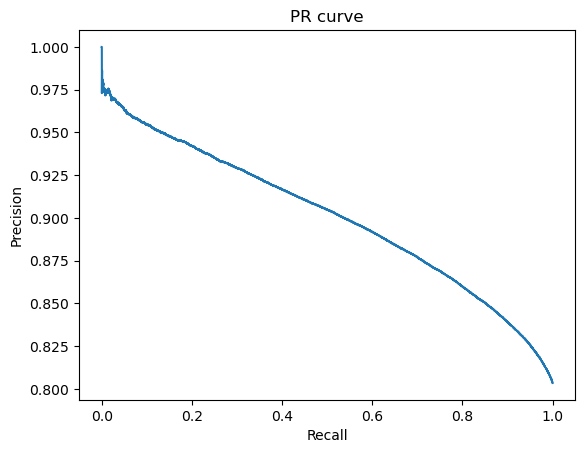

AUC score 0.9007304351805913
Test Metrics...
ROC AUC score 0.7073359565229564
 Precision: 0.8120
 Recall: 0.9864
 F1 Score: 0.8908
Accuracy: 0.8055


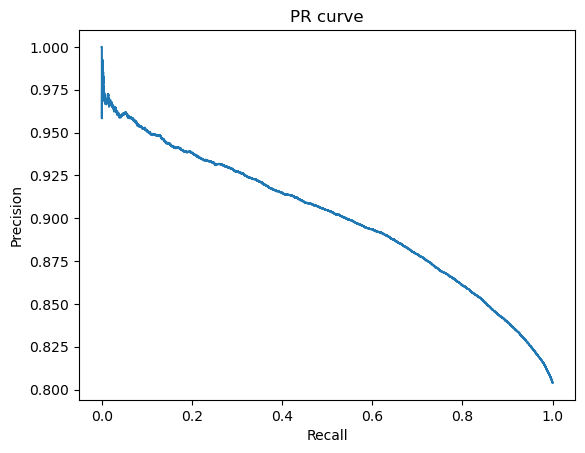

AUC score 0.8999370528182283


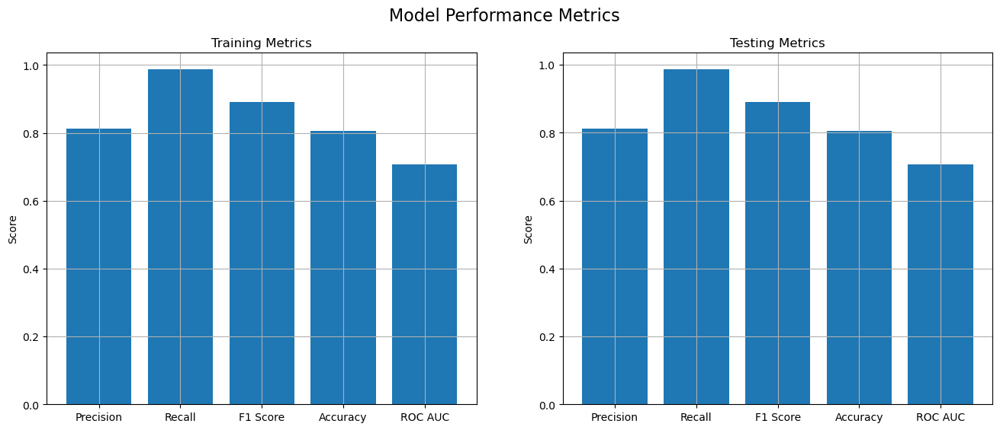

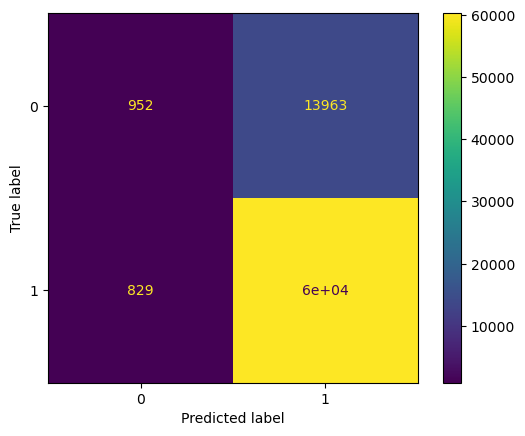

for c: 0.01


C:\Users\akash\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Train Data


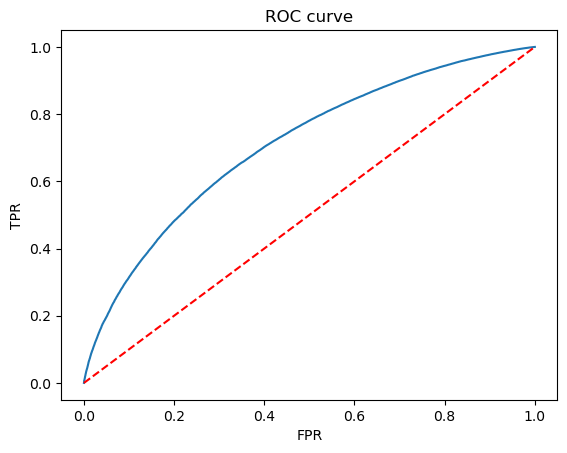

Test Data


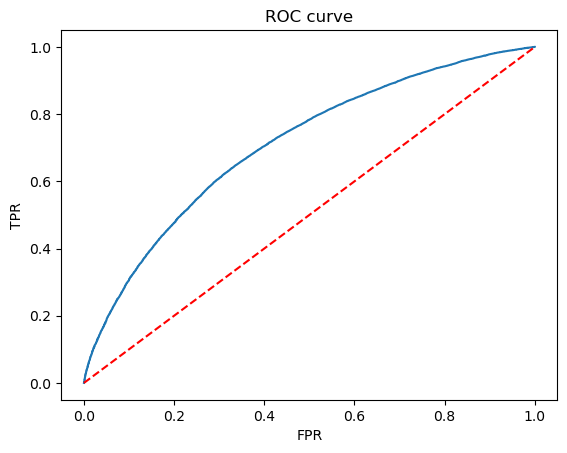

Train Metrics...
ROC AUC score 0.7092218098712935
 Precision: 0.8135
 Recall: 0.9828
 F1 Score: 0.8902
Accuracy: 0.8052


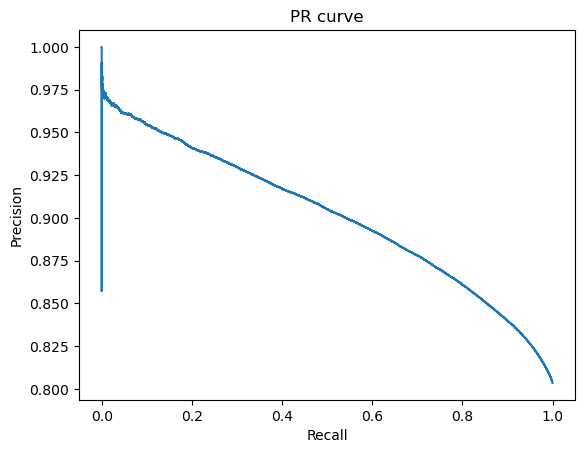

AUC score 0.9011023411248787
Test Metrics...
ROC AUC score 0.7090388440242739
 Precision: 0.8146
 Recall: 0.9830
 F1 Score: 0.8910
Accuracy: 0.8066


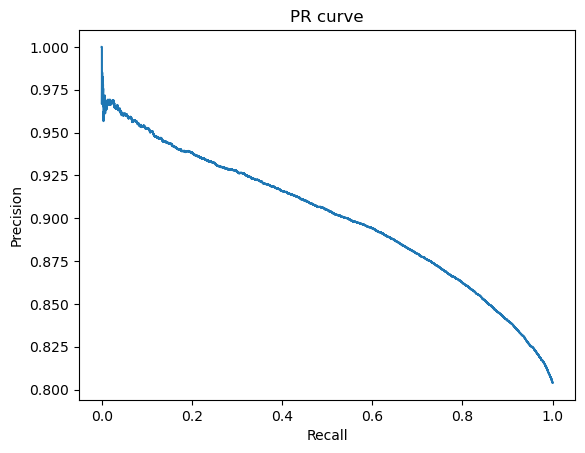

AUC score 0.9003490117125905


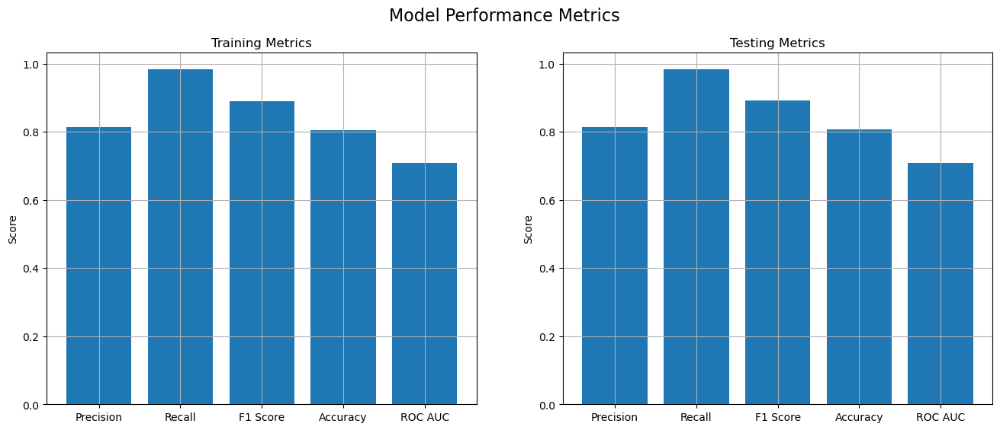

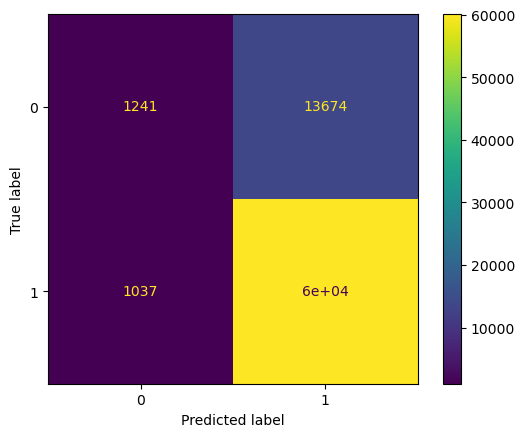

for c: 0.1


C:\Users\akash\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Train Data


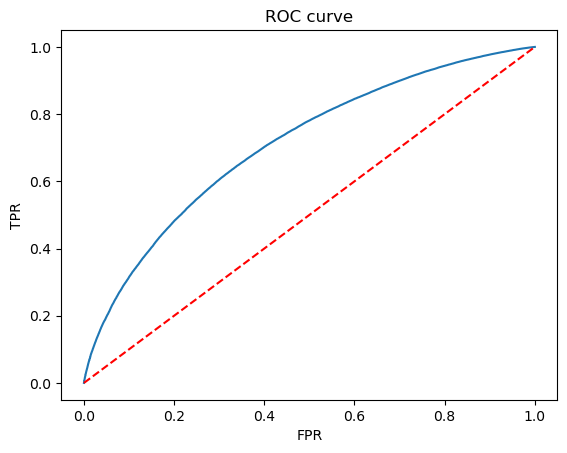

Test Data


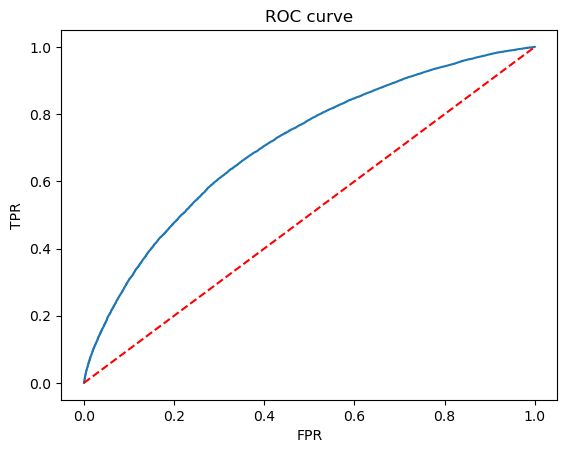

Train Metrics...
ROC AUC score 0.7092775775759809
 Precision: 0.8138
 Recall: 0.9823
 F1 Score: 0.8902
Accuracy: 0.8053


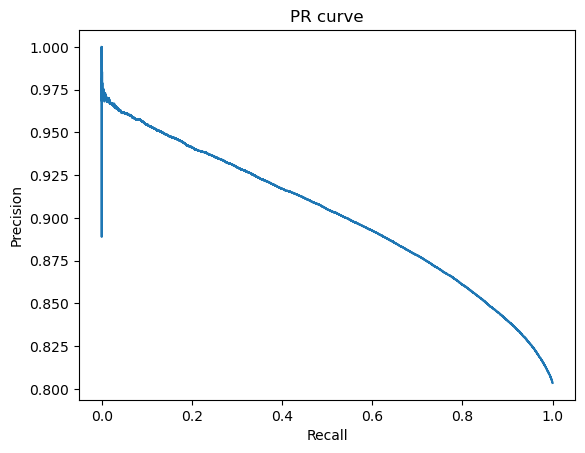

AUC score 0.9010684334012935
Test Metrics...
ROC AUC score 0.7089091683990107
 Precision: 0.8149
 Recall: 0.9824
 F1 Score: 0.8909
Accuracy: 0.8066


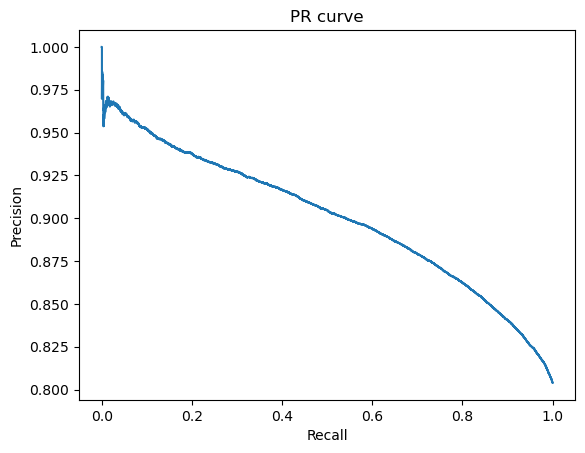

AUC score 0.9002600210186634


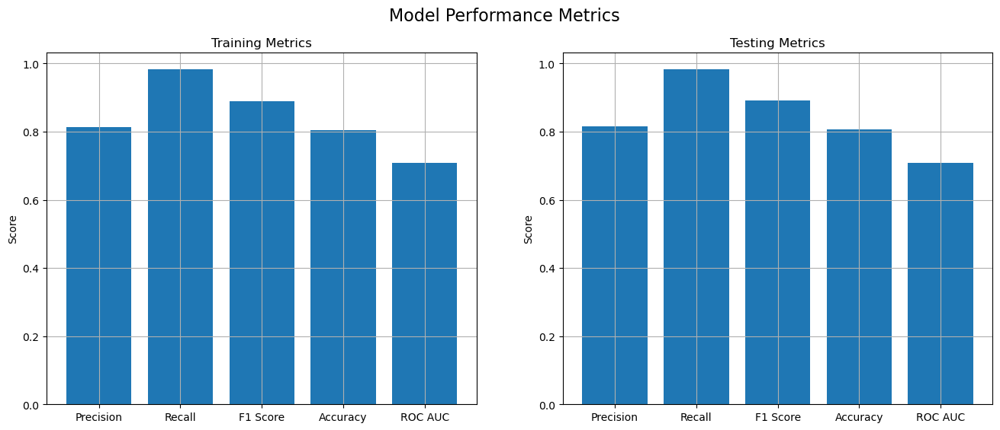

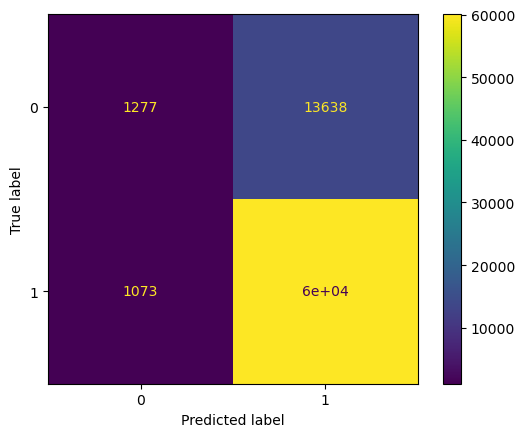

for c: 1


C:\Users\akash\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Train Data


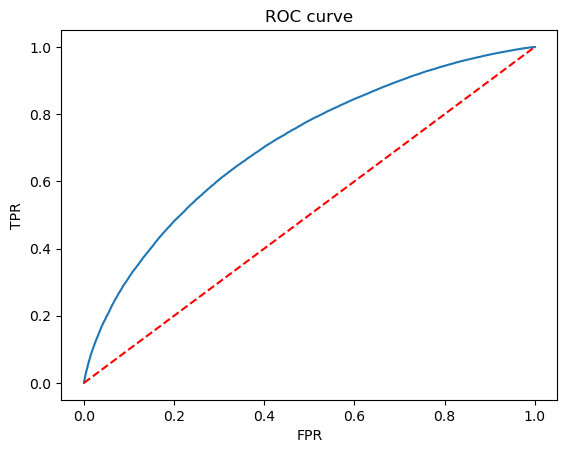

Test Data


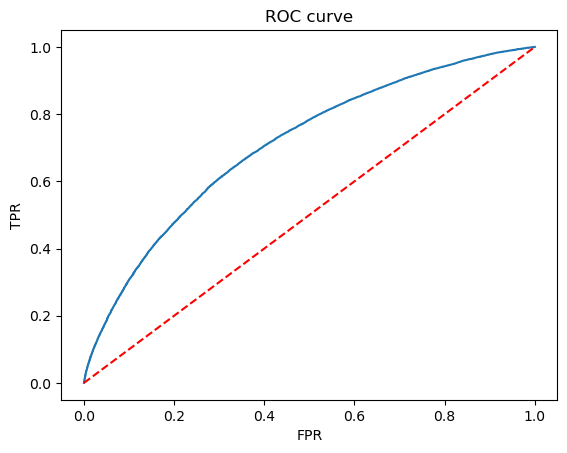

Train Metrics...
ROC AUC score 0.7092751007907261
 Precision: 0.8138
 Recall: 0.9823
 F1 Score: 0.8902
Accuracy: 0.8052


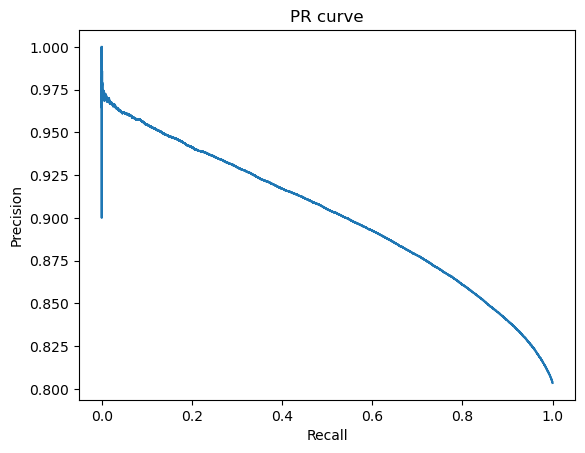

AUC score 0.9010616375757611
Test Metrics...
ROC AUC score 0.7088784757226863
 Precision: 0.8149
 Recall: 0.9824
 F1 Score: 0.8909
Accuracy: 0.8065


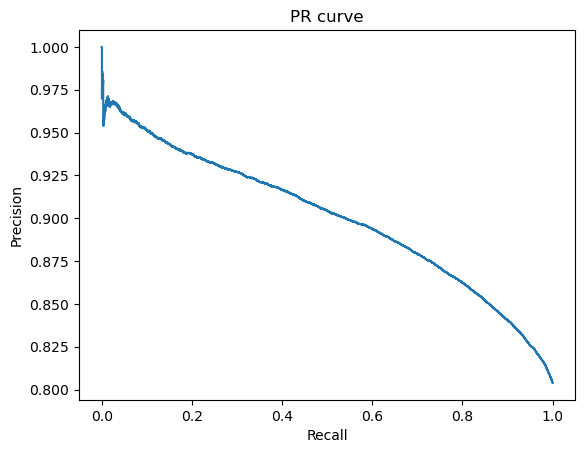

AUC score 0.900241834140602


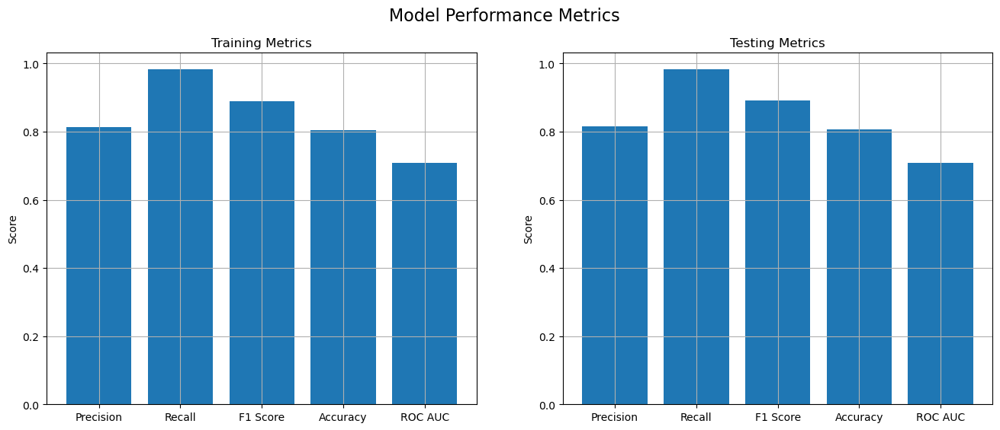

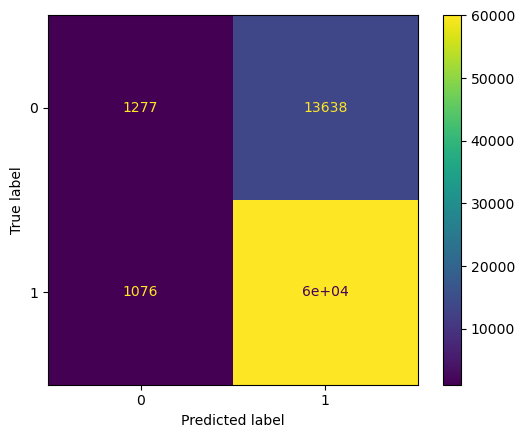

for c: 10


C:\Users\akash\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Train Data


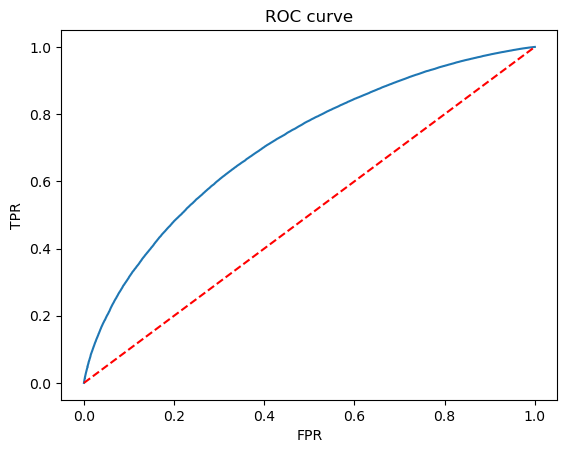

Test Data


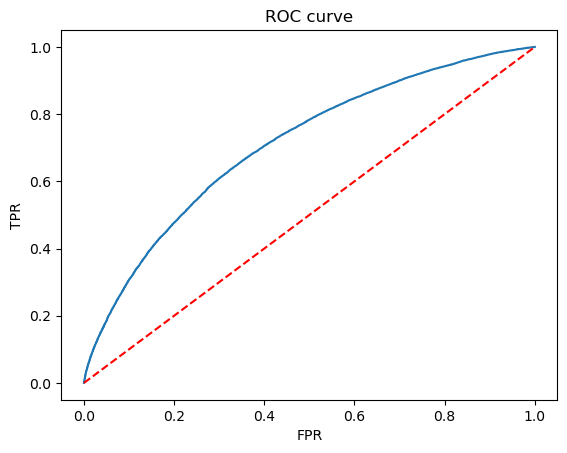

Train Metrics...
ROC AUC score 0.7092744667090631
 Precision: 0.8138
 Recall: 0.9822
 F1 Score: 0.8901
Accuracy: 0.8052


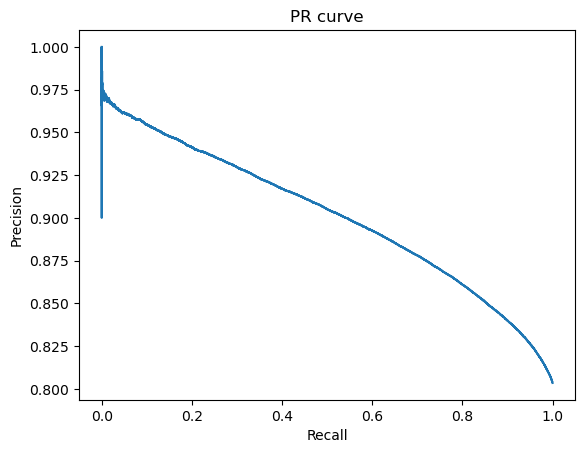

AUC score 0.9010609776443438
Test Metrics...
ROC AUC score 0.7088760399178512
 Precision: 0.8149
 Recall: 0.9824
 F1 Score: 0.8909
Accuracy: 0.8065


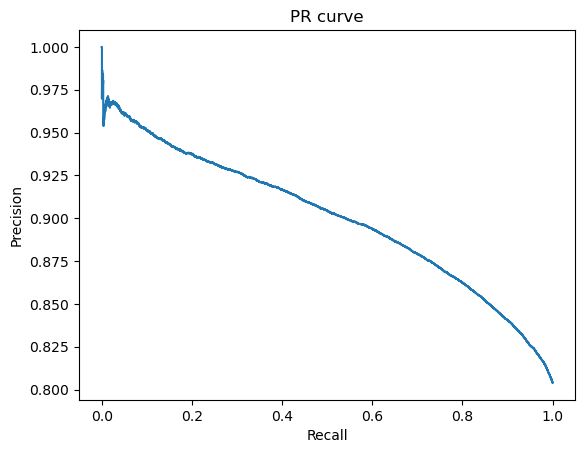

AUC score 0.9002411843023804


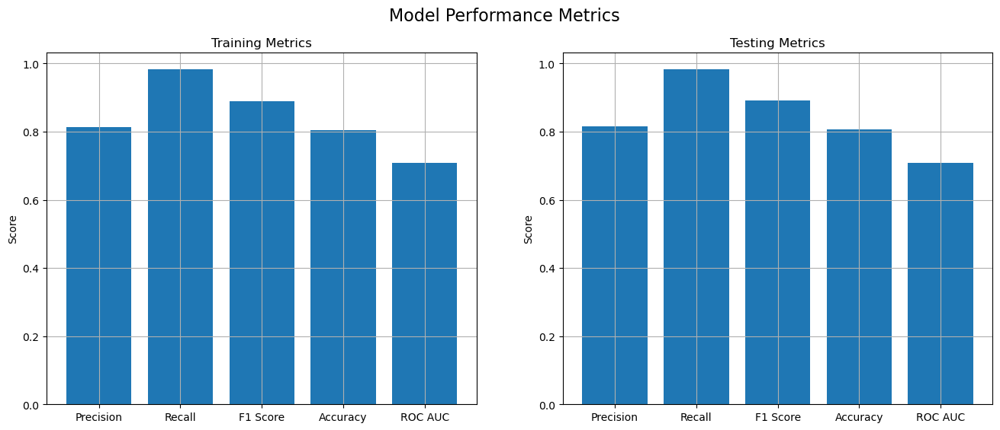

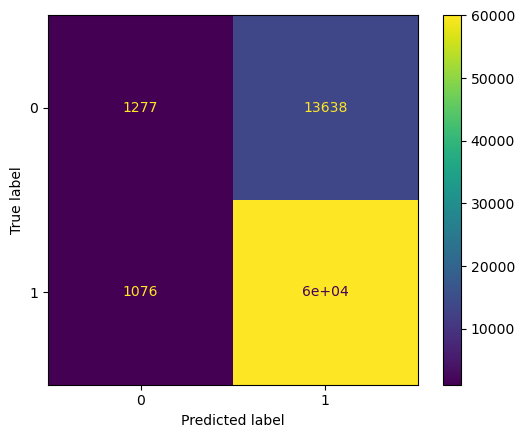

for c: 100


C:\Users\akash\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Train Data


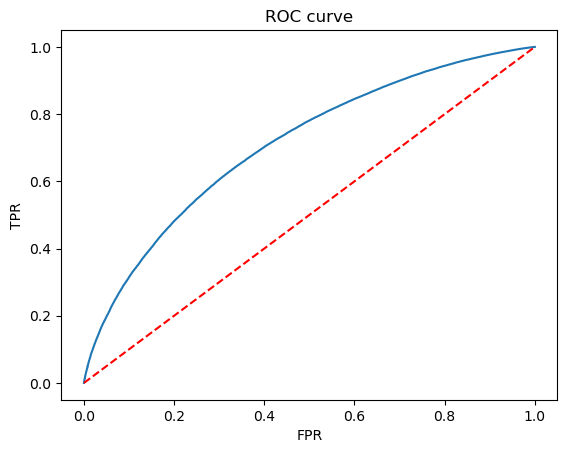

Test Data


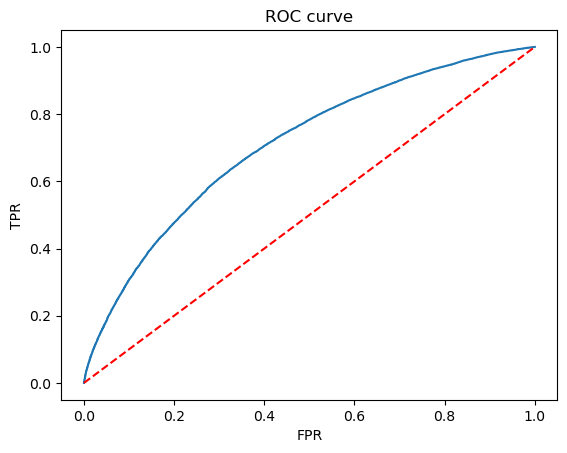

Train Metrics...
ROC AUC score 0.7092745009282572
 Precision: 0.8138
 Recall: 0.9822
 F1 Score: 0.8901
Accuracy: 0.8052


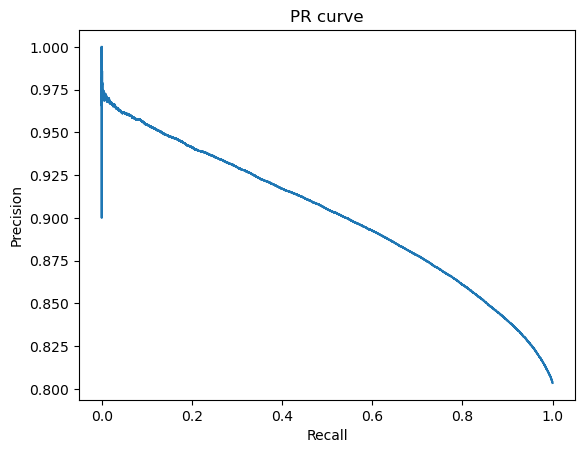

AUC score 0.9010609236770801
Test Metrics...
ROC AUC score 0.7088758370255079
 Precision: 0.8149
 Recall: 0.9824
 F1 Score: 0.8909
Accuracy: 0.8065


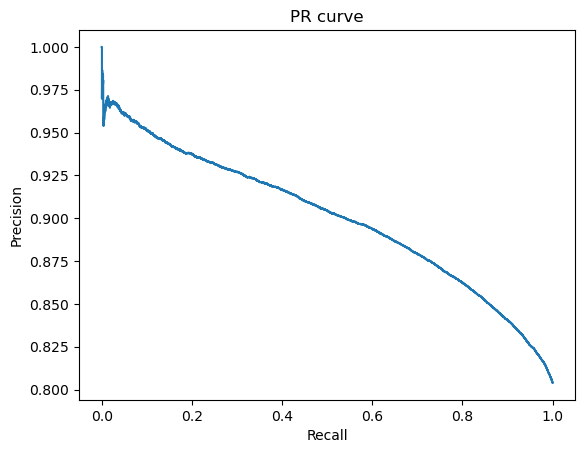

AUC score 0.9002411774869783


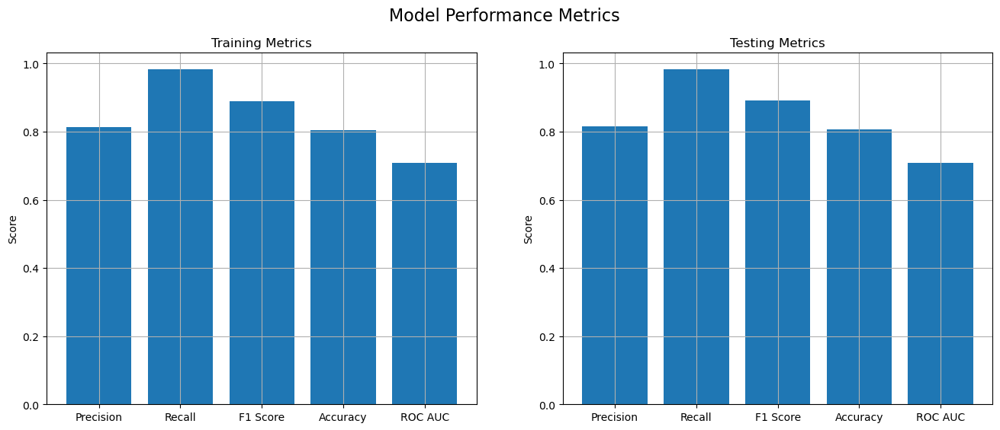

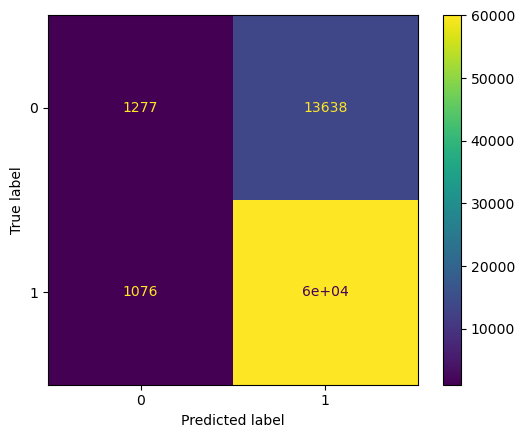

for c: 1000


C:\Users\akash\anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Train Data


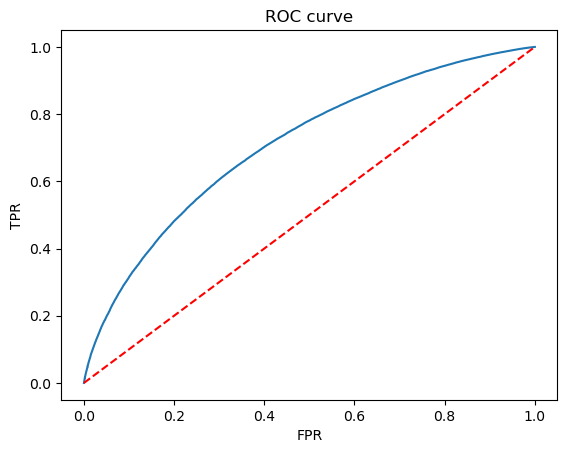

Test Data


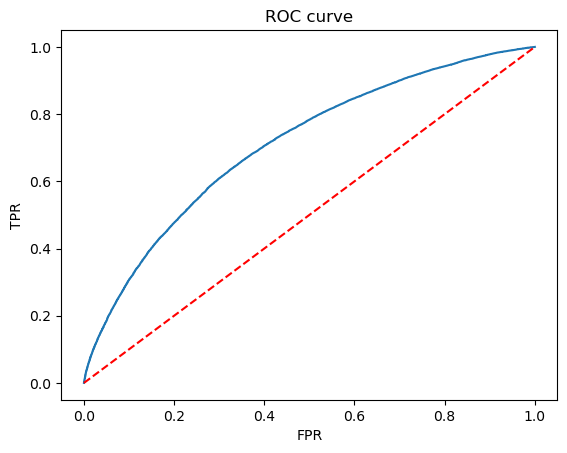

Train Metrics...
ROC AUC score 0.7092745664237943
 Precision: 0.8138
 Recall: 0.9822
 F1 Score: 0.8901
Accuracy: 0.8052


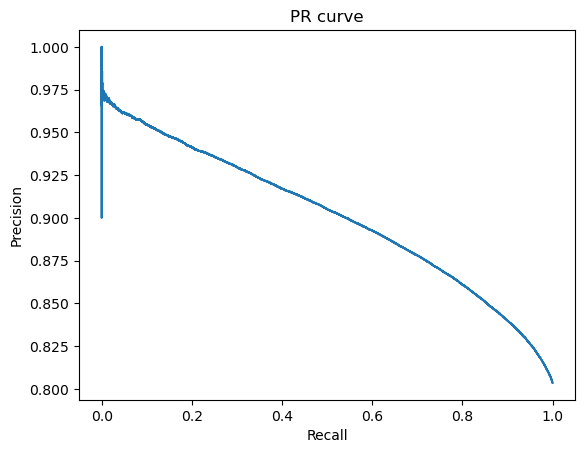

AUC score 0.9010609241096044
Test Metrics...
ROC AUC score 0.7088756801952101
 Precision: 0.8149
 Recall: 0.9824
 F1 Score: 0.8909
Accuracy: 0.8065


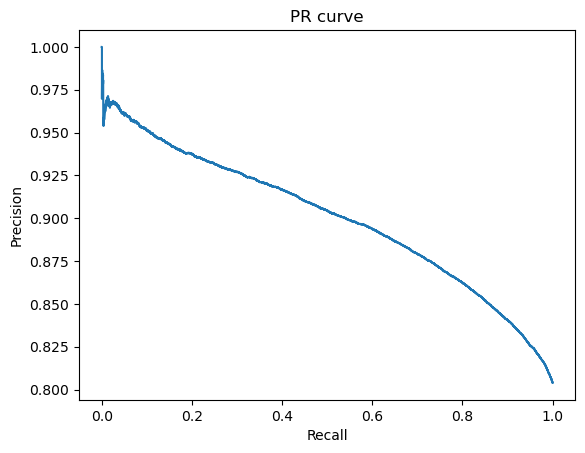

AUC score 0.9002411442837375


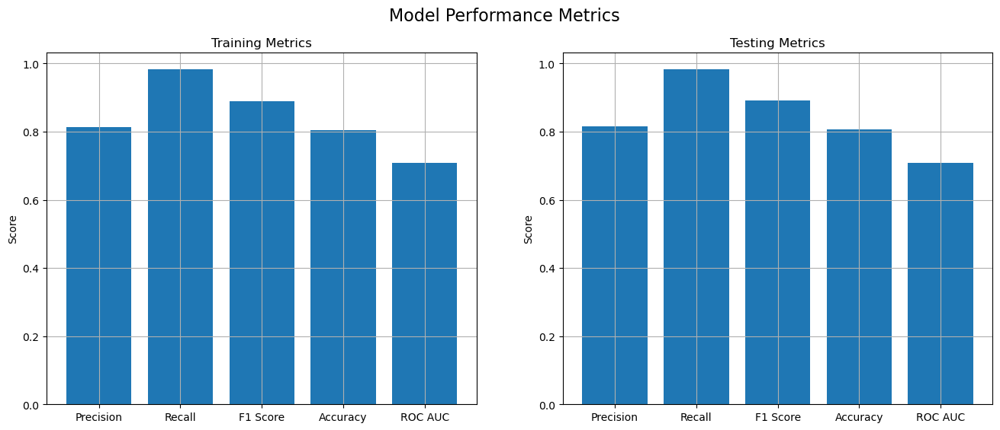

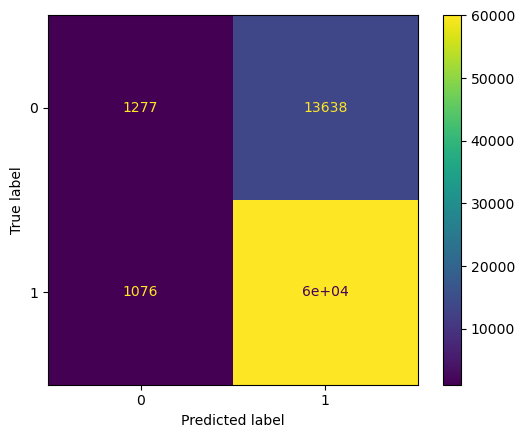

,C,precision,recall,f1,accuracy,rocauc
3,0.1000,0.814950,0.982448,0.890895,0.806559,0.708909
4,1.0000,0.814942,0.982399,0.890870,0.806519,0.708878
5,10.0000,0.814942,0.982399,0.890870,0.806519,0.708876
6,100.0000,0.814942,0.982399,0.890870,0.806519,0.708876
7,1000.0000,0.814942,0.982399,0.890870,0.806519,0.708876
2,0.0100,0.814643,0.983037,0.890953,0.806559,0.709039
1,0.0010,0.811992,0.986440,0.890755,0.805494,0.707336
0,0.0001,0.803876,1.000000,0.891277,0.803876,0.695559


In [387]:
for c in [0.0001,0.001,0.01,0.1,1,10,100,1000]:
    print("for c:",c)
    model = LogisticRegression(C=c,penalty="l1",solver="saga")
    precision_test, recall_test, f1_test, accuracy_test,roc_auc_test = modelBuild(model,X_train,y_train,X_test,y_test)
    Metric[c]["precision"] = precision_test
    Metric[c]["recall"] = recall_test
    Metric[c]["f1"] = f1_test
    Metric[c]["accuracy"] = accuracy_test
    Metric[c]["rocauc"] = roc_auc_test
    
    print("="*100)
metricToDf(Metric)

In [389]:
from sklearn.model_selection import cross_val_score
for c in [0.0001,0.001,0.01,0.1,1,10,100,1000]:
    print(c)
    model = LogisticRegression(C=c)
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring='precision')
    print(f"Cross-validated precision scores: {scores}")

0.0001
Cross-validated precision scores: [0.8094808  0.80995967 0.80992414 0.80947603 0.81017596]
0.001
Cross-validated precision scores: [0.81295122 0.81342513 0.81309455 0.81279989 0.81386454]
0.01
Cross-validated precision scores: [0.81334056 0.81388216 0.81361594 0.81341276 0.8142196 ]
0.1
Cross-validated precision scores: [0.81346597 0.81400868 0.81361193 0.81351772 0.81427288]
1
Cross-validated precision scores: [0.81345219 0.81399803 0.81360876 0.81351457 0.81427724]
10
Cross-validated precision scores: [0.81345219 0.81399803 0.81360876 0.81351457 0.81427724]
100
Cross-validated precision scores: [0.81345219 0.81399803 0.81360876 0.81351457 0.81427724]
1000
Cross-validated precision scores: [0.81345219 0.81399803 0.81360876 0.81351457 0.81427724]


## comments: precision around same

# Using Smote

In [395]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
from imblearn.over_sampling import SMOTE

# Create an instance of SMOTE
smt = SMOTE()


# Perform SMOTE on the training data
print('Before SMOTE')
print(y_train.value_counts())

X_sm, y_sm = smt.fit_resample(X_train, y_train)
print('After Oversampling')
print(y_sm.value_counts())

model = LogisticRegression(C= 5, penalty= 'l1', solver = 'liblinear')
scores = cross_val_score(model, X_train, y_train, cv=5, scoring='precision')
print(scores)

Before SMOTE
loan_status
1    244412
0     59783
Name: count, dtype: int64
After Oversampling
loan_status
1    244412
0    244412
Name: count, dtype: int64
[0.81344902 0.81406822 0.81369041 0.81354325 0.81422952]


## comments: Precision not improved

for c: 0.0001
Train Data


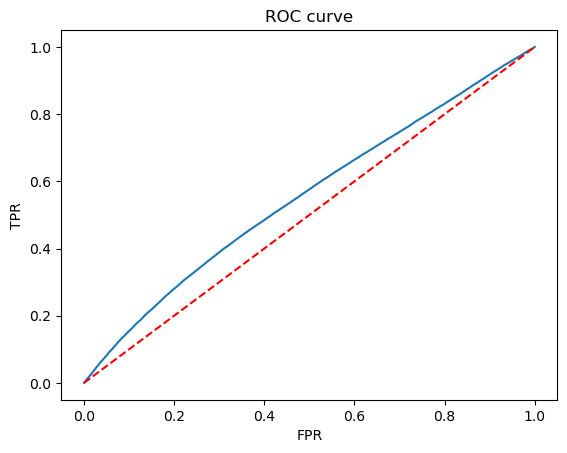

Test Data


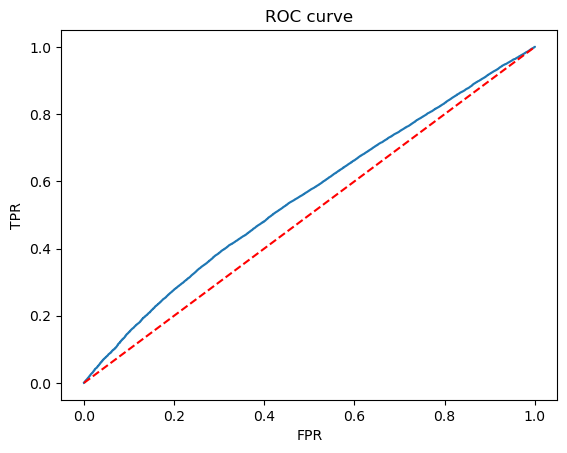

Train Metrics...
ROC AUC score 0.5553119087887419
 Precision: 0.8035
 Recall: 1.0000
 F1 Score: 0.8910
Accuracy: 0.8035


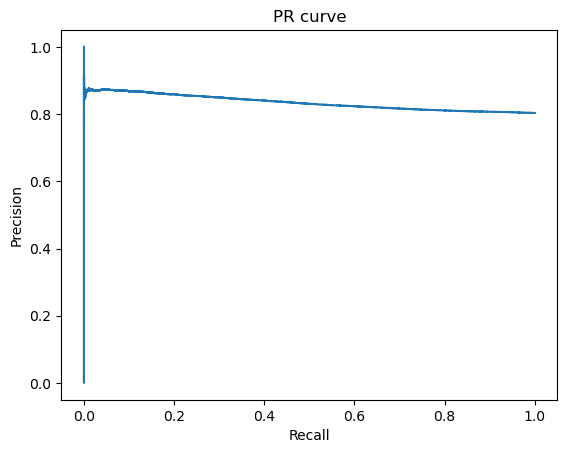

AUC score 0.8343228665784397
Test Metrics...
ROC AUC score 0.5541061983051558
 Precision: 0.8039
 Recall: 1.0000
 F1 Score: 0.8913
Accuracy: 0.8039


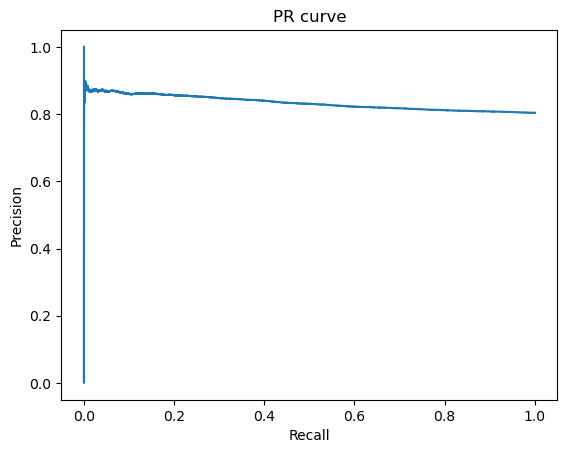

AUC score 0.8335135631184232


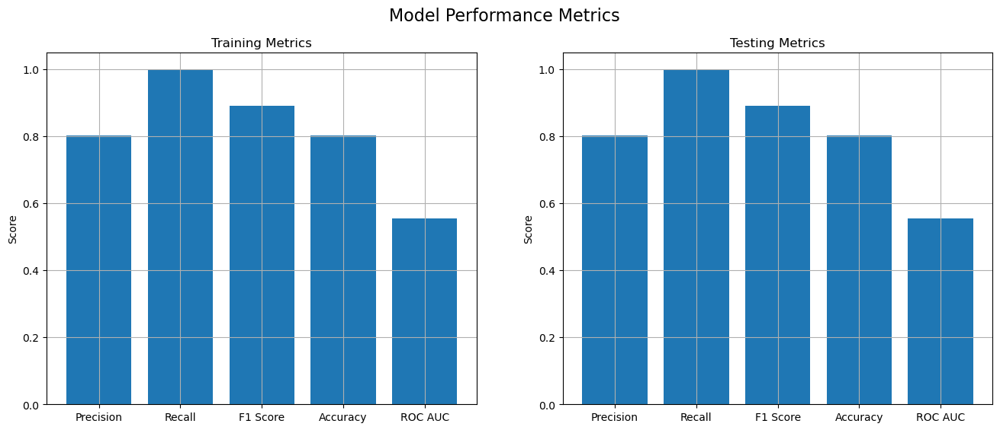

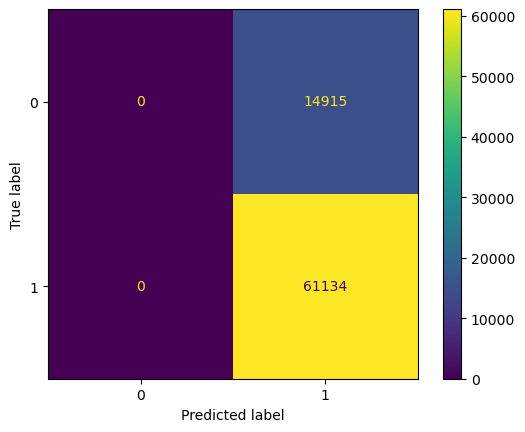

for c: 0.001
Train Data


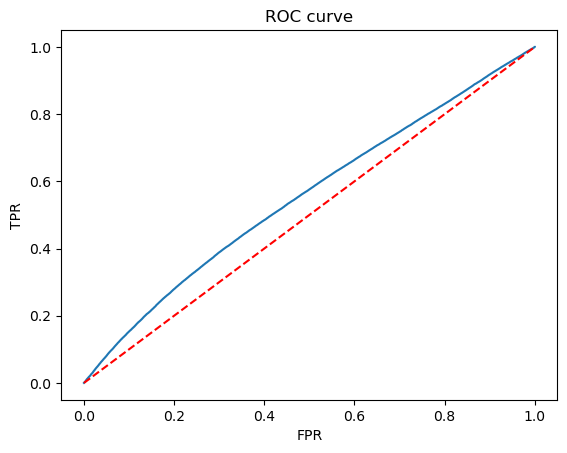

Test Data


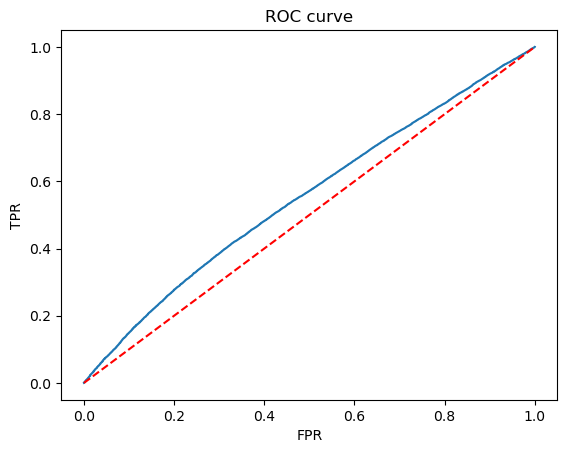

Train Metrics...
ROC AUC score 0.5548708178358243
 Precision: 0.8035
 Recall: 1.0000
 F1 Score: 0.8910
Accuracy: 0.8035


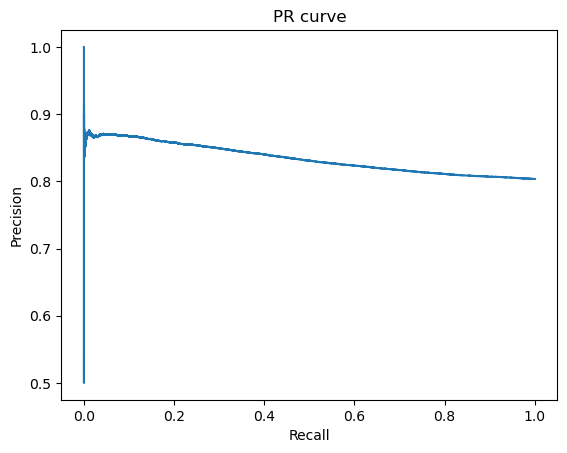

AUC score 0.8338358741550618
Test Metrics...
ROC AUC score 0.5535882481508474
 Precision: 0.8039
 Recall: 1.0000
 F1 Score: 0.8913
Accuracy: 0.8039


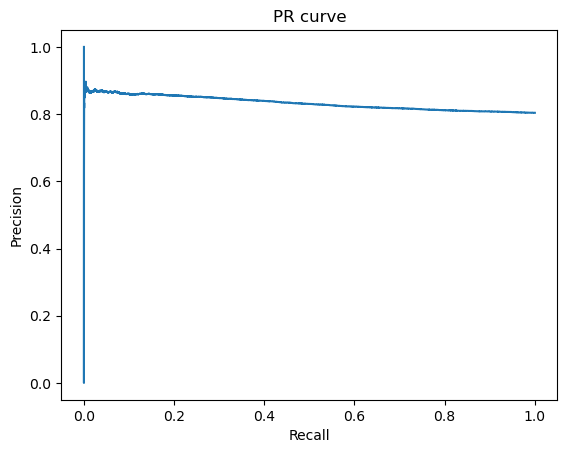

AUC score 0.833003891435992


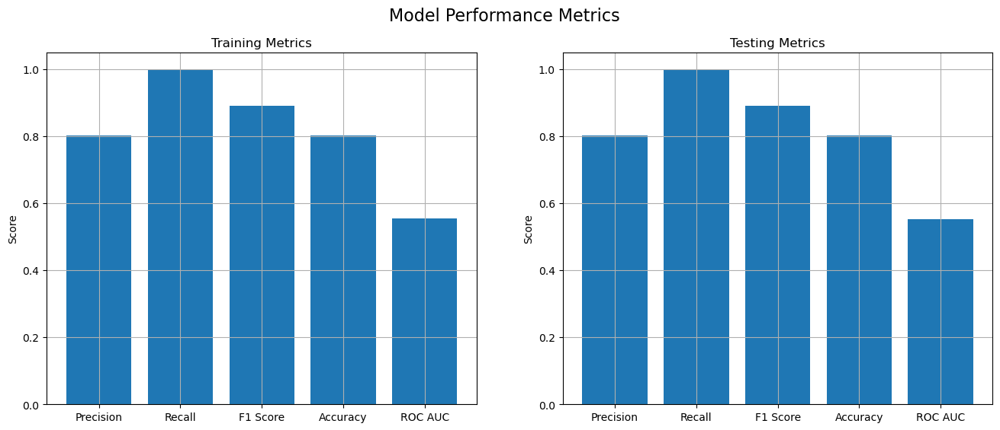

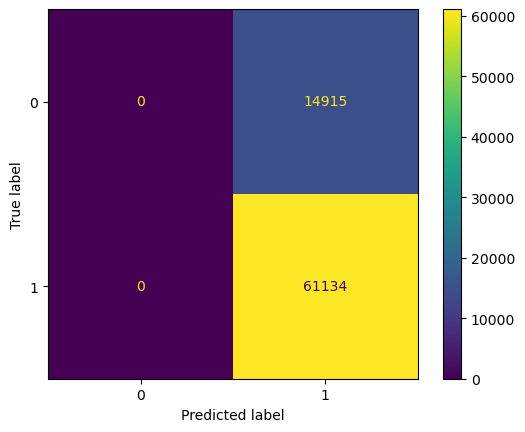

for c: 0.01
Train Data


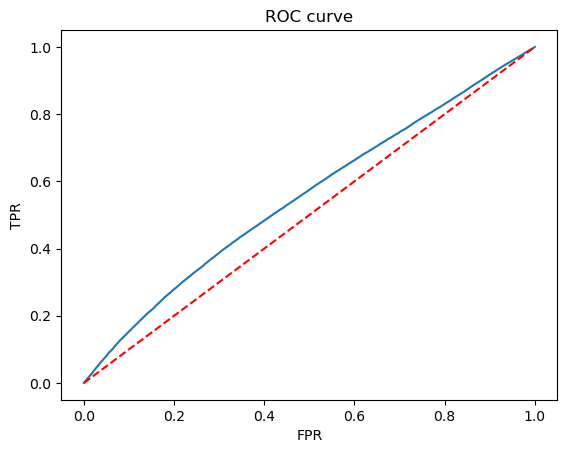

Test Data


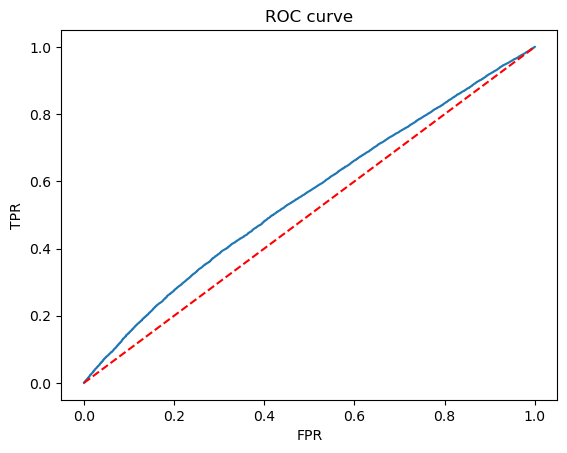

Train Metrics...
ROC AUC score 0.5542531785639124
 Precision: 0.8035
 Recall: 1.0000
 F1 Score: 0.8910
Accuracy: 0.8035


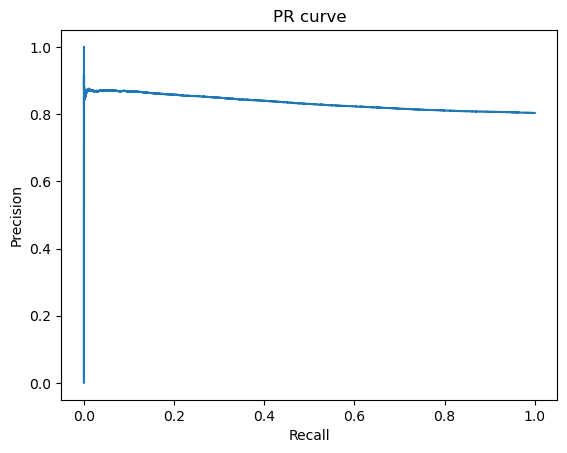

AUC score 0.8337311870866886
Test Metrics...
ROC AUC score 0.5529488927018757
 Precision: 0.8039
 Recall: 1.0000
 F1 Score: 0.8913
Accuracy: 0.8039


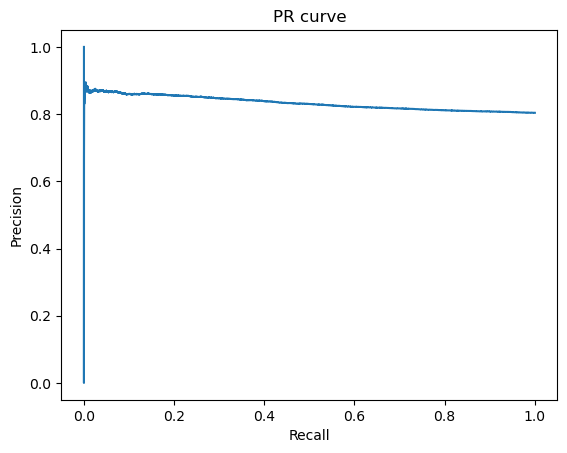

AUC score 0.8328900066217646


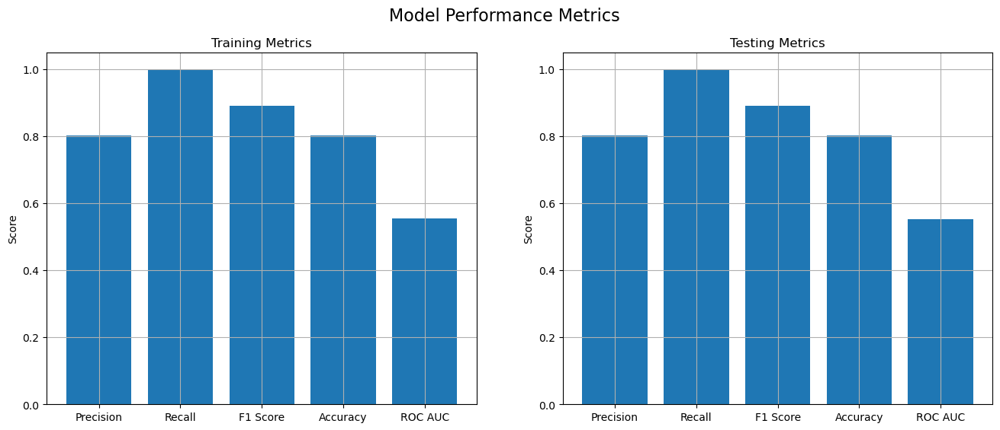

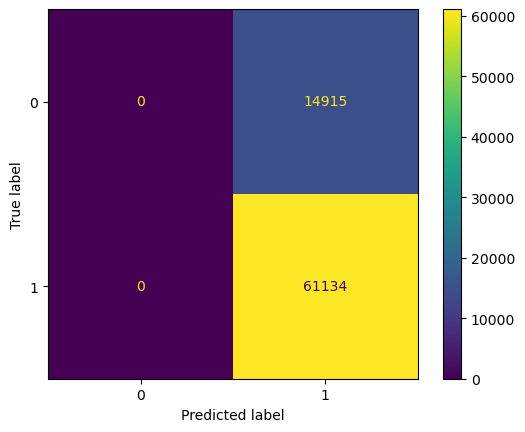

for c: 0.1
Train Data


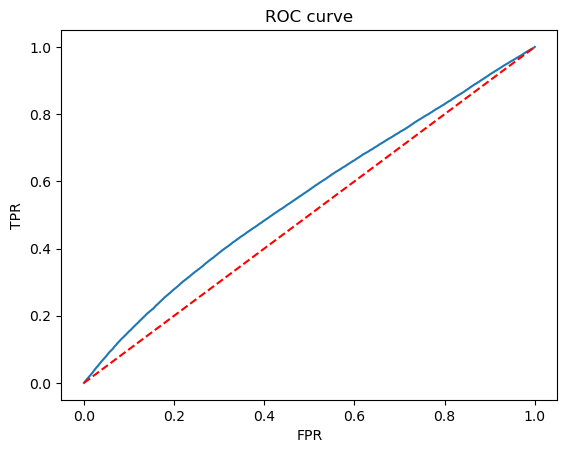

Test Data


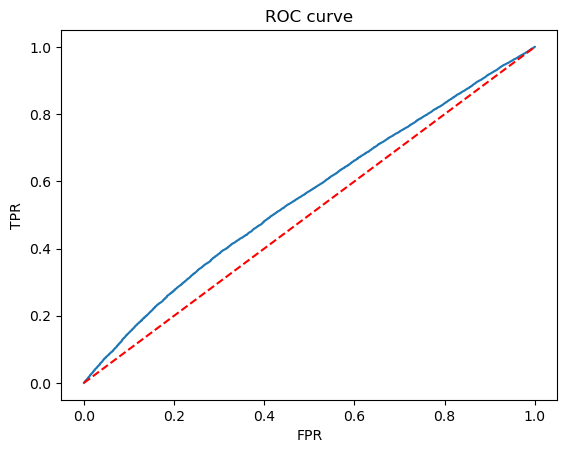

Train Metrics...
ROC AUC score 0.5542201109143228
 Precision: 0.8035
 Recall: 1.0000
 F1 Score: 0.8910
Accuracy: 0.8035


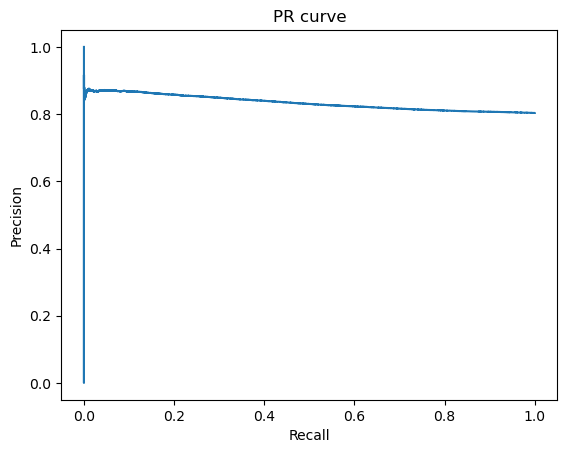

AUC score 0.8337222746511307
Test Metrics...
ROC AUC score 0.5529177054069198
 Precision: 0.8039
 Recall: 1.0000
 F1 Score: 0.8913
Accuracy: 0.8039


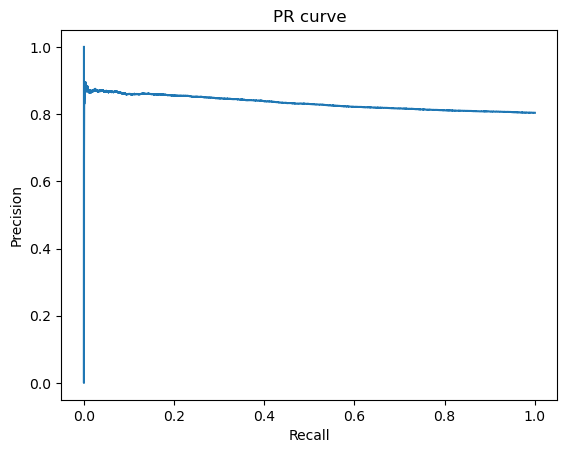

AUC score 0.8328818288577473


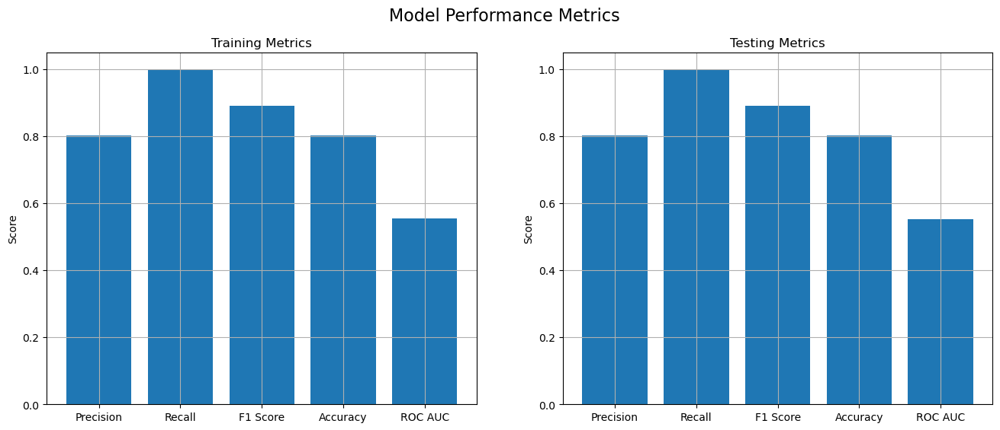

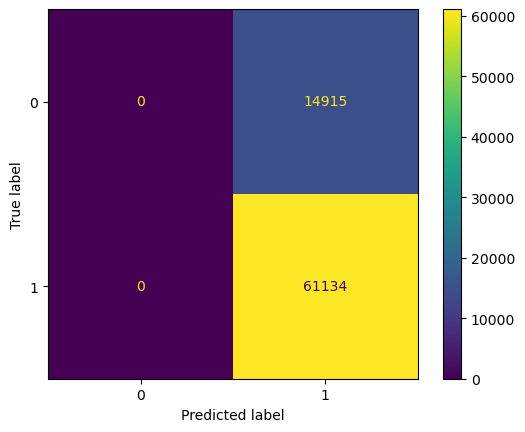

for c: 1
Train Data


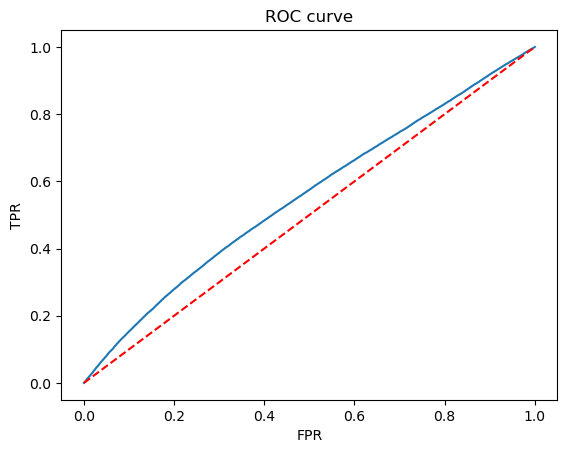

Test Data


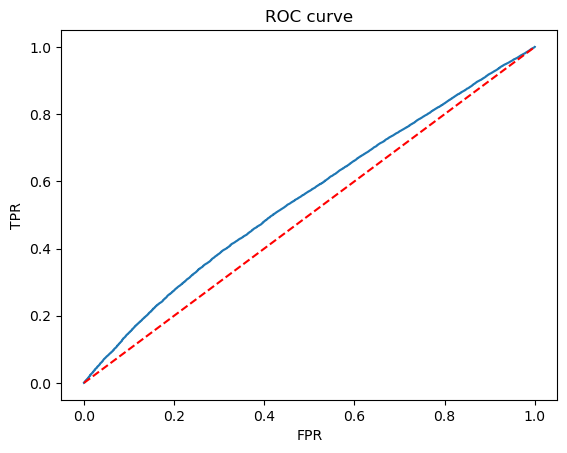

Train Metrics...
ROC AUC score 0.5544031723093692
 Precision: 0.8035
 Recall: 1.0000
 F1 Score: 0.8910
Accuracy: 0.8035


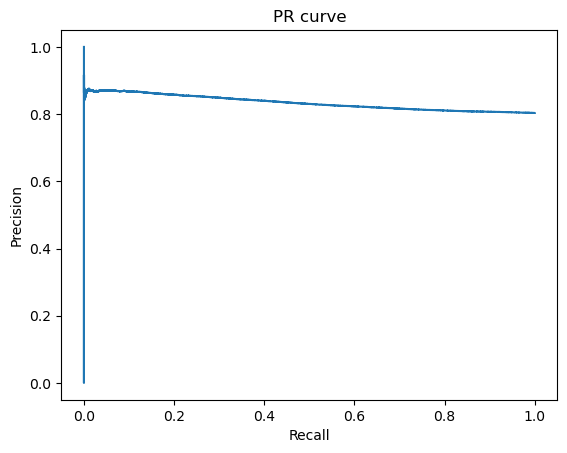

AUC score 0.8337665136554604
Test Metrics...
ROC AUC score 0.5530898425611348
 Precision: 0.8039
 Recall: 1.0000
 F1 Score: 0.8913
Accuracy: 0.8039


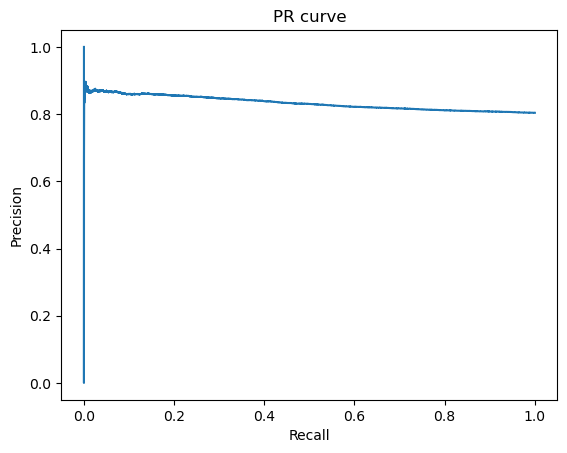

AUC score 0.8329242672003335


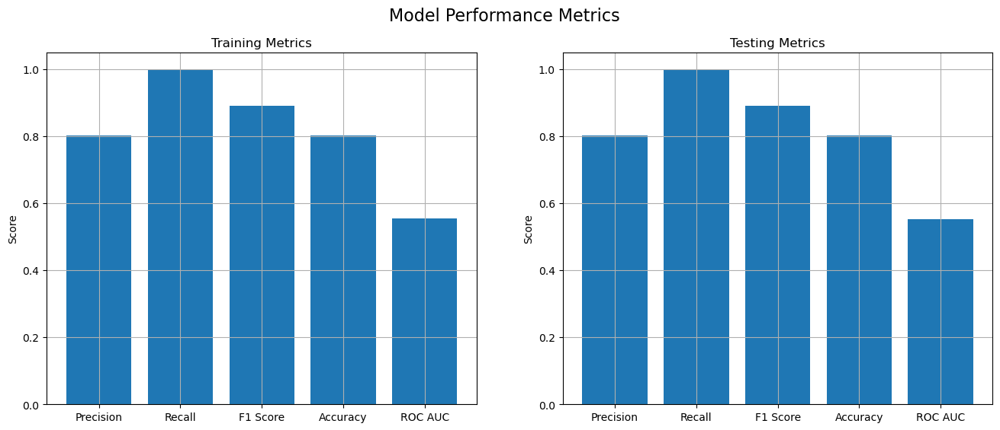

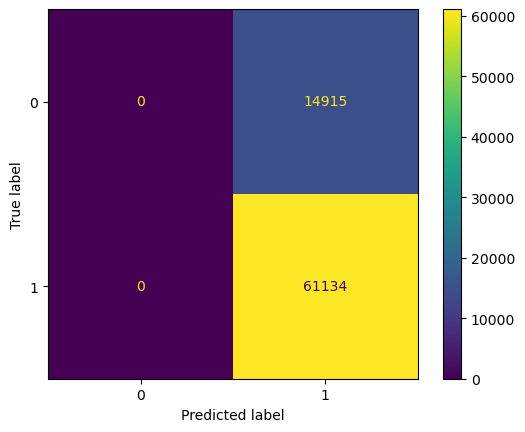

for c: 10
Train Data


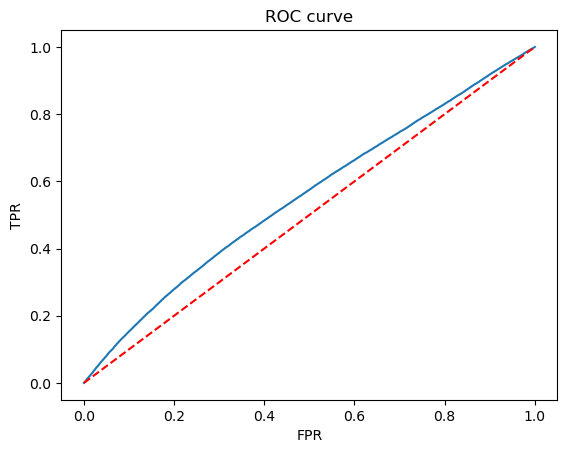

Test Data


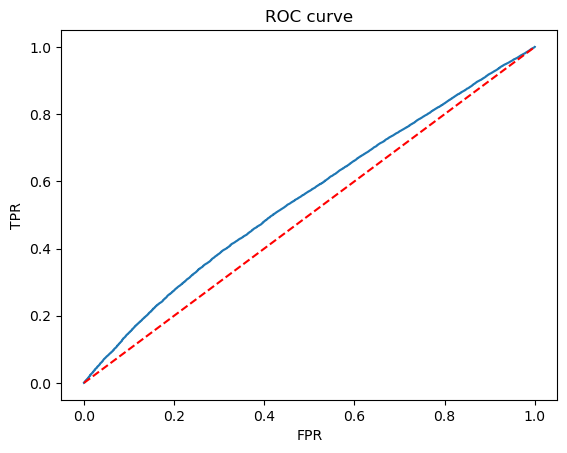

Train Metrics...
ROC AUC score 0.5544031723093692
 Precision: 0.8035
 Recall: 1.0000
 F1 Score: 0.8910
Accuracy: 0.8035


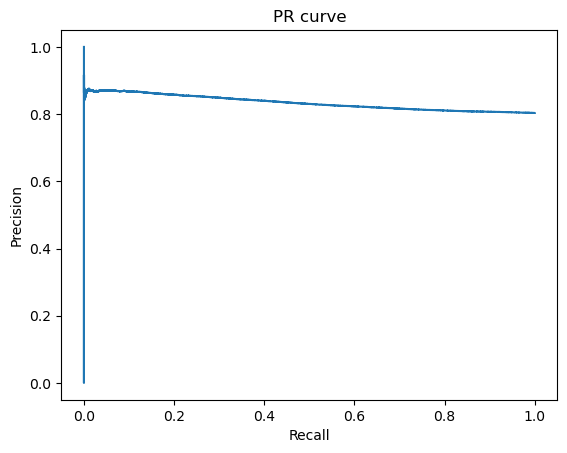

AUC score 0.8337665136554604
Test Metrics...
ROC AUC score 0.5530898425611348
 Precision: 0.8039
 Recall: 1.0000
 F1 Score: 0.8913
Accuracy: 0.8039


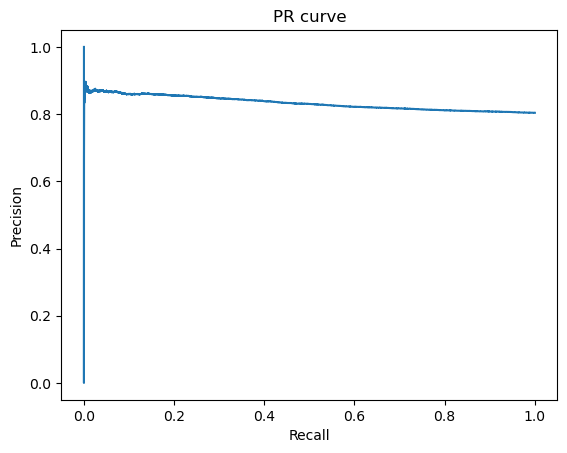

AUC score 0.8329242672003335


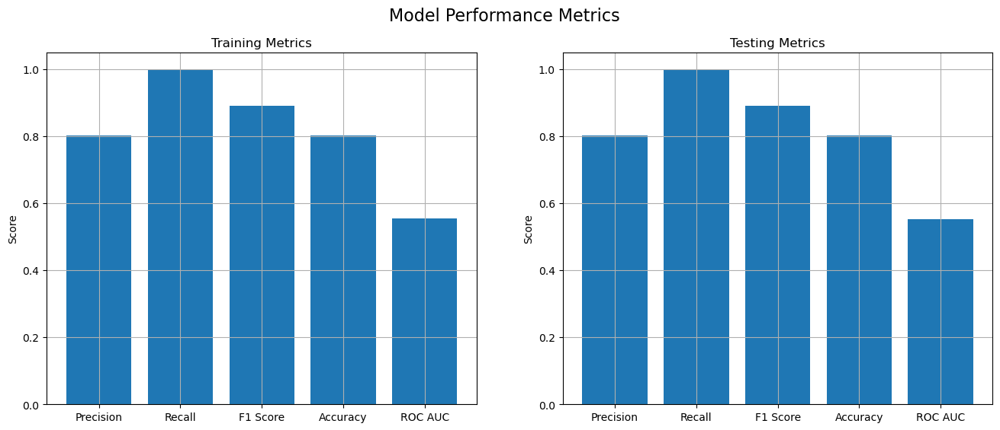

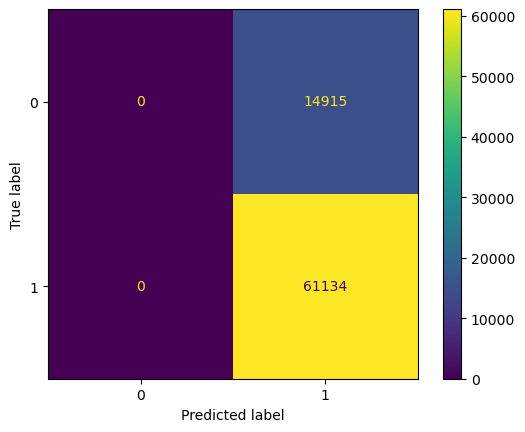

for c: 100
Train Data


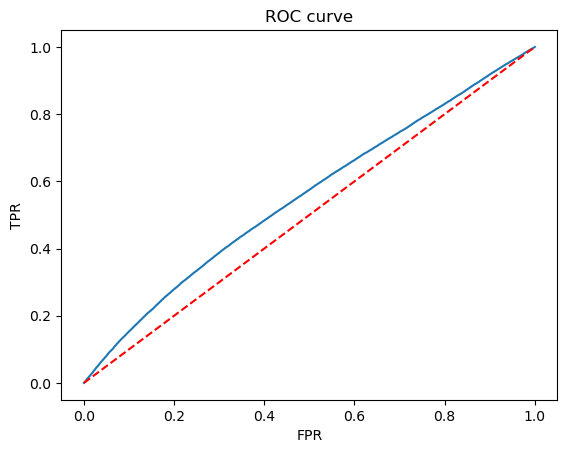

Test Data


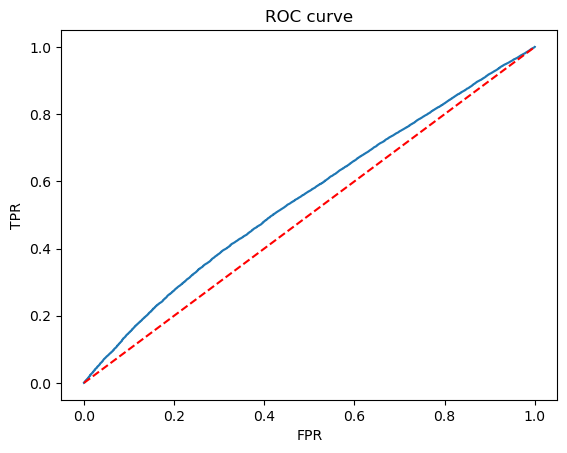

Train Metrics...
ROC AUC score 0.5544031723093692
 Precision: 0.8035
 Recall: 1.0000
 F1 Score: 0.8910
Accuracy: 0.8035


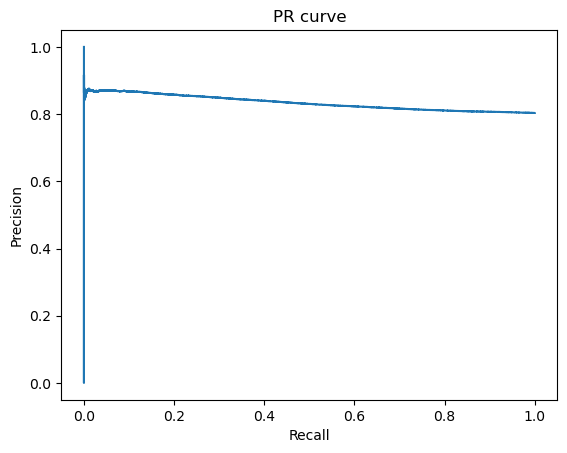

AUC score 0.8337665136554604
Test Metrics...
ROC AUC score 0.5530898425611348
 Precision: 0.8039
 Recall: 1.0000
 F1 Score: 0.8913
Accuracy: 0.8039


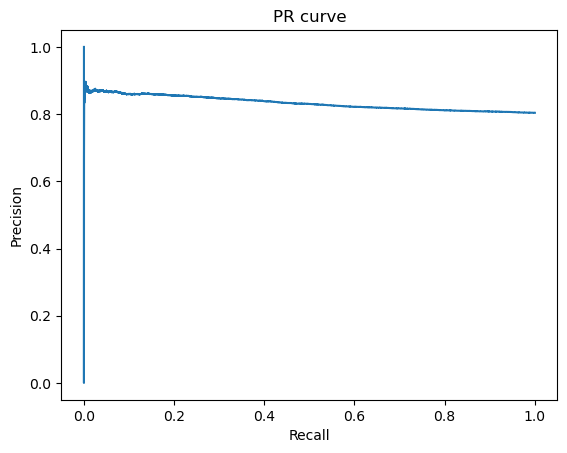

AUC score 0.8329242672003335


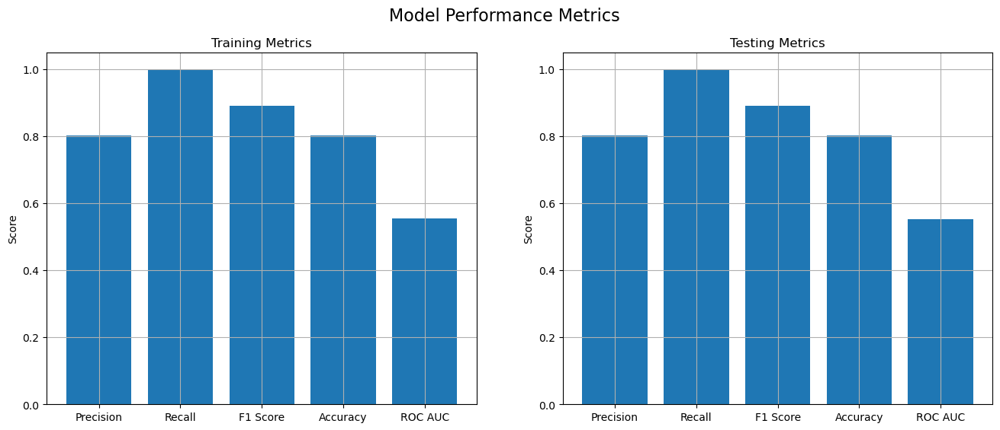

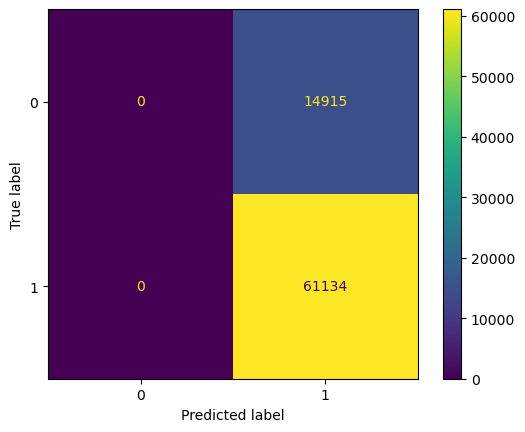

for c: 1000
Train Data


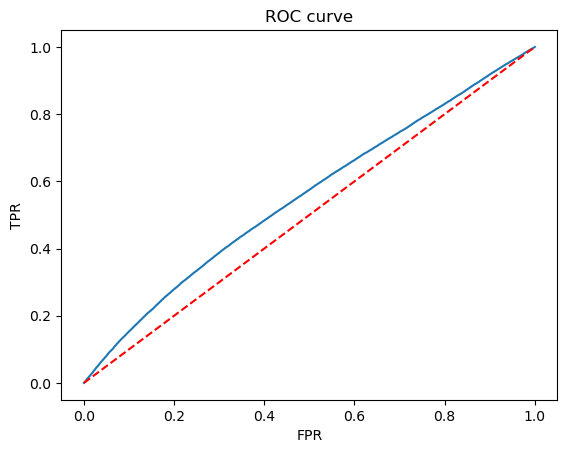

Test Data


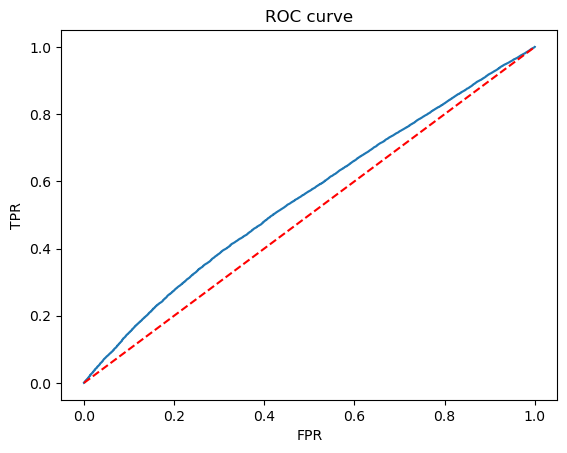

Train Metrics...
ROC AUC score 0.5544031723093692
 Precision: 0.8035
 Recall: 1.0000
 F1 Score: 0.8910
Accuracy: 0.8035


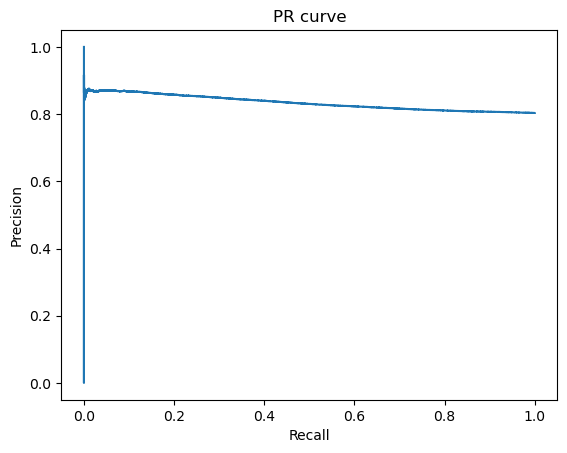

AUC score 0.8337665136554604
Test Metrics...
ROC AUC score 0.5530898425611348
 Precision: 0.8039
 Recall: 1.0000
 F1 Score: 0.8913
Accuracy: 0.8039


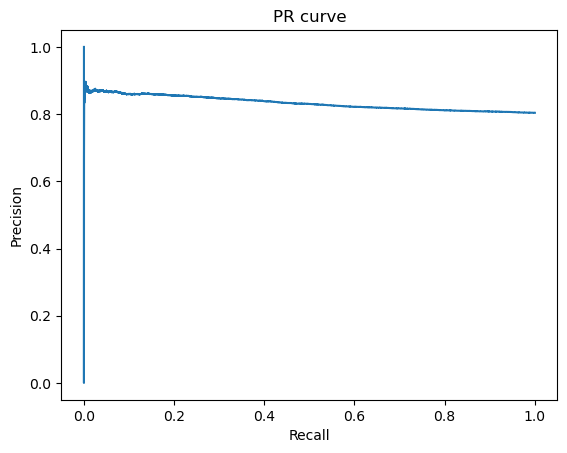

AUC score 0.8329242672003335


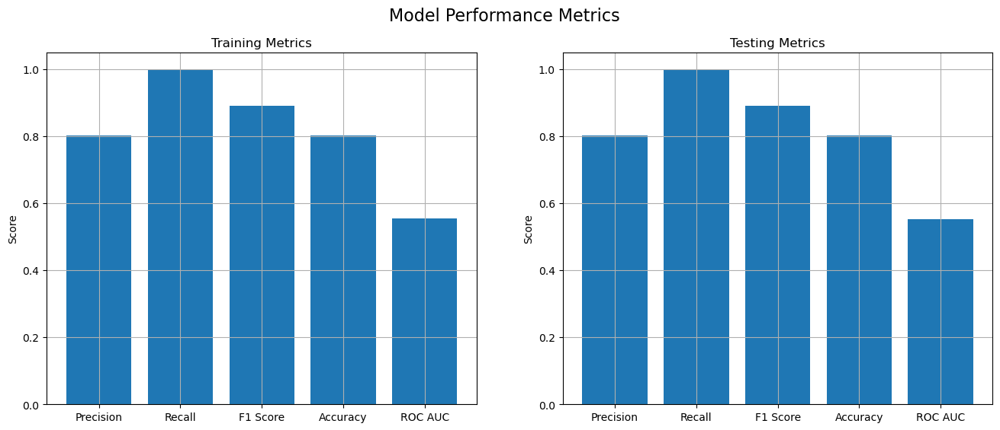

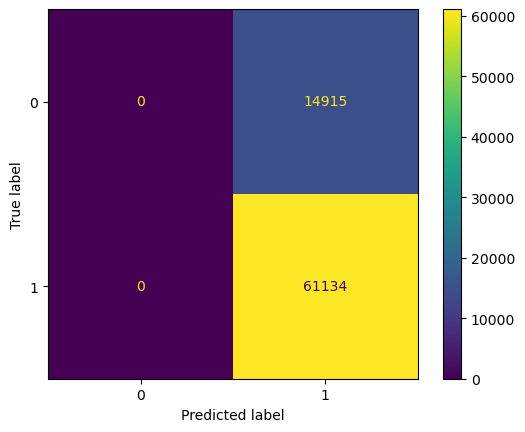

,C,precision,recall,f1,accuracy,rocauc
0,0.0001l2,0.803879,0.999951,0.891259,0.803850,0.555351
1,0.0001elasticnet,0.803876,1.000000,0.891277,0.803876,0.554106
2,0.001elasticnet,0.803876,1.000000,0.891277,0.803876,0.553588
3,0.01elasticnet,0.803876,1.000000,0.891277,0.803876,0.552949
4,0.1elasticnet,0.803876,1.000000,0.891277,0.803876,0.552918
5,1elasticnet,0.803876,1.000000,0.891277,0.803876,0.553090
6,10elasticnet,0.803876,1.000000,0.891277,0.803876,0.553090
7,100elasticnet,0.803876,1.000000,0.891277,0.803876,0.553090
8,1000elasticnet,0.803876,1.000000,0.891277,0.803876,0.553090


In [50]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split

# Create polynomial features
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(df)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_poly, label, test_size=0.2, random_state=42)

# Train logistic regression
model = LogisticRegression()
for c in [0.0001,0.001,0.01,0.1,1,10,100,1000]:
    print("for c:",c)
    model = LogisticRegression(C=c,n_jobs=-1,penalty="l2")
    precision_test, recall_test, f1_test, accuracy_test,roc_auc_test = modelBuild(model,X_train,y_train,X_test,y_test)
    Metric[str(c)+reg]["precision"] = precision_test
    Metric[str(c)+reg]["recall"] = recall_test
    Metric[str(c)+reg]["f1"] = f1_test
    Metric[str(c)+reg]["accuracy"] = accuracy_test
    Metric[str(c)+reg]["rocauc"] = roc_auc_test

    print("="*100)
metricToDf(Metric)

# ROCAUC affected due to polynomail feaures

In [53]:
X_train, X_test, y_train, y_test = train_test_split(df, label, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

X_train = pd.DataFrame(X_train,columns = df.columns)
X_test = pd.DataFrame(X_test,columns = df.columns)
Metric = defaultdict(dict)

for c: 0.0001
Train Data


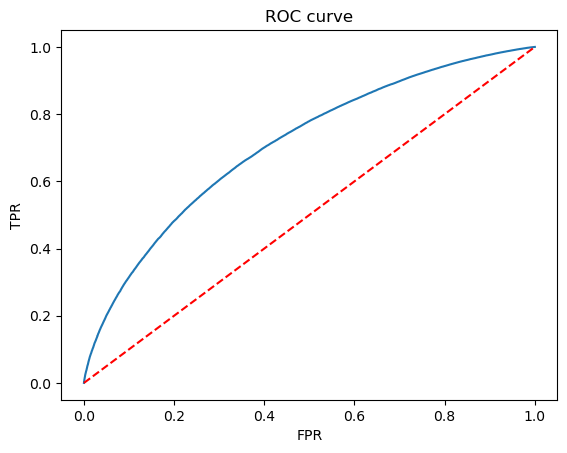

Test Data


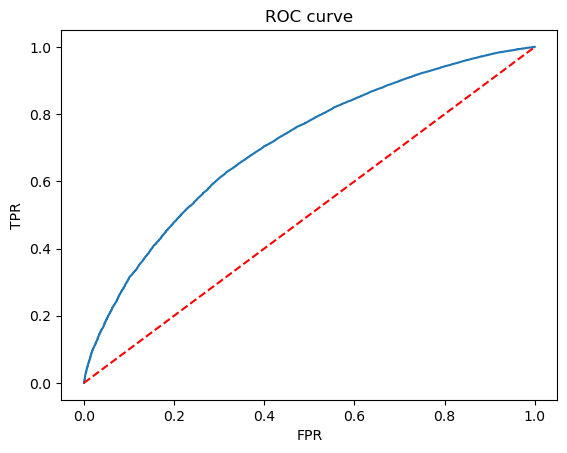

Train Metrics...
ROC AUC score 0.7086968103751985
 Precision: 0.8104
 Recall: 0.9888
 F1 Score: 0.8907
Accuracy: 0.8051


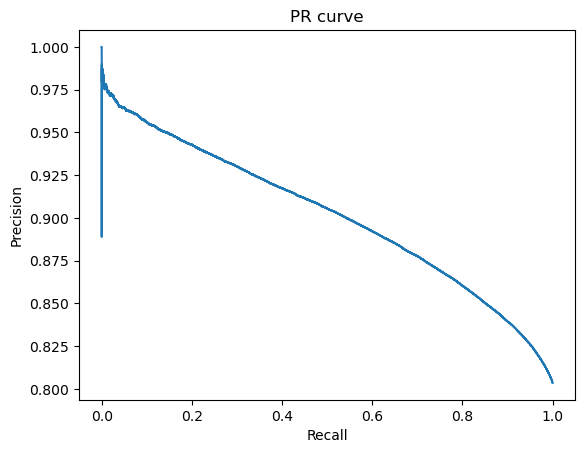

AUC score 0.9014026538723725
Test Metrics...
ROC AUC score 0.7083786136949634
 Precision: 0.8112
 Recall: 0.9888
 F1 Score: 0.8912
Accuracy: 0.8060


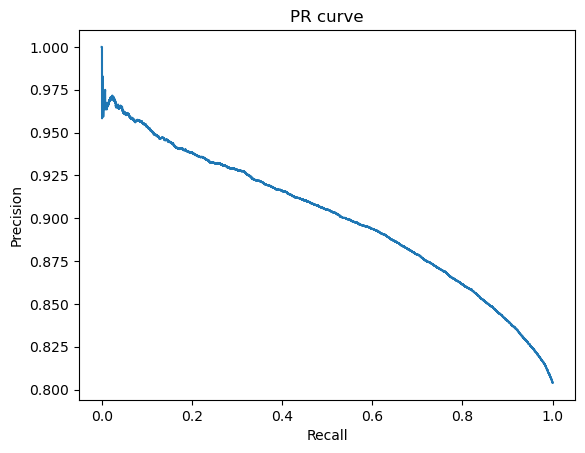

AUC score 0.900430348279633


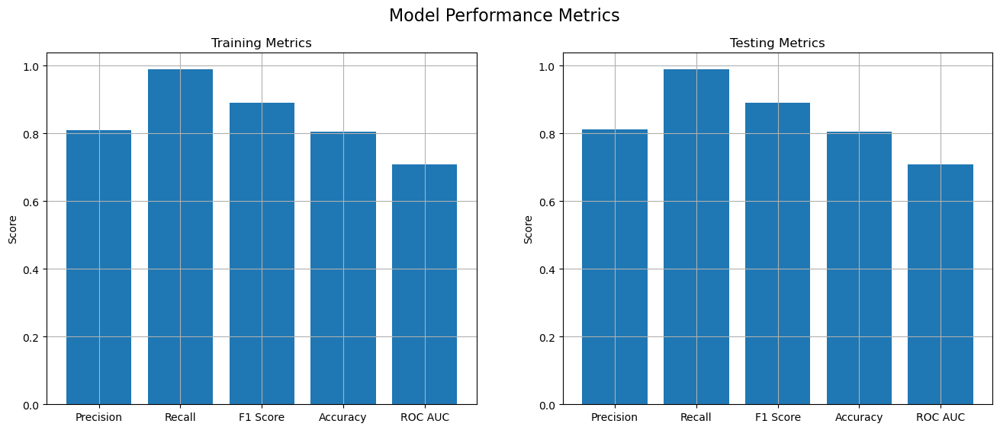

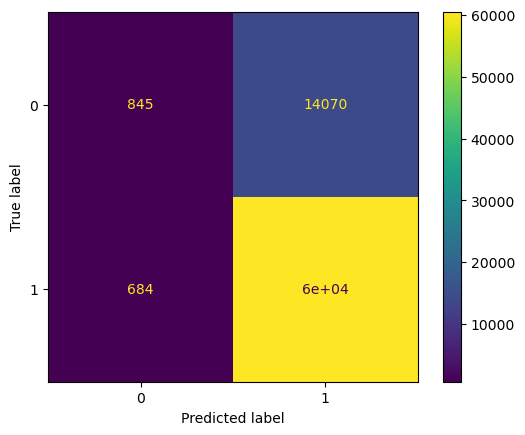

for c: 0.001
Train Data


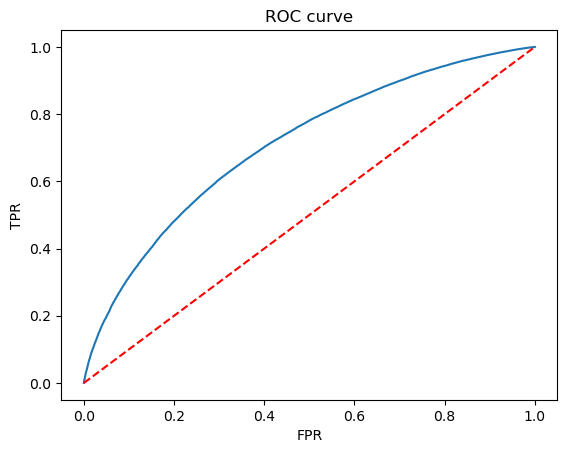

Test Data


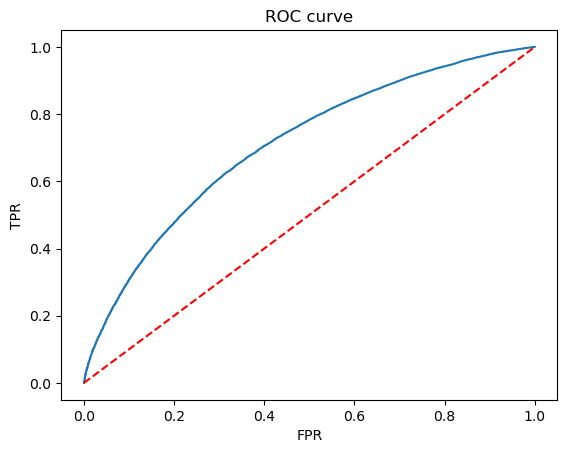

Train Metrics...
ROC AUC score 0.7091888194202054
 Precision: 0.8133
 Recall: 0.9834
 F1 Score: 0.8903
Accuracy: 0.8053


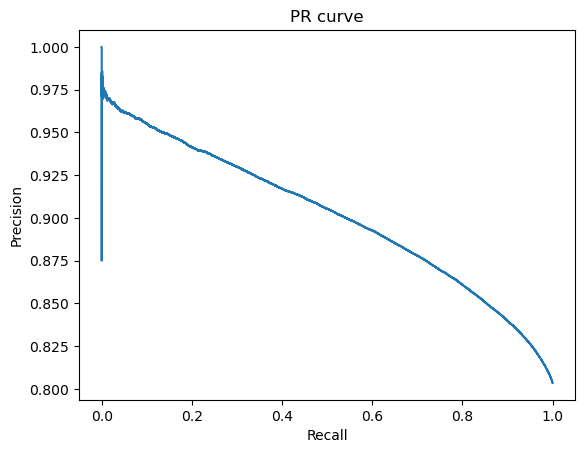

AUC score 0.9011683188858971
Test Metrics...
ROC AUC score 0.7088160824886129
 Precision: 0.8145
 Recall: 0.9835
 F1 Score: 0.8910
Accuracy: 0.8066


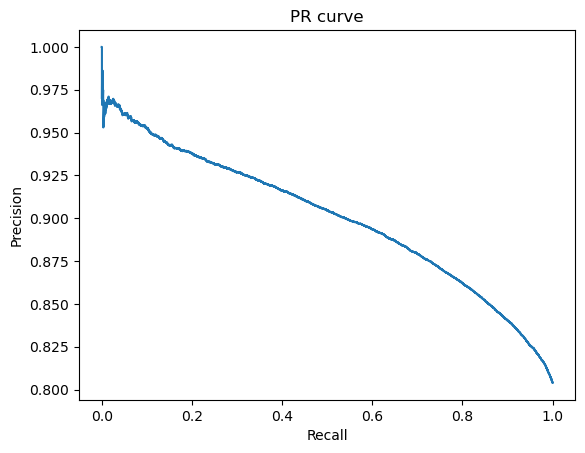

AUC score 0.9003163797764959


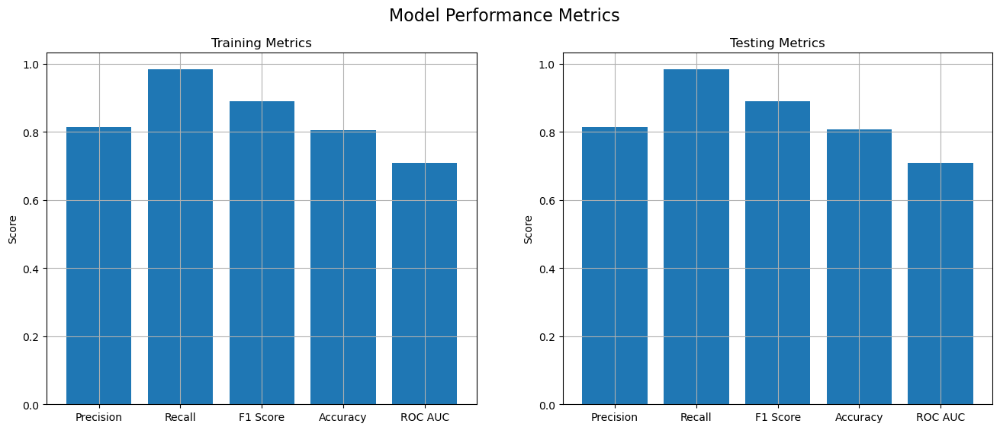

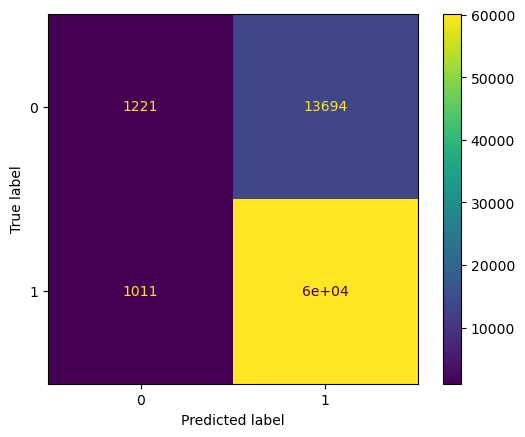

for c: 0.01
Train Data


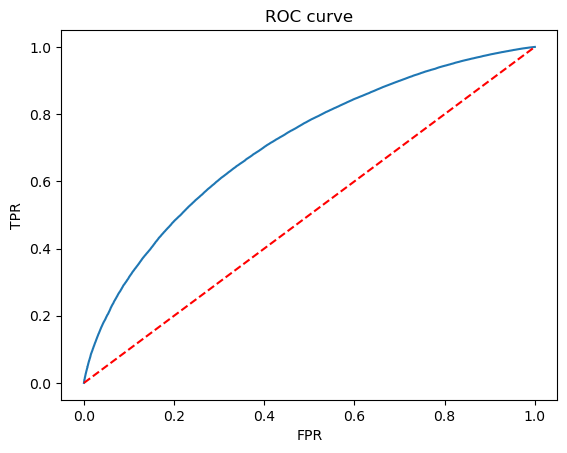

Test Data


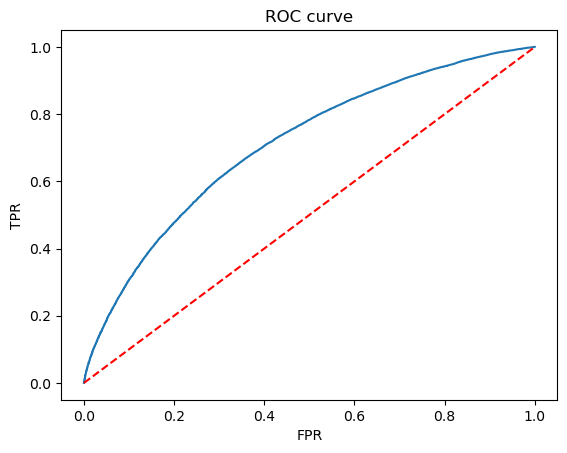

Train Metrics...
ROC AUC score 0.7092547405756691
 Precision: 0.8137
 Recall: 0.9824
 F1 Score: 0.8902
Accuracy: 0.8052


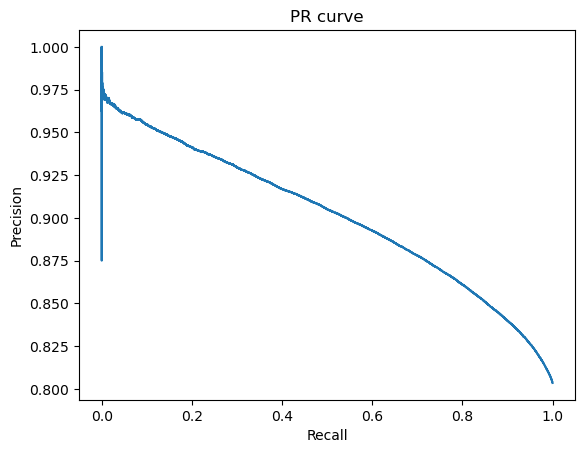

AUC score 0.9010532010460004
Test Metrics...
ROC AUC score 0.7089223564013263
 Precision: 0.8149
 Recall: 0.9825
 F1 Score: 0.8909
Accuracy: 0.8065


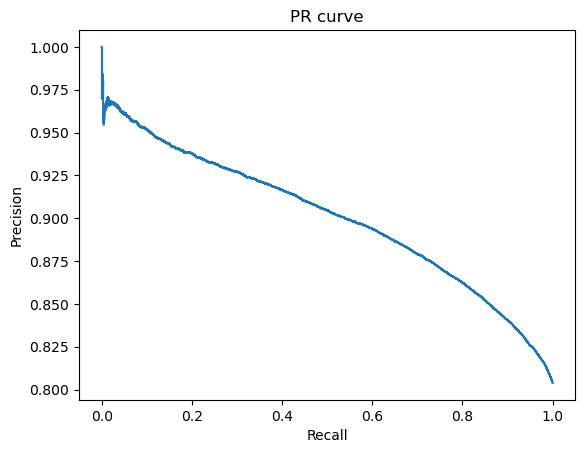

AUC score 0.9002521562222227


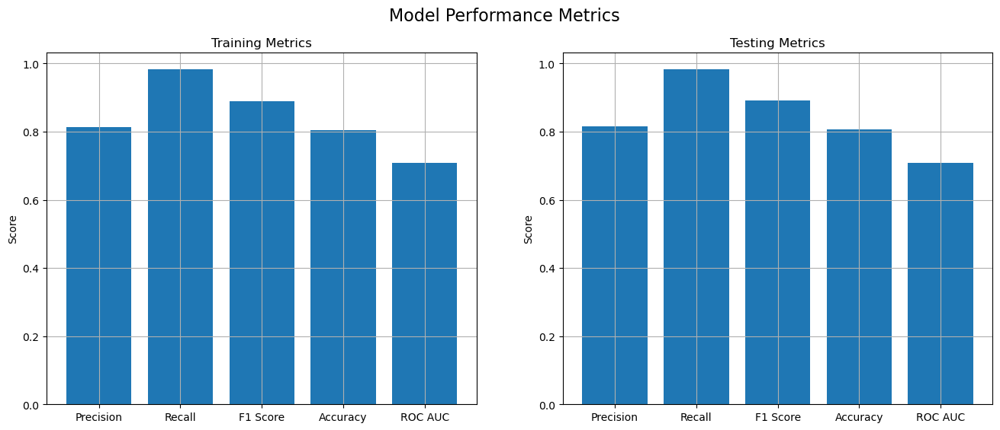

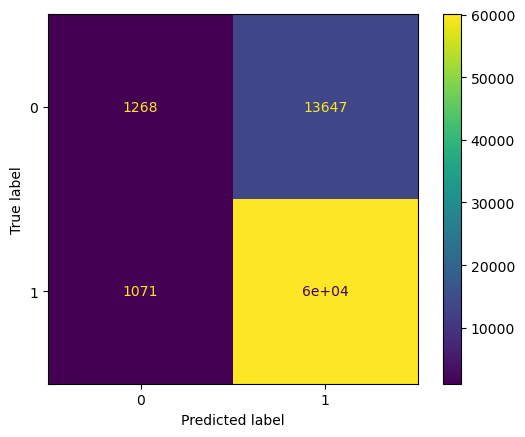

for c: 0.1
Train Data


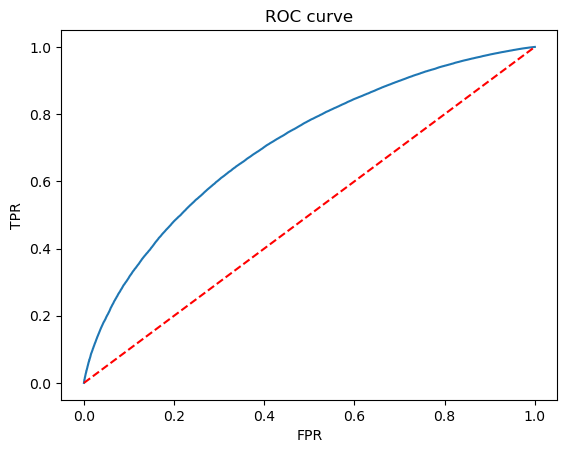

Test Data


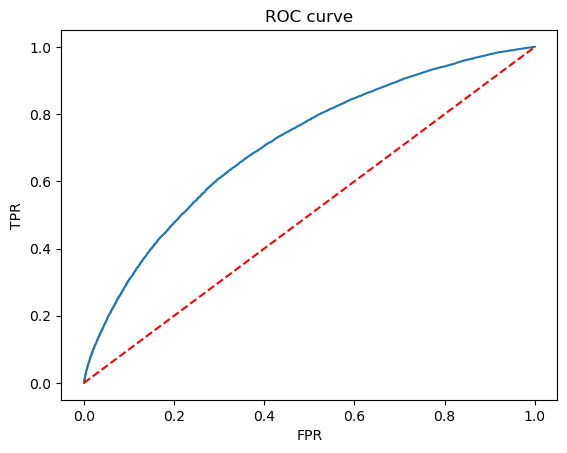

Train Metrics...
ROC AUC score 0.7092591651858793
 Precision: 0.8138
 Recall: 0.9823
 F1 Score: 0.8901
Accuracy: 0.8052


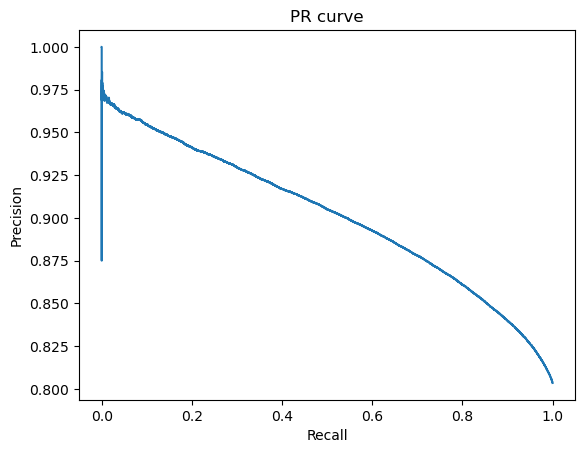

AUC score 0.9010369674636785
Test Metrics...
ROC AUC score 0.7089318671170087
 Precision: 0.8149
 Recall: 0.9824
 F1 Score: 0.8908
Accuracy: 0.8064


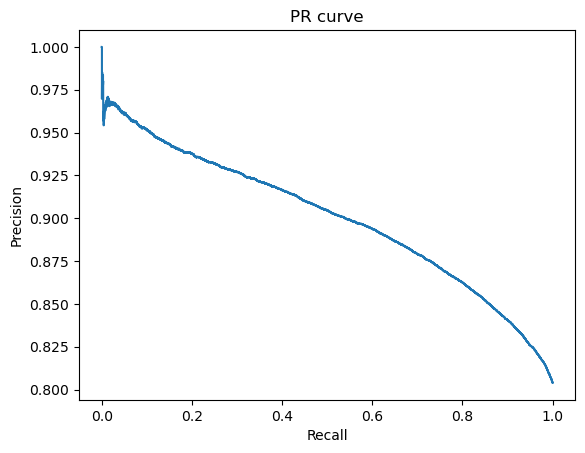

AUC score 0.9002440649478742


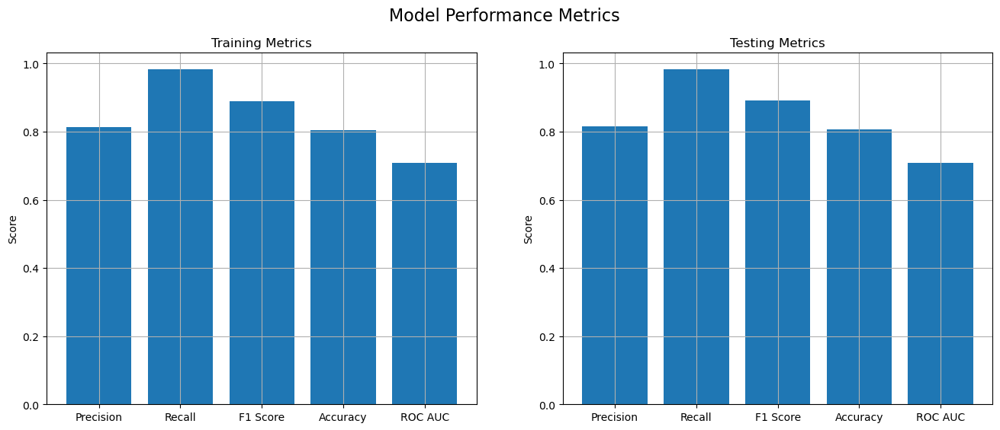

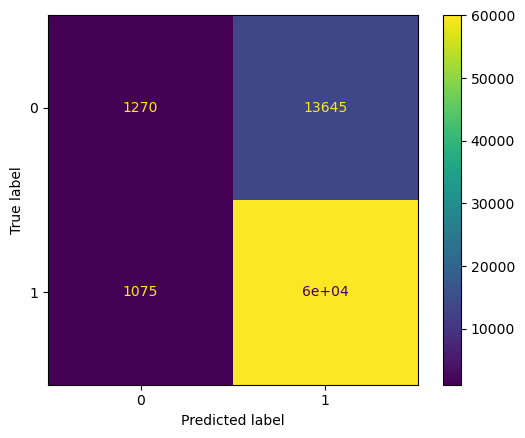

for c: 1
Train Data


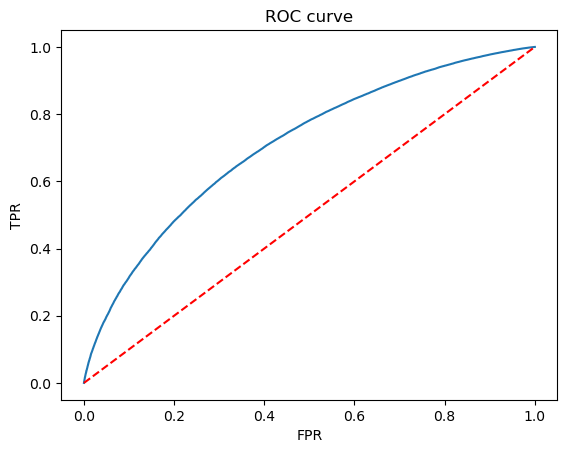

Test Data


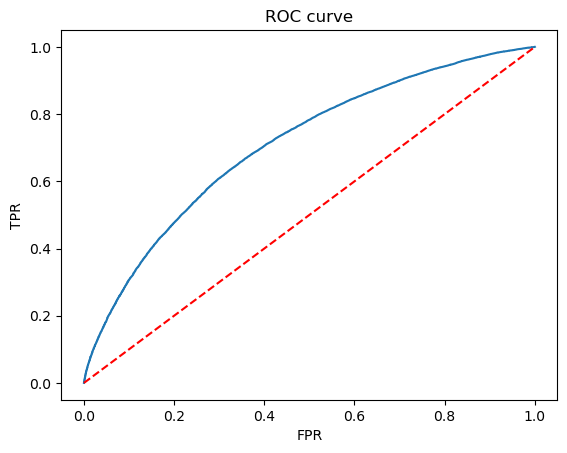

Train Metrics...
ROC AUC score 0.7092595404335595
 Precision: 0.8138
 Recall: 0.9823
 F1 Score: 0.8901
Accuracy: 0.8052


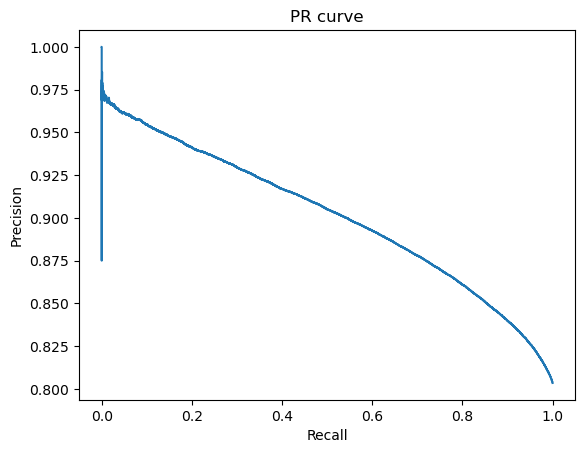

AUC score 0.9010352531229185
Test Metrics...
ROC AUC score 0.7089333268451653
 Precision: 0.8149
 Recall: 0.9824
 F1 Score: 0.8908
Accuracy: 0.8064


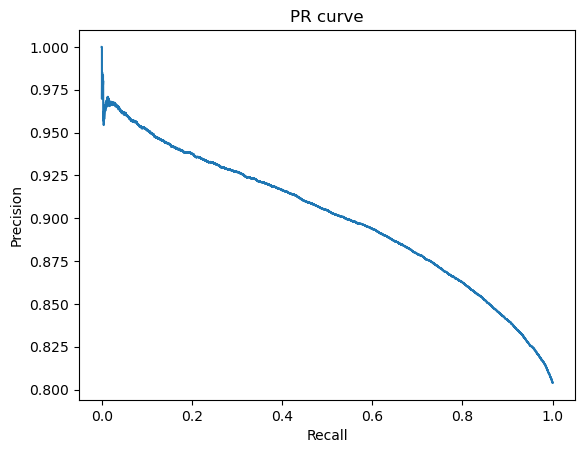

AUC score 0.9002437203163983


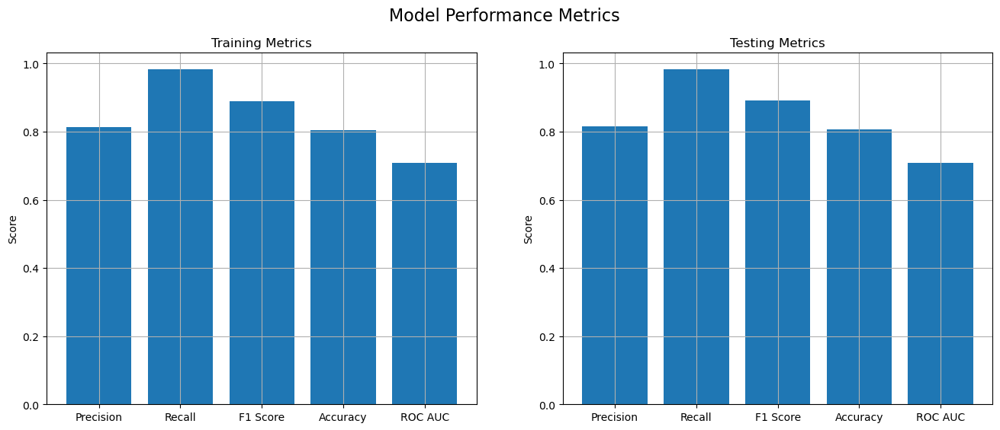

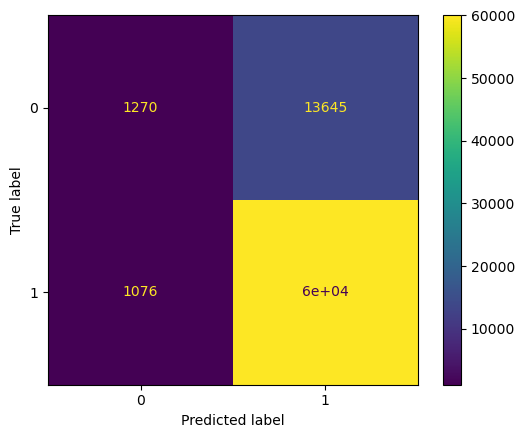

for c: 10
Train Data


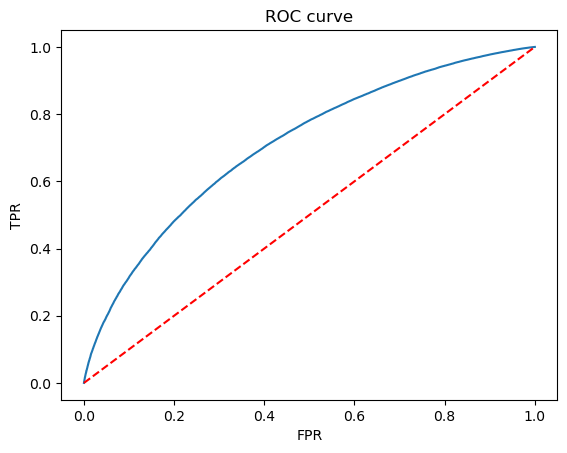

Test Data


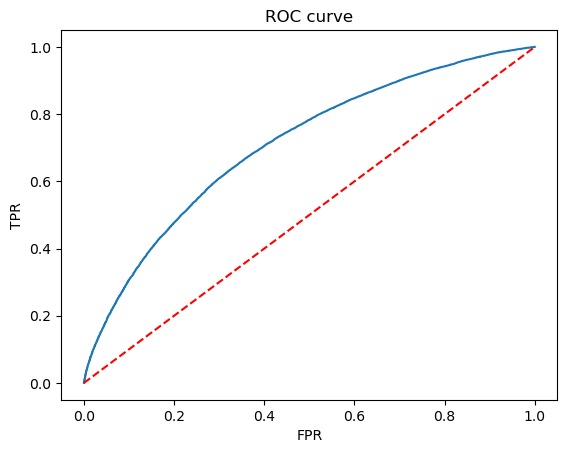

Train Metrics...
ROC AUC score 0.7092595183279602
 Precision: 0.8138
 Recall: 0.9823
 F1 Score: 0.8901
Accuracy: 0.8052


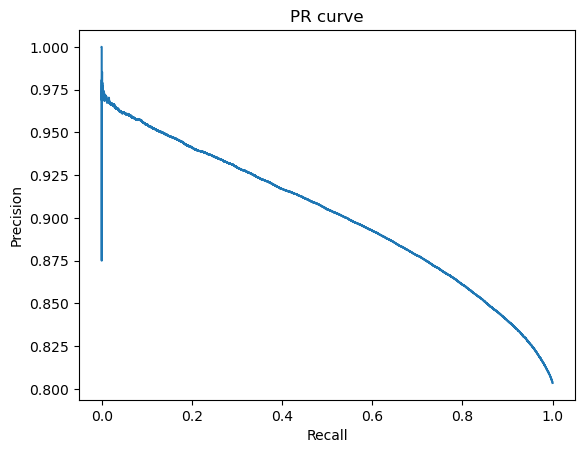

AUC score 0.9010350502410738
Test Metrics...
ROC AUC score 0.7089332676225353
 Precision: 0.8149
 Recall: 0.9824
 F1 Score: 0.8908
Accuracy: 0.8064


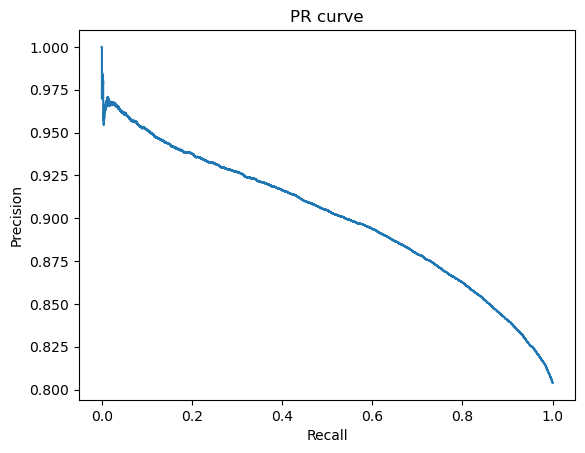

AUC score 0.9002435264752143


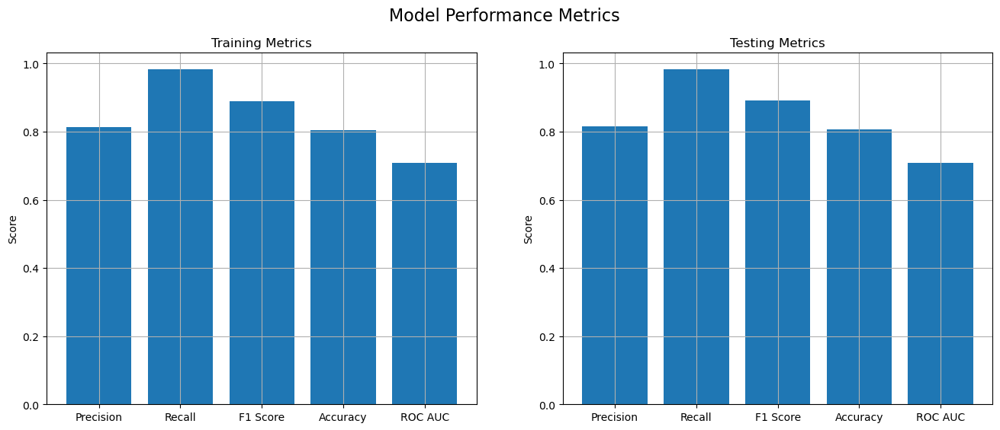

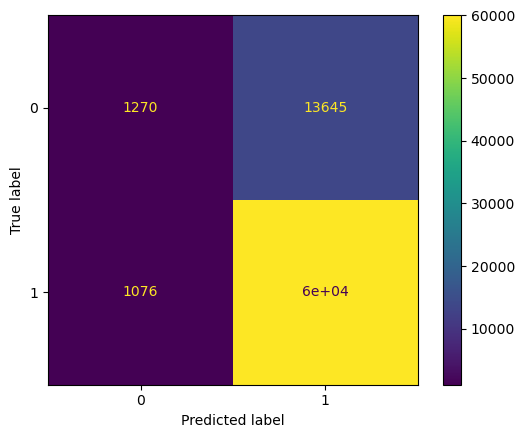

for c: 100
Train Data


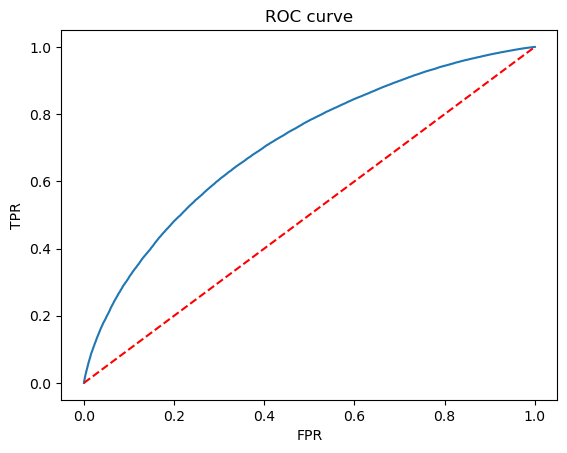

Test Data


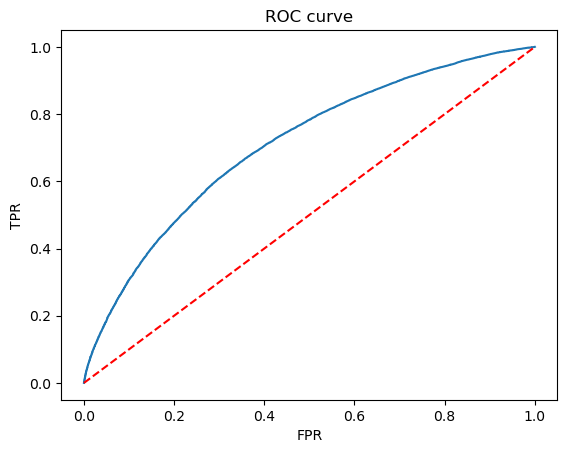

Train Metrics...
ROC AUC score 0.7092595181910835
 Precision: 0.8138
 Recall: 0.9823
 F1 Score: 0.8901
Accuracy: 0.8052


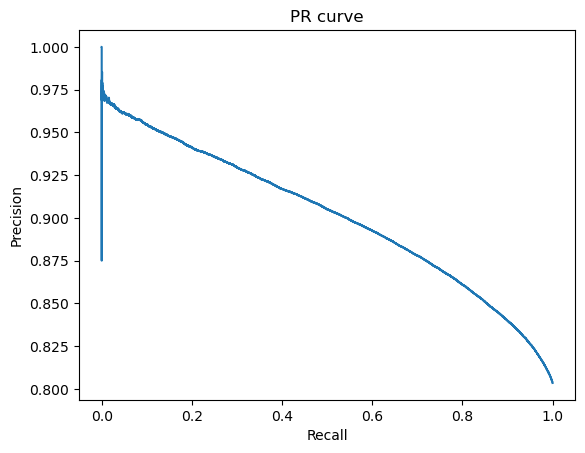

AUC score 0.9010350330057301
Test Metrics...
ROC AUC score 0.708933299427281
 Precision: 0.8149
 Recall: 0.9824
 F1 Score: 0.8908
Accuracy: 0.8064


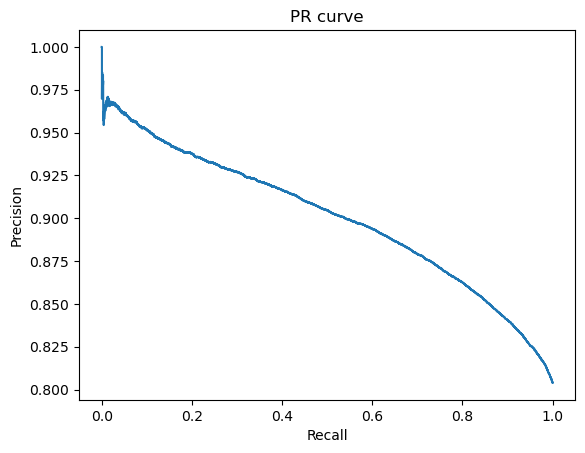

AUC score 0.9002435376497193


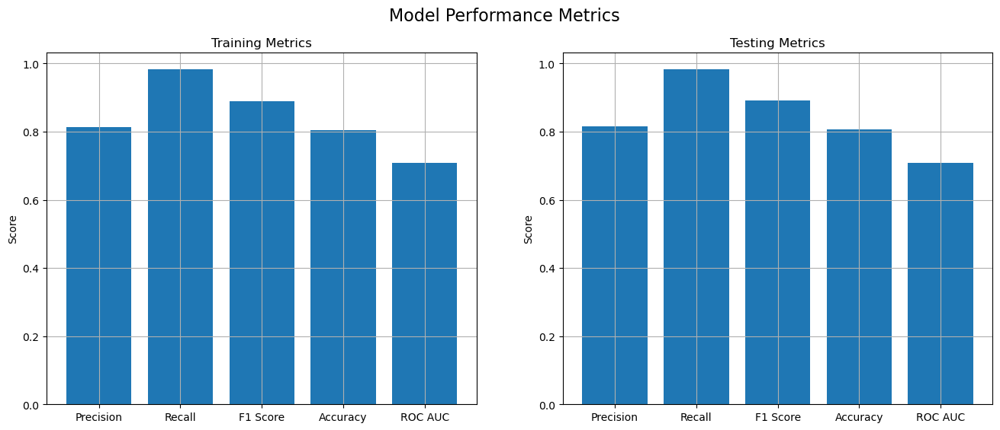

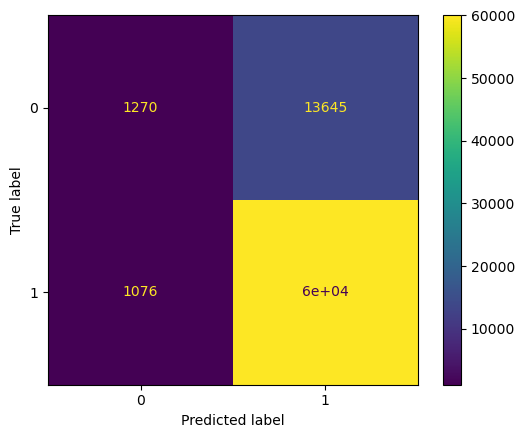

for c: 1000
Train Data


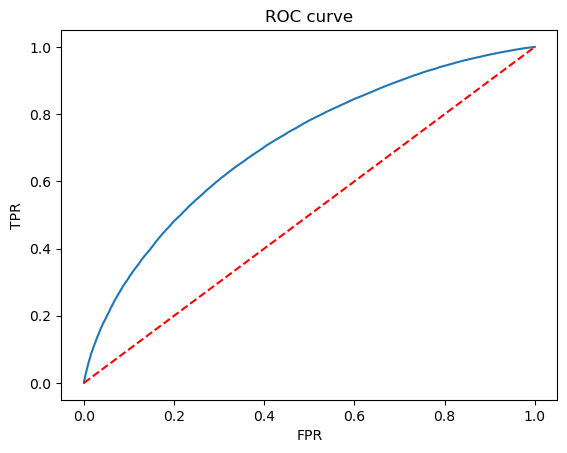

Test Data


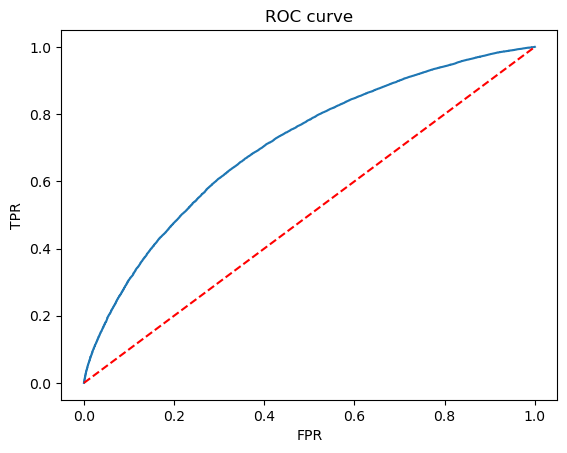

Train Metrics...
ROC AUC score 0.7092595187385906
 Precision: 0.8138
 Recall: 0.9823
 F1 Score: 0.8901
Accuracy: 0.8052


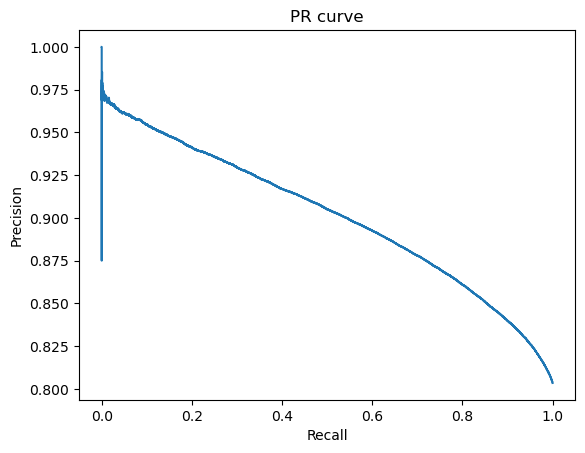

AUC score 0.9010350320140821
Test Metrics...
ROC AUC score 0.7089332884601274
 Precision: 0.8149
 Recall: 0.9824
 F1 Score: 0.8908
Accuracy: 0.8064


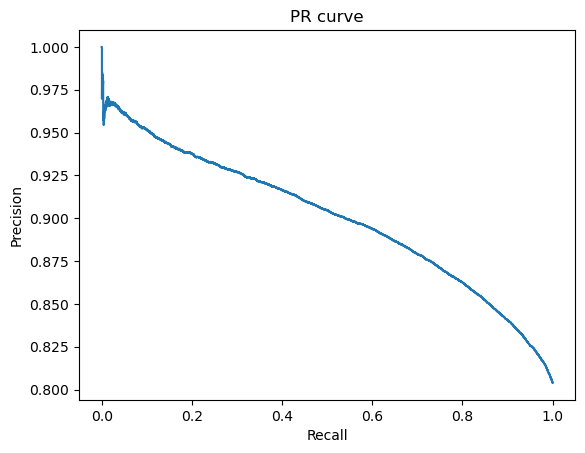

AUC score 0.9002435256627342


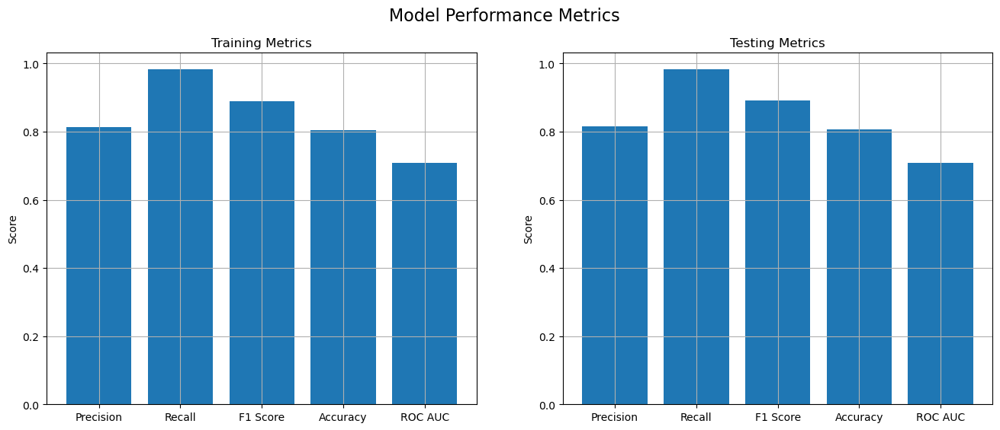

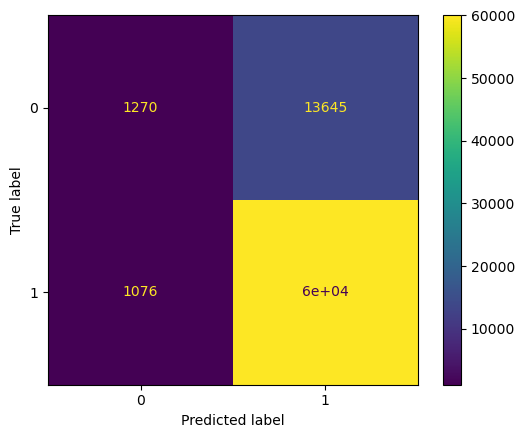

,C,precision,recall,f1,accuracy,rocauc
3,0.1000,0.814868,0.982416,0.890832,0.806441,0.708932
4,1.0000,0.814865,0.982399,0.890824,0.806427,0.708933
5,10.0000,0.814865,0.982399,0.890824,0.806427,0.708933
6,100.0000,0.814865,0.982399,0.890824,0.806427,0.708933
7,1000.0000,0.814865,0.982399,0.890824,0.806427,0.708933
2,0.0100,0.814856,0.982481,0.890852,0.806467,0.708922
1,0.0010,0.814487,0.983463,0.891035,0.806638,0.708816
0,0.0001,0.811192,0.988811,0.891238,0.805994,0.708379


In [54]:
for c in [0.0001,0.001,0.01,0.1,1,10,100,1000]:
    print("for c:",c)
    model = LogisticRegression(C=c)
    precision_test, recall_test, f1_test, accuracy_test,roc_auc_test = modelBuild(model,X_train,y_train,X_test,y_test)
    Metric[c]["precision"] = precision_test
    Metric[c]["recall"] = recall_test
    Metric[c]["f1"] = f1_test
    Metric[c]["accuracy"] = accuracy_test
    Metric[c]["rocauc"] = roc_auc_test
    
    print("="*100)
metricToDf(Metric)

# Best model

In [55]:
model = LogisticRegression(C=0.1)
model.fit(X_train,y_train)

LogisticRegression(C=0.1)

In [64]:

# Get the feature names (assuming X_train is a pandas DataFrame)
feature_names = X_train.columns

# Extract coefficients
coefficients = model.coef_[0]

# Create a DataFrame with feature names and their corresponding coefficients
feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefficients
})

# Sort features by absolute value of coefficients
feature_importance['Abs_Coefficient'] = np.abs(feature_importance['Coefficient'])
feature_importance = feature_importance.sort_values(by='Abs_Coefficient', ascending=False)


# Important features

In [65]:
feature_importance

,Feature,Coefficient,Abs_Coefficient
4,grade,-0.359718,0.359718
1,term,-0.204015,0.204015
7,dti,-0.198831,0.198831
6,annual_inc,0.191570,0.191570
8,open_acc,-0.127426,0.127426
11,revol_util,-0.109648,0.109648
12,total_acc,0.101405,0.101405
25,verification_status_source verified,-0.090221,0.090221
2,int_rate,-0.078982,0.078982
9,pub_rec,-0.076246,0.076246


# Model intercept

In [60]:
model.intercept_

array([1.57784368])

In [61]:
model.feature_names_in_

array(['loan_amnt', 'term', 'int_rate', 'installment', 'grade',
       'emp_length', 'annual_inc', 'dti', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'mort_acc',
       'pub_rec_bankruptcies', 'Pub_rec', 'Mort_acc',
       'Pub_rec_bankruptcies', 'diff_issue_credit_line',
       'emp_title_encoded', 'home_ownership_mortgage',
       'home_ownership_none', 'home_ownership_other',
       'home_ownership_own', 'home_ownership_rent',
       'verification_status_source verified',
       'verification_status_verified', 'purpose_credit_card',
       'purpose_debt_consolidation', 'purpose_educational',
       'purpose_home_improvement', 'purpose_house',
       'purpose_major_purchase', 'purpose_medical', 'purpose_moving',
       'purpose_other', 'purpose_renewable_energy',
       'purpose_small_business', 'purpose_vacation', 'purpose_wedding',
       'application_type_individual', 'application_type_joint',
       'initial_list_status_w'], dtype=object)

## How can we make sure that our model can detect real defaulters and there are less false positives? This is important as we can lose out on an opportunity to finance more individuals and earn interest on it. 

Used SMOTE: Applied SMOTE for oversampling defaulters to balance the dataset.

Hyperparameter Tuning: Implemented hyperparameter tuning to optimize model performance.

K-Fold Cross-Validation: Used K-Fold Cross-Validation to enhance model robustness.

Adjusted Decision Threshold: Fine-tuned the threshold to balance false positives and recall.

Focused on Precision: Directed efforts towards improving precision to minimize false positives and maximize financing opportunities.

## Since NPA (non-performing asset) is a real problem in this industry, it’s important we play safe and shouldn’t disburse loans to anyone

No, we shouldn't avoid all loan disbursements.

Balance Risk and Opportunity: Avoiding all loans eliminates revenue opportunities and growth potential.

Improve Model Accuracy: Enhance the model to better identify high-risk applicants while approving creditworthy ones.

Optimize Precision and Recall: Aim for a balance that minimizes false positives and effectively identifies defaulters.

Assess Trade-offs: Weigh the costs of NPAs against the benefits of lending.

Implement Dynamic Management: Continuously update the model to manage risk and maximize loan approvals.

# Data Analysis Summary




Loan Tenure Impact:

    60 Months Tenure: 68% of individuals fully repaid their loan.
    36 Months Tenure: 84% of individuals fully repaid their loan.

Loan Repayment by Grade:

    Grade A: 93% of individuals fully repaid their loan.
    Job Roles and Loan Repayment:

    Top Job Roles for Full Repayment: Teacher, Project Manager, Manager.

Irrelevant Factors:

    Employment Length: No effect on loan repayment.
    Verification Status: No effect on loan repayment.
Charged-Off Loans:

    Top Categories: Small Business and General Business.

Outlier Treatment:

    Continuous variables are treated for outliers using Z-score strategy.

Significant Impact Analysis:

    Chi-square tests show significant impact of categorical variables on the target variable.
    
Correlation Insights:

    Installment and Interest Rate: High correlation (0.95).
    Open Account and Total Account: High correlation.

Data Cleaning:

    No duplicates found.
    Missing values (NaN) treated with Simple Imputer using Median.

Categorical Data Encoding:

    Columns with fewer categories are converted to numerical values using One-Hot Encoding (OHE).
    Columns with more categories are encoded using Label Encoding.




# Logistic Regression Model Summary



    Initial Model Performance
    
    Train Metrics:

    ROC AUC Score: 0.7093
    Precision: 0.8138
    Recall: 0.9823
    F1 Score: 0.8901
    Accuracy: 0.8052
    
    
    Test Metrics:

    ROC AUC Score: 0.7089
    Precision: 0.8149
    Recall: 0.9824
    F1 Score: 0.8908
    Accuracy: 0.8064
    
    Issue:
    High false positives
    
    
Model with Balanced Weights

    Train Metrics:

    ROC AUC Score: 0.7094
    Precision: 0.8829
    Recall: 0.6667
    F1 Score: 0.7597
    Accuracy: 0.6611
    Test Metrics:

    ROC AUC Score: 0.7090
    Precision: 0.8841
    Recall: 0.6680
    F1 Score: 0.7610
    Accuracy: 0.6628
    Issue:

    Decreased recall and performance in handling false negatives
    
    
Model with VIF (Variance Inflation Factor)

       No significant improvement observed
Model with Different Alpha (L2 Regularization)


Best Parameters (C = 0.1000):

    Precision: 0.8149
    Recall: 0.9824
    F1 Score: 0.8908
    Accuracy: 0.8064
    ROC AUC Score: 0.7089
    Issue:

    High false positives and false negatives persist
    
Model with SMOTE (Synthetic Minority Over-sampling Technique)

    Outcome:
    Precision did not improve significantly
    
Model with Polynomial Features

    Result:
    ROC AUC Score decreased from 0.70 to 0.55
    ROC AUC curve just above the mean for all cases
    
Summary


    The model initially performed well with high precision and recall but struggled with high false positives.
    Attempts to balance the classes using weighted adjustments and SMOTE did not significantly enhance precision or reduce false positives.
    The addition of polynomial features led to a notable decrease in ROC AUC, indicating a deterioration in model performance.

# Recommendation

Action: Collect More Comprehensive Data

Recommendation: Integrate additional data sources such as social media profiles, payment histories, and utility bill records to enhance credit assessments.

    Action: Deploy Advanced Models

Recommendation: Use Gradient Boosting Machines (GBM) or XGBoost for improved credit risk predictions.

    Action: Enhance Feature Engineering

Recommendation: Include features like debt-to-income ratio, employment stability, credit utilization rate, and historical repayment behavior to refine the model.

    Action: Personalize Repayment Terms

Recommendation: Develop customized loan terms based on individual financial profiles and risk assessments.

    Action: Monitor and Update Regularly

Recommendation: Continuously review and adjust the model based on performance metrics and real-world feedback